# Supporting information: Counter Intuitive Electrostatics upon Metal Ion Coordination to a Receptor with Two Homotopic Binding Sites

In [1]:
from __future__ import division, unicode_literals, print_function
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import os.path, os, sys, json
import scipy
import scipy.stats as stats
import brewer2mpl
bmap = brewer2mpl.get_map('Set1', 'qualitative', 5)
colors = bmap.mpl_colors
from uncertainties import ufloat
from uncertainties import unumpy
from uncertainties.umath import *
import pandas as pd
import pytc
from scipy.optimize import fsolve, least_squares
from BaselineRemoval import BaselineRemoval
from scipy.signal import find_peaks
from sklearn.utils import resample
import matplotlib.image as img
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox
import matplotlib.patches
import mdtraj as md
import freeEnergy as fe
from pyemma.coordinates import tica as TICA
from pyemma.coordinates import pca as PCA
from math import pi, cos, sin
import math
import pytraj as pt
from scipy.interpolate import UnivariateSpline
from matplotlib.lines import Line2D
from scipy import ndimage

In /Users/vaspelin/miniconda3/envs/bcetb/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.unicode rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2.
In /Users/vaspelin/miniconda3/envs/bcetb/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The savefig.frameon rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
In /Users/vaspelin/miniconda3/envs/bcetb/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The pgf.debug rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2.
In /Users/vaspelin/miniconda3/envs/bcetb/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The verbose.level rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
In /Users/vaspelin/miniconda3/envs/bcetb/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The verbose.fileo rcparam was depr

## 1. Isothermal titration calorimetry (ITC)
Here we load the raw data from the ITC experiment performed on BCETB and fit it using two different models: the sequential binding sites model and the single set of independent sites model.

In [2]:
def loadHeatPeaks(salt, replica, polynomialDegree):
    data = pd.read_excel('data/itc/BCETB_'+salt+'_'+str(replica+1)+'.xlsx')
    time = data['time(X)'].astype(float) # Loading time array
    heat_peaks = data['cp(Y)'].astype(float) # Loading heat peaks
    baseObj = BaselineRemoval(-heat_peaks)
    heat_peaks_norm = -baseObj.IModPoly(polynomialDegree)
        #time_norm, heat_peaks_norm = peak_prominences(time, heat_peaks)
    return time, heat_peaks_norm

In [3]:
def loadHeatPeaks_CE(salt, polynomialDegree):
    data = pd.read_excel('data/itc/CE_'+salt+'.xlsx')
    time = data['time(X)'].astype(float) # Loading time array
    heat_peaks = data['cp(Y)'].astype(float) # Loading heat peaks
    baseObj = BaselineRemoval(-heat_peaks)
    heat_peaks_norm = -baseObj.IModPoly(polynomialDegree)
        #time_norm, heat_peaks_norm = peak_prominences(time, heat_peaks)
    return time, heat_peaks_norm

In [4]:
def loadData(salt, numReplicas):
    for i in range(numReplicas):
        data = pd.read_excel('data/itc/BCETB_'+salt+'_'+str(i+1)+'.xlsx')

        if salt=='KCl':
            ndh_first_ind = 2
            ndh_last_ind = -2
        elif salt=='KI':
            ndh_first_ind = 2
            ndh_last_ind = -1
        elif salt=='K11':
            ndh_first_ind = 1
            ndh_last_ind = -1
        elif salt=='KSCN':
            ndh_first_ind = 2
            ndh_last_ind = -1
        elif salt=='K2SO4':
            if i == 2: # Remove empty cells in third replica
                ndh_first_ind = 2
                ndh_last_ind = -4
            else:
                ndh_first_ind = 2
                ndh_last_ind = -1
        
        
        ndh = data['NDH'][ndh_first_ind:ndh_last_ind].astype(float) # Omitting first two and last two data points
        if i == 0:
            injv = data['INJV'][:-1].astype(float).get_values()  # Injected volumes
            xt = data['Xt'][:].astype(float).get_values() # Concentration profile for K+ (total, i.e. both bound and unbound)
            mt = data['Mt'][:].astype(float).get_values() # Concentration profile for BCETB (total, i.e. both complexed and uncomplexed with K+)
            xmt = data['XMt'][:-1].astype(float).get_values() # Molar ratio (xt/mt)
            ndh_series = np.zeros((len(ndh), numReplicas))
        ndh_series[:,i] = ndh
    ndh_avg = np.mean(ndh_series, axis=1)
    ndh_var = np.var(ndh_series, axis=1)
    return injv, xt, mt, xmt, ndh_series, ndh_avg, ndh_var

In [5]:
def plotHeats(salt, numReplicas):
    data = loadData(salt, numReplicas)
    if salt == 'KCl':
        firstInd = 2
        lastInd = -1
    elif salt == 'KI':
        firstInd = 2
        lastInd = -1
    elif salt == 'K11':
        firstInd = 1
        lastInd = -1
    elif salt == 'KSCN':
        firstInd = 2
        lastInd = -0
    elif salt == 'K2SO4':
        firstInd = 2
        lastInd = -0
    symbols=('s', 'v', 'd')
    for i in np.arange(numReplicas):
        if salt == 'KCl':
            plt.plot(data[3][firstInd:-1], data[4][:,i], symbols[i], color=colors[i], label='Replica '+str(i), alpha=0.7)
        elif salt == 'KI':
            plt.plot(data[3][firstInd:], data[4][:,i], symbols[i], color=colors[i], label='Replica '+str(i), alpha=0.7)
            print(len(data[4][:,i]))
        elif salt == 'KSCN':
            plt.plot(data[3][firstInd:], data[4][:,i], symbols[i], color=colors[i], label='Replica '+str(i), alpha=0.7)
        elif salt == 'K2SO4':
            plt.plot(data[3][firstInd:], data[4][:,i], symbols[i], color=colors[i], label='Replica '+str(i), alpha=0.7)
        elif salt == 'K11':
            print(len(data[3][firstInd:]))
            print(len(data[4][:]))
            print(data[4][:])
            plt.plot(data[3][firstInd:], data[4][:,i], symbols[i], color=colors[i], alpha=0.7)
    plt.legend()
    

In [6]:
def loadData_CE(salt):
    data = pd.read_excel('data/itc/CE_'+salt+'.xlsx')

    ndh_first_ind = 2
    ndh_last_ind = -1    
    ndh = data['NDH'][ndh_first_ind:ndh_last_ind].astype(float) # Omitting first two and last two data points
    injv = data['INJV'][:-1].astype(float).get_values()  # Injected volumes
    xt = data['Xt'][:].astype(float).get_values() # Concentration profile for K+ (total, i.e. both bound and unbound)
    mt = data['Mt'][:].astype(float).get_values() # Concentration profile for BCETB (total, i.e. both complexed and uncomplexed with K+)
    xmt = data['XMt'][:-1].astype(float).get_values() # Molar ratio (xt/mt)
    return injv, xt, mt, xmt, ndh

In [7]:
def plotHeats_CE(salt):
    data = loadData_CE(salt)
    firstInd = 2
    lastInd = -1
    plt.plot(data[3][firstInd:], data[4], 's', label='CE', alpha=0.7)
    
    plt.legend()
    

In [8]:
def fsolve_x(K1, K2, xt, mt):
    '''Function returning array with the concentration of free (not bound) potassium ions 
    which is needed when calculating the heat generated with the 'sequential binding model'.
    
    Parameters
    ---------
    K1 : value of binding contant for the first binding process
    K2 : value of binding contant for the second binding process
    mt : concentration array with total concentration of BCETB
        after each injection
    mt : concentration array with total concentration of K+
        after each injection
    
    Returns
    -------
    x_solution : array containing concentration of free K+  
    '''
    x_solution = np.zeros(len(mt))
    x_initial_guess = 1  # Providing an initial guess for the concentration
    for i in range(len(mt)):  # Looping over the number of data points in the experiment
        func = lambda x : xt[i] - x - mt[i]*(K1*x/(1+K1*x+K1*K2*x**2)+2*K1*K2*x**2/(1+K1*x+K1*K2*x**2))
        x_solution[i] = fsolve(func, x_initial_guess) # Solving for [K+] at injection i
    return x_solution # Returning concentration profile for K+

In [9]:
def optimalFitIndependentBinding(pars):
    '''Function returning normalized heats given a parameter set 'pars' using the 'independent binding model'
    
    Parameters
    ---------
    pars : array containing a set of thermodynamic parameters for the 
    independent binding model (K, dH) 
    
    Returns
    -------
    dQ_norm : normalized heats (fit) 
    '''
    N = 2 # Number of independent binding sites 
    if salt == 'K11':
        V0 = 1422 # Volume of active cell (L) Volume in the calorimeter used for Carlos experiment
    else:
        V0 = 1463.1 # Volume of active cell (uL)
    if salt == 'KI':
        B0 = 209e-9 # Concentration of potassium iodide in the solution added (mol/uL)
    elif salt == 'KSCN':
        B0 = 147e-9 # Concentration of potassium thiocyanate in the solution added (mol/uL)
    elif salt == 'K2SO4':
        B0 = 198e-9 # Concentration of potassium in the potassium sulphate solution added (mol/uL)
    elif salt == 'KCl':
        B0 = 247e-9 # Concentration of potassium chloride in the solution added (mol/uL)

    Q = N*mt*pars[1]*V0*1e-6/2*(1+xt/(N*mt)+1/(N*pars[0]*mt)-np.sqrt((1+xt/(N*mt)+1/(N*pars[0]*mt))**2-(4*xt/(N*mt))))
    dQ = np.diff(Q)
    dQ_norm = []
    for i in range(len(dQ)):
        dQ_norm.append((dQ[i]+injv[i]/V0*(Q[i+1]+Q[i])/2)/(injv[i]*B0)) # normalized heat difference

    return dQ_norm

In [10]:
def optimalFitSequentialBinding(pars):
    '''Function returning normalized heats given a parameter set 'pars' using the 'sequential binding model'
    
    Parameters
    ---------
    pars : array containing a set of thermodynamic parameters for the 
    sequential binding model (K1, dH2, K2 and dH2) 
    
    Returns
    -------
    dQ_norm : normalized heats (fit) 
    '''
    x_free = fsolve_x(pars[0], pars[2], xt, mt) # solving for the concentration of free (not bound) potassium

    if salt == 'K11':
        V0 = 1422 # Volume of active cell (L) Volume in the calorimeter used for Carlos experiment
    else:
        V0 = 1463.1 # Volume of active cell (uL)

    if salt == 'KI':
        B0 = 209e-9 # Concentration of potassium iodide in the solution added (mol/uL)
    elif salt == 'KSCN':
        B0 = 147e-9 # Concentration of potassium thiocyanate in the solution added (mol/uL)
    elif salt == 'K2SO4':
        B0 = 198e-9 # Concentration of potassium in the potassium sulphate solution added (mol/uL)
    elif salt == 'KCl':
        B0 = 247e-9 # Concentration of potassium chloride in the solution added (mol/uL)

    P = 1+pars[0]*x_free+pars[0]*pars[2]*x_free**2 # variable equal to [BCETB]_tot/[BCETB]_free
    F1 = pars[0]*x_free/P # variable equal to [BCETB-K+]/[BCETB]_tot
    F2 = pars[0]*pars[2]*x_free**2/P # variable equal to [K+-BCETB-K+]/[BCETB]_tot
    Q = mt*V0*1e-6*(F1*pars[1]+F2*(pars[1]+pars[3])) # array containing the total heat generated in the cell 
    dQ = np.diff(Q) # array containing differences between the total heats generated
    dQ_norm = []

    for i in range(len(dQ)):
        dQ_norm.append((dQ[i]+injv[i]/V0*(Q[i+1]+Q[i])/2)/(injv[i]*B0))
        
    return dQ_norm # Returning array containing the normalized heats from the fit

In [11]:
def optimalFitIndependentBinding_CE(pars):
    '''Function returning normalized heats given a parameter set 'pars' using the 'independent binding model'
    
    Parameters
    ---------
    pars : array containing a set of thermodynamic parameters for the 
    independent binding model (K, dH) 
    
    Returns
    -------
    dQ_norm : normalized heats (fit) 
    '''
    N = 1 # Number of independent binding sites 
    V0 = 1463.1
    B0 = 99.5e-9 # Concentration of potassium chloride in the solution added (mol/uL)

    Q = N*mt*pars[1]*V0*1e-6/2*(1+xt/(N*mt)+1/(N*pars[0]*mt)-np.sqrt((1+xt/(N*mt)+1/(N*pars[0]*mt))**2-(4*xt/(N*mt))))
    dQ = np.diff(Q)
    dQ_norm = []
    for i in range(len(dQ)):
        dQ_norm.append((dQ[i]+injv[i]/V0*(Q[i+1]+Q[i])/2)/(injv[i]*B0)) # normalized heat difference

    return dQ_norm

In [12]:
def residualsSequentialBindingAvg(pars):
    '''Function returning residuals given a parameter set 'pars' using the 'sequential binding model'
    
    Parameters
    ---------
    pars : array containing a set of thermodynamic parameters for the 
    sequential binding model (K1, dH2, K2 and dH2) 
    
    Returns
    -------
    residuals : array containing the residuals (fit-experiment) 
    '''
    x_free = fsolve_x(pars[0], pars[2], xt, mt) # solving for the concentration of free (not bound) potassium
    #Vinit = 2e-6 # the initial volume of solution added to the cell
    #Vrest = 10e-6 # volumes added to the cell
    #Vrest = 10e-6 # the remaining volumes added
    if salt == 'K11':
        V0 = 1422 # Volume of active cell (L) Volume in the calorimeter used for Carlos experiment
    else:
        V0 = 1463.1 # Volume of active cell (uL)    #V0 = 1463.1 # Volume of active cell (uL)    
    #V0 = 1464.3e-6 # Volume of active cell (L)
    if salt == 'KI':
        B0 = 209e-9 # Concentration of potassium iodide in the solution added (mol/uL)
    elif salt == 'KSCN':
        B0 = 147e-9 # Concentration of potassium thiocyanate in the solution added (mol/uL)
    elif salt == 'K2SO4':
        B0 = 198e-9 # Concentration of potassium in the potassium sulphate solution added (mol/uL)
    elif salt == 'KCl':
        B0 = 247e-9 # Concentration of potassium chloride in the solution added (mol/uL)

    P = 1+pars[0]*x_free+pars[0]*pars[2]*x_free**2 # variable equal to [BCETB]_tot/[BCETB]_free
    #print(len(x_free))
    F1 = pars[0]*x_free/P # variable equal to [BCETB-K+]/[BCETB]_tot
    F2 = pars[0]*pars[2]*x_free**2/P # variable equal to [K+-BCETB-K+]/[BCETB]_tot
    Q = mt*V0*1e-6*(F1*pars[1]+F2*(pars[1]+pars[3])) # array containing the total heat generated in the cell 
    dQ = np.diff(Q) # array containing differences between the total heats generated
    dQ_norm = []
    #print(Q[0:4])
    #for i in range(len(dQ)):
    #    dQ_norm.append((dQ[i]+injv[i]/V0*(Q[i-1]+Q[i])/2)/(injv[i]*B0)) # normalized heat difference
    for i in range(len(dQ)):
        dQ_norm.append((dQ[i]+injv[i]/V0*(Q[i+1]+Q[i])/2)/(injv[i]*B0)) # normalized heat difference
    #print(len(dQ), len(injv), len(ndh_new))
    #print((len(dQ_norm)-len(ndh_new)))
    if salt == 'KCl':
        residuals = dQ_norm[2:-1]-ndh_avg # CHANGED
    elif salt == 'KI':
        residuals = dQ_norm[2:]-ndh_avg
    elif salt == 'KSCN':
        residuals = dQ_norm[2:]-ndh_avg
    elif salt == 'K2SO4':
        residuals = dQ_norm[2:]-ndh_avg
    elif salt == 'K11':
        residuals = dQ_norm[1:]-ndh_avg
    return residuals # Returning array containing the residuals (fit-experiment)

In [13]:
def residualsSequentialBinding(pars):
    '''Function returning residuals given a parameter set 'pars' using the 'sequential binding model'
    
    Parameters
    ---------
    pars : array containing a set of thermodynamic parameters for the 
    sequential binding model (K1, dH2, K2 and dH2) 
    
    Returns
    -------
    residuals : array containing the residuals (fit-experiment) 
    '''
    x_free = fsolve_x(pars[0], pars[2], xt, mt) # solving for the concentration of free (not bound) potassium
    #Vinit = 2e-6 # the initial volume of solution added to the cell
    #Vrest = 10e-6 # volumes added to the cell
    #Vrest = 10e-6 # the remaining volumes added
    if salt == 'K11':
        V0 = 1422 # Volume of active cell (L) Volume in the calorimeter used for Carlos experiment
    else:
        V0 = 1463.1 # Volume of active cell (uL)    #V0 = 1463.1 # Volume of active cell (uL)    
    #V0 = 1464.3e-6 # Volume of active cell (L)
    if salt == 'KI':
        B0 = 209e-9 # Concentration of potassium iodide in the solution added (mol/uL)
    elif salt == 'KSCN':
        B0 = 147e-9 # Concentration of potassium thiocyanate in the solution added (mol/uL)
    elif salt == 'K2SO4':
        B0 = 198e-9 # Concentration of potassium in the potassium sulphate solution added (mol/uL)
    elif salt == 'KCl':
        B0 = 247e-9 # Concentration of potassium chloride in the solution added (mol/uL)

    P = 1+pars[0]*x_free+pars[0]*pars[2]*x_free**2 # variable equal to [BCETB]_tot/[BCETB]_free
    #print(len(x_free))
    F1 = pars[0]*x_free/P # variable equal to [BCETB-K+]/[BCETB]_tot
    F2 = pars[0]*pars[2]*x_free**2/P # variable equal to [K+-BCETB-K+]/[BCETB]_tot
    Q = mt*V0*1e-6*(F1*pars[1]+F2*(pars[1]+pars[3])) # array containing the total heat generated in the cell 
    dQ = np.diff(Q) # array containing differences between the total heats generated
    dQ_norm = []
    #print(Q[0:4])
    #for i in range(len(dQ)):
    #    dQ_norm.append((dQ[i]+injv[i]/V0*(Q[i-1]+Q[i])/2)/(injv[i]*B0)) # normalized heat difference
    for i in range(len(dQ)):
        dQ_norm.append((dQ[i]+injv[i]/V0*(Q[i+1]+Q[i])/2)/(injv[i]*B0)) # normalized heat difference
    #print(len(dQ), len(injv), len(ndh_new))
    #print((len(dQ_norm)-len(ndh_new)))
    if salt == 'KCl':
        residuals = dQ_norm[2:-1]-ndh
    elif salt == 'KI':
        residuals = dQ_norm[2:]-ndh
    elif salt == 'KSCN':
        residuals = dQ_norm[2:]-ndh
    elif salt == 'K2SO4':
        residuals = dQ_norm[2:]-ndh
    elif salt == 'K11':
        residuals = dQ_norm[1:]-ndh
    return residuals # Returning array containing the residuals (fit-experiment)

In [14]:
def residualsIndependentBindingAvg(pars):
    '''Function returning residuals given a parameter set 'pars' using the 'independent binding model'
    
    Parameters
    ---------
    pars : array containing a set of thermodynamic parameters for the 
    independent binding model (K and dH) 
    
    Returns
    -------
    residuals : array containing the residuals (fit-experiment) 
    '''
    N = 2 # Number of independent binding sites 
    if salt == 'K11':
        V0 = 1422 # Volume of active cell (L) Volume in the calorimeter used for Carlos experiment
    else:
        V0 = 1463.1 # Volume of active cell (uL)    #V0 = 1463.1 # Volume of active cell (uL)    
    #V0 = 1464.3e-6 # Volume of active cell (L)
    if salt == 'KI':
        B0 = 209e-9 # Concentration of potassium iodide in the solution added (mol/uL)
    elif salt == 'KSCN':
        B0 = 147e-9 # Concentration of potassium thiocyanate in the solution added (mol/uL)
    elif salt == 'K2SO4':
        B0 = 198e-9 # Concentration of potassium in the potassium sulphate solution added (mol/uL)
    else:
        B0 = 247e-9 # Concentration of potassium chloride in the solution added (mol/uL)



    Q = N*mt*pars[1]*V0*1e-6/2*(1+xt/(N*mt)+1/(N*pars[0]*mt)-np.sqrt((1+xt/(N*mt)+1/(N*pars[0]*mt))**2-(4*xt/(N*mt)))) # array containing the total heat generated in the cell 
    dQ = np.diff(Q) # array containing differences between the total heats generated
    dQ_norm = []
    for i in range(len(dQ)):
        dQ_norm.append((dQ[i]+injv[i]/V0*(Q[i+1]+Q[i])/2)/(injv[i]*B0)) # normalized heat difference
    #print(ndh_new)
    #print(len(dQ), len(injv), len(ndh_new))
    #print((len(dQ_norm)-len(ndh_new)))
    if salt == 'KCl':
        residuals = dQ_norm[2:-1]-ndh_avg # CHANGED
    elif salt == 'KI':
        residuals = dQ_norm[2:]-ndh_avg
    elif salt == 'KSCN':
        residuals = dQ_norm[2:]-ndh_avg
    elif salt == 'K2SO4':
        residuals = dQ_norm[2:]-ndh_avg
    elif salt == 'K11':
        residuals = dQ_norm[1:]-ndh_avg
    return residuals # Returning array containing the residuals (fit-experiment)

In [15]:
def residualsIndependentBinding(pars):
    '''Function returning residuals given a parameter set 'pars' using the 'independent binding model'
    
    Parameters
    ---------
    pars : array containing a set of thermodynamic parameters for the 
    independent binding model (K and dH) 
    
    Returns
    -------
    residuals : array containing the residuals (fit-experiment) 
    '''
    N = 2 # Number of independent binding sites 
    if salt == 'K11':
        V0 = 1422 # Volume of active cell (L) Volume in the calorimeter used for Carlos experiment
    else:
        V0 = 1463.1 # Volume of active cell (uL)    #V0 = 1463.1 # Volume of active cell (uL)    
    #V0 = 1464.3e-6 # Volume of active cell (L)
    if salt == 'KI':
        B0 = 209e-9 # Concentration of potassium iodide in the solution added (mol/uL)
    elif salt == 'KSCN':
        B0 = 147e-9 # Concentration of potassium thiocyanate in the solution added (mol/uL)
    elif salt == 'K2SO4':
        B0 = 198e-9 # Concentration of potassium in the potassium sulphate solution added (mol/uL)
    elif salt == 'KCl':
        B0 = 247e-9 # Concentration of potassium chloride in the solution added (mol/uL)



    Q = N*mt*pars[1]*V0*1e-6/2*(1+xt/(N*mt)+1/(N*pars[0]*mt)-np.sqrt((1+xt/(N*mt)+1/(N*pars[0]*mt))**2-(4*xt/(N*mt)))) # array containing the total heat generated in the cell 
    dQ = np.diff(Q) # array containing differences between the total heats generated
    dQ_norm = []
    for i in range(len(dQ)):
        
        dQ_norm.append((dQ[i]+injv[i]/V0*(Q[i+1]+Q[i])/2)/(injv[i]*B0)) # normalized heat difference
    #print(len(dQ), len(injv), len(ndh_new))
    #print((len(dQ_norm)-len(ndh_new)))
    
    #print(ndh_new)
    if salt == 'KCl':
        residuals = dQ_norm[2:-1]-ndh 
    elif salt == 'KI':
        residuals = dQ_norm[2:]-ndh
    elif salt == 'KSCN':
        residuals = dQ_norm[2:]-ndh
    elif salt == 'K2SO4':
        residuals = dQ_norm[2:]-ndh
    elif salt == 'K11':
        residuals = dQ_norm[1:]-ndh
    return residuals # Returning array containing the residuals (fit-experiment)

In [16]:
def residualsIndependentBinding_CE(pars):
    '''Function returning residuals given a parameter set 'pars' using the 'independent binding model'
    
    Parameters
    ---------
    pars : array containing a set of thermodynamic parameters for the 
    independent binding model (K and dH) 
    
    Returns
    -------
    residuals : array containing the residuals (fit-experiment) 
    '''
    N = 1 # Number of independent binding sites 
    V0 = 1463.1
    B0 = 99.5e-9 # Concentration of potassium chloride in the solution added (mol/uL)

    Q = N*mt*pars[1]*V0*1e-6/2*(1+xt/(N*mt)+1/(N*pars[0]*mt)-np.sqrt((1+xt/(N*mt)+1/(N*pars[0]*mt))**2-(4*xt/(N*mt)))) # array containing the total heat generated in the cell 
    dQ = np.diff(Q) # array containing differences between the total heats generated
    dQ_norm = []
    for i in range(len(dQ)):
        
        dQ_norm.append((dQ[i]+injv[i]/V0*(Q[i+1]+Q[i])/2)/(injv[i]*B0)) # normalized heat difference
    #print(len(dQ), len(injv), len(ndh_new))
    #print((len(dQ_norm)-len(ndh_new)))
    #print(dQ_norm)
    #print(ndh)
    #print(ndh_new)
    residuals = dQ_norm[2:]-ndh 
    return residuals # Returning array containing the residuals (fit-experiment)

In [17]:
def errorOfPars_CE(x0, iterations, params, res, model, ndh_array):
    '''Non-parametric bootstrapping applied on the residuals from the least squares fitting
    
    Parameters
    ---------
    x0 : array containing initial guesses of the thermodynamic variables K and dH 
        (independent binding model) or K1, dH2, K2, dH2 (sequential binding model)
    iterations : the number of fictitious data sets to create
    params : initialization of the parameter array with shape (iterations, len(x0))
    res : the output returned from the function 'least_squares' containing the 
        residuals from the least squares fitting
    model : the name of the function to call to generate the residuals 
        (residualsIndependentBinding_CE)
    
    Returns
    -------
    parMeans : estimated parameter averages 
    parErrors : estimated errors on the parameters 
    params : array containing all the parameter sets generated   
    
    References
    ----------
    https://towardsdatascience.com/linear-regression-with-bootstrapping-4924c05d2a9
    '''
    global ndh # generating a global variable 'ndh', to be used in the function calculating the residuals
    resOrig = model(res.x) # the residuals from the optimal fit
    for i in range(iterations):
        resResampled = resample(res.fun, n_samples=len(res.fun), replace=True) # resampling the residuals (with replacement)
        ndh = ndh_array + resOrig + resResampled # generating a fictitious data set 
        #print(ndh)
        data = least_squares(model, x0, method='lm') # generating new output based on the fictitious data set
        params[i,:] = data.x # optimal parameters based on the fictitious data set
    parMeans = []    
    parErrors = []
    
    for j in range(len(data.x)):
        parMeans.append(np.mean(params[:,j]))
        parErrors.append(np.std(params[:,j]))
        
    return parMeans, parErrors, params

Figure 2


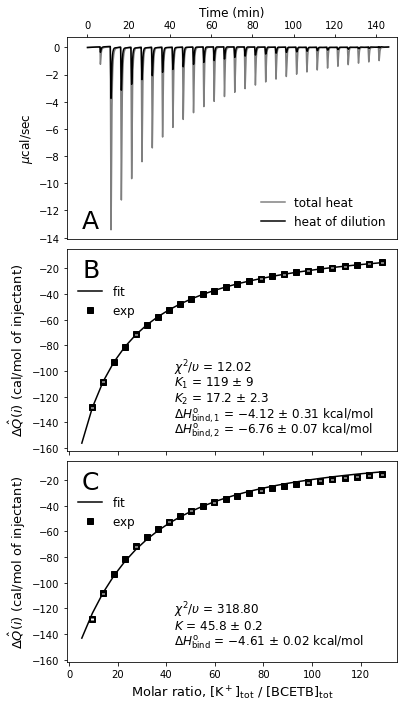

In [18]:
# Plotting heat peaks (A) and fitted curve (B) for BCETB using the sequential binding sites model
print("Figure 2")
fig = plt.figure(figsize=(12,11.5))

salts = ['KCl']
plotData = ['heatPeaks', 'sequentialBinding', 'independentBinding']
numReplicas = 3

for index, salt in enumerate(salts):
    data = loadData(salt, numReplicas)
    injv = data[0]
    xt = data[1]
    mt = data[2]
    xmt = data[3]
    ndh_new = data[4][:,0]
    ndh_avg = data[5]
    ndh_var = data[6]
    for jindex, model in enumerate(plotData):
        if jindex == 0: #First plot heat peaks:
            ax = fig.add_subplot(3,2,index+jindex*2+1)
            time, heat_peaks_norm = loadHeatPeaks(salt+"_RAW", 1, 3)
            time_dil, heat_peaks_norm_dil = loadHeatPeaks(salt+"_Dilution_RAW", 1, 3)
            ax.plot(time/60, heat_peaks_norm, alpha=0.5, color='black', label='total heat')
            ax.plot(time_dil/60, heat_peaks_norm_dil, color='black', label='heat of dilution')
            label_xpos = -2.7
            label_ypos = -13.3
            label = "A"
            ax.annotate(label, (label_xpos, label_ypos), fontsize=25)
            ax.xaxis.set_label_position("top")
            ax.xaxis.tick_top()
            ax.set_xlabel('Time (min)', fontsize=12)
            ax.set_ylabel('$\mu$cal/sec', fontsize=12)
            ax.set_xlim(-10, 150)
            ax.legend(frameon=False, fontsize=12)
        else:
            ax = fig.add_subplot(3,2,index+jindex*2+1)
            
            if model is 'sequentialBinding':
                paramGuess_seq = np.array([0.111, -4.384, 0.0136, -9.001]) # Parameter guesses [K1, dH1, K2, dH2] in units (L/mmol and kcal/mol) for the sequential binding model 
                opt_params = least_squares(residualsSequentialBindingAvg, paramGuess_seq, method='lm') # Finding the optimal parameter set using the Levenberg Marquardt algorithm and the sequential binding model
                dQ = optimalFitSequentialBinding(opt_params.x)
                opt_params_sets = np.zeros((numReplicas, len(paramGuess_seq)))
                
                if salt is 'KCl':
                    label_xpos = 5.3
                    label_ypos = -27
                    label = "B"
                    annotate_xpos = 43
                    annotate_ypos = -100
                    annotate_incr = 12
                elif salt is 'KI':
                    label_xpos = 2
                    label_ypos = -45
                    label = "A"
                    annotate_xpos = 30
                    annotate_ypos = -120
                    annotate_incr = 12
                elif salt is 'KSCN' or 'K2SO4':
                    label_xpos = 1
                    label_ypos = -52
                    label = "a"
                    annotate_xpos = 25
                    annotate_ypos = -128
                    annotate_incr = 13
                var1 = np.zeros((3,4))
                for i in range(numReplicas):
                    ndh = data[4][:,i]
                    least_square = least_squares(residualsSequentialBinding, paramGuess_seq, method='lm') # Finding the optimal parameter set using the Levenberg Marquardt algorithm and the sequential binding model
                    #print(least_square.x)
                    opt_params_sets[i,:] = least_square.x
                    var1[i,:] = opt_params_sets[i,:]
                var_avg = np.mean(var1, axis = 0)
                ax.annotate(label, (label_xpos, label_ypos), fontsize=25)
                ax.annotate("$\chi^2 / \\upsilon$ = {0:.2f}".format(np.round(np.sum(residualsSequentialBindingAvg(opt_params.x)**2/ndh_var)/(len(ndh_avg)-len(paramGuess_seq)),2)), (annotate_xpos, annotate_ypos), fontsize=12)
                K1 = ufloat(opt_params.x[0]*1000, np.std(opt_params_sets[:,0]*1000))
                K2 = ufloat(opt_params.x[2]*1000, np.std(opt_params_sets[:,2]*1000))
                dH1 = ufloat(opt_params.x[1], np.std(opt_params_sets[:,1]))
                dH2 = ufloat(opt_params.x[3], np.std(opt_params_sets[:,3]))
                
                ax.annotate("$K_1$ = {0:.0f}".format(np.round(opt_params.x[0]*1000, 1))+" $\pm$ {0:.0f}".format(np.round(np.std(opt_params_sets[:,0]*1000), 0)), (annotate_xpos, annotate_ypos-annotate_incr*1), fontsize=12)
                ax.annotate("$K_2$ = {0:.1f}".format(np.round(opt_params.x[2]*1000, 1))+" $\pm$ {0:.1f}".format(np.round(np.std(opt_params_sets[:,2]*1000), 1)), (annotate_xpos, annotate_ypos-annotate_incr*2), fontsize=12)
                ax.annotate("$\Delta H^{\mathrm{o}}_{\mathrm{bind},1}$ = $-$"+str((-np.round(opt_params.x[1], 2)))+" $\pm$ {0:.2f}".format(np.round(np.std(opt_params_sets[:,1]), 2))+" kcal/mol", (annotate_xpos, annotate_ypos-annotate_incr*3), fontsize=12)
                ax.annotate("$\Delta H^{\mathrm{o}}_{\mathrm{bind},2}$ = $-$"+str((-np.round(opt_params.x[3], 2)))+" $\pm$ {0:.2f}".format(np.round(np.std(opt_params_sets[:,3]), 2))+" kcal/mol", (annotate_xpos, annotate_ypos-annotate_incr*4), fontsize=12)
                plt.setp(ax.get_xticklabels(), visible=False)
                

            else:
                paramGuess_ind = np.array([0.111, -4.384]) # Parameter guesses [K, dH] in units (L/mmol and kcal/mol) for the independent binding model 
                opt_params = least_squares(residualsIndependentBinding, paramGuess_ind, method='lm') # Finding the optimal parameter set using the Levenberg Marquardt algorithm and the independent binding model
                dQ = optimalFitIndependentBinding(opt_params.x)
                opt_params_sets = np.zeros((numReplicas, len(paramGuess_ind)))
                if salt is 'KCl':
                    label_xpos = 5.3
                    label_ypos = -27
                    label = "C"
                    annotate_xpos = 43
                    annotate_ypos = -124
                    annotate_incr = 12
                elif salt is 'KI':
                    label_xpos = 2
                    label_ypos = -45
                    label = "B"
                    annotate_xpos = 30
                    annotate_ypos = -135
                    annotate_incr = 11
                elif salt is 'KSCN' or 'K2SO4':
                    label_xpos = 1
                    label_ypos = -45
                    label = "B"
                    annotate_xpos = 25
                    annotate_ypos = -138
                    annotate_incr = 12
                for i in range(numReplicas):
                    ndh = data[4][:,i]
                    least_square = least_squares(residualsIndependentBinding, paramGuess_ind, method='lm') # Finding the optimal parameter set using the Levenberg Marquardt algorithm and the sequential binding model
                    #print(least_square.x)
                    opt_params_sets[i,:] = least_square.x
                ax.annotate(label, (label_xpos, label_ypos), fontsize=25)
                ax.annotate("$\chi^2/\\upsilon$ = {0:.2f}".format(np.round(np.sum(residualsIndependentBindingAvg(opt_params.x)**2/ndh_var)/(len(ndh_avg)-len(paramGuess_ind)),1)), (annotate_xpos, annotate_ypos), fontsize=12)
                ax.annotate("$K$ = {0:.1f}".format(np.round(opt_params.x[0]*1000, 1))+" $\pm$ {0:.1f}".format(np.round(np.std(opt_params_sets[:,0]*1000), 1)), (annotate_xpos, annotate_ypos-12), fontsize=12)
                ax.annotate("$\Delta H^{\mathrm{o}}_{\mathrm{bind}}$ = $-$"+str((-np.round(opt_params.x[1], 2)))+" $\pm$ {0:.2f}".format(np.round(np.std(opt_params_sets[:,1]), 2))+" kcal/mol", (annotate_xpos, annotate_ypos-24), fontsize=12)
                
            if salt == 'KCl':
                ax.plot(xmt[1:-1], dQ[1:-1], color='black', label='$\mathrm{fit}$')
                ax.plot(xmt[2:-1], ndh_avg, marker='s', color='black', ls='', label='$\mathrm{exp}$')
                ax.errorbar(xmt[2:-1], ndh_avg, yerr=np.sqrt(ndh_var), ls='', color='white',zorder=10, lw=3)
                ax.legend(frameon=False, loc=(0.02, 0.63), fontsize=12)
                ax.set_ylim(-162, -5)
            elif salt == 'KI':
                ax.plot(xmt[:], dQ[:], color='black', label='$\mathrm{fit}$')
                ax.plot(xmt[2:], ndh_avg, marker='s', color='black', ls='', label='$\mathrm{exp}$')
                ax.errorbar(xmt[2:], ndh_avg, yerr=np.sqrt(ndh_var), ls='', color='white',zorder=10, lw=3)
                ax.legend(frameon=False, loc=(0.02, 0.6), fontsize=12)
            elif salt == 'KSCN' or 'K2SO4':
                ax.plot(xmt[:], dQ[:], color='black', label='$\mathrm{fit}$')
                ax.plot(xmt[2:], ndh_avg, marker='s', color='black', ls='', label='$\mathrm{exp}$')
                ax.errorbar(xmt[2:], ndh_avg, yerr=np.sqrt(ndh_var), ls='', color='white',zorder=10, lw=3)
                ax.yaxis.set_label_position("right")
                ax.yaxis.tick_right()
                ax.legend(frameon=False, loc=(0.03, 0.54), fontsize=12)
            elif salt == 'K11':
                plt.plot(xmt[:], dQ[:])
            if model is not 'sequentialBinding':
                ax.set_xlabel("Molar ratio, $[\mathrm{K^+}]_{\mathrm{tot}}$ / $[\mathrm{BCETB}]_{\mathrm{tot}}$", fontsize=13)
            ax.set_ylabel("$\Delta \hat{Q}(i)$ (cal/mol of injectant)", fontsize=13)
        
plt.subplots_adjust(hspace=0.05, wspace=0.03)
#plt.savefig('figs/fits_itc_KCl.pdf')

Figure S1


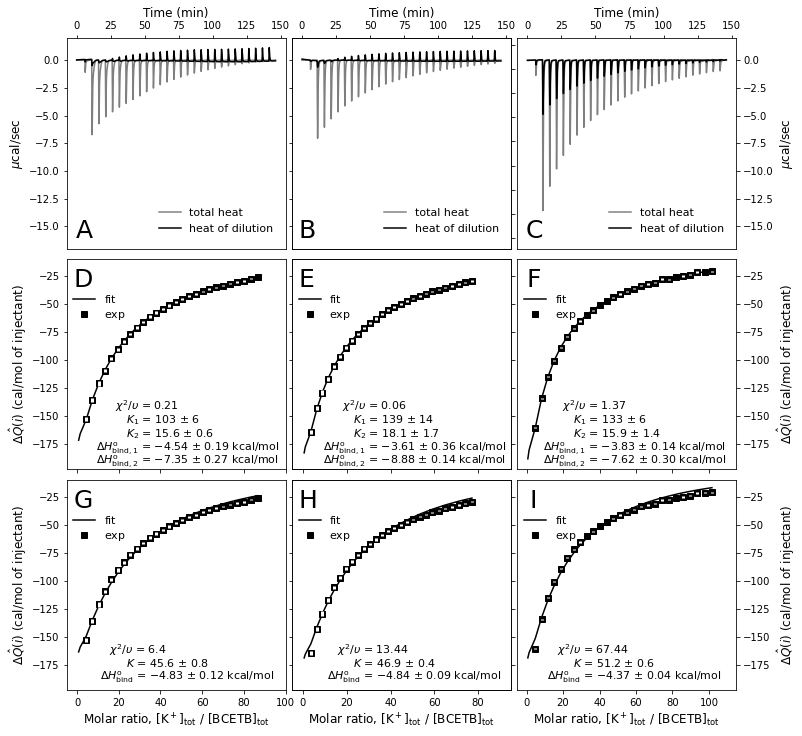

In [19]:
# Plotting heat peaks (A, B and C) and fitted curves for BCETB using the  
# sequential binding sites model (D, E, and F) and the
# independent binding sites model (G, H and I) 
# for three salts: KI, KSCN, and K2SO4 (first, second, and third column of plots, respectively)

print("Figure S1")
fig = plt.figure(figsize=(12,12))

salts = ['KI', 'KSCN', 'K2SO4']
plotData = ['heatPeaks', 'sequentialBinding', 'independentBinding']
numReplicas = 3

for index, salt in enumerate(salts):
    data = loadData(salt, numReplicas)
    injv = data[0]
    xt = data[1]
    mt = data[2]
    xmt = data[3]
    ndh_avg = data[5]
    ndh_var = data[6]
    for jindex, model in enumerate(plotData):
        if jindex == 0: #First plot heat peaks:
            
            ax = fig.add_subplot(3,3,index+jindex*3+1)
            time, heat_peaks_norm = loadHeatPeaks(salt+"_RAW", 1, 3)
            time_dil, heat_peaks_norm_dil = loadHeatPeaks(salt+"_Dilution_RAW", 1, 3)
            ax.plot(time/60, heat_peaks_norm, alpha=0.5, color='black', label='total heat')
            ax.plot(time_dil/60, heat_peaks_norm_dil, color='black', label='heat of dilution')
            label_ypos = -16
            if salt is 'KI':
                label = "A"
                label_xpos = -0.7
            elif salt is 'KSCN':
                label='B'
                label_xpos = -2.5
                twin_ax = ax.twinx()
                twin_ax.set_ylim(ax.get_ylim())
                plt.setp(ax.get_yticklabels(), visible=False)
            elif salt is 'K2SO4':
                label='C'
                label_xpos = -1
                


            ax.annotate(label, (label_xpos, label_ypos), fontsize=25)
            ax.xaxis.set_label_position("top")
            ax.xaxis.tick_top()
            if index == len(salts)-1:
                ax.yaxis.set_label_position("right")
                ax.yaxis.tick_right()
            ax.set_ylim(-17, 2)
            ax.set_xlabel('Time (min)', fontsize=12)
            if salt is not 'KSCN':
                ax.set_ylabel('$\mu$cal/sec', fontsize=12)
            ax.legend(frameon=False, loc=(0.4, 0.05), fontsize=11)
        else:
            ax = fig.add_subplot(3,3,index+jindex*3+1)
            
            if model is 'sequentialBinding':
                paramGuess_seq = np.array([0.111, -4.384, 0.0136, -9.001]) # Parameter guesses [K1, dH1, K2, dH2] in units (L/mmol and kcal/mol) for the sequential binding model 
                opt_params = least_squares(residualsSequentialBindingAvg, paramGuess_seq, method='lm') # Finding the optimal parameter set using the Levenberg Marquardt algorithm and the sequential binding model
                dQ = optimalFitSequentialBinding(opt_params.x)
                opt_params_sets = np.zeros((numReplicas, len(paramGuess_seq)))

                label_ypos = -35
                annotate_xpos = 9
                annotate_ypos = -145
                annotate_incr = 12
                if salt is 'KI':
                    chi_pad = 9.2
                    K_pad = 14.5
                    label = "D"
                    label_xpos = -1.9
                elif salt is 'KSCN':
                    chi_pad = 8.8
                    K_pad = 13.8
                    label = "E"
                    label_xpos = -1.9
                elif salt is 'K2SO4':
                    chi_pad = 10.5
                    K_pad = 16.3
                    label = "F"
                    label_xpos = 0
                for i in range(numReplicas):
                    ndh = data[4][:,i]
                    least_square = least_squares(residualsSequentialBinding, paramGuess_seq, method='lm') # Finding the optimal parameter set using the Levenberg Marquardt algorithm and the sequential binding model
                    opt_params_sets[i,:] = least_square.x
                ax.annotate(label, (label_xpos, label_ypos), fontsize=25)
                ax.annotate("$\chi^2 / \\upsilon$ = "+str(np.round(np.sum(residualsSequentialBindingAvg(opt_params.x)**2/ndh_var)/(len(ndh_avg)-len(paramGuess_seq)),2)), (annotate_xpos+chi_pad, annotate_ypos), fontsize=11)
                ax.annotate("$K_1$ = {0:.0f}".format(np.round(opt_params.x[0]*1000, 1))+" $\pm$ {0:.0f}".format(np.round(np.std(opt_params_sets[:,0]*1000), 0)), (annotate_xpos+K_pad, annotate_ypos-annotate_incr*1), fontsize=11)
                ax.annotate("$K_2$ = {0:.1f}".format(np.round(opt_params.x[2]*1000, 1))+" $\pm$ {0:.1f}".format(np.round(np.std(opt_params_sets[:,2]*1000), 1)), (annotate_xpos+K_pad, annotate_ypos-annotate_incr*2), fontsize=11)
                ax.annotate("$\Delta H^{\mathrm{o}}_{\mathrm{bind},1}$ = $-$"+str((-np.round(opt_params.x[1], 2)))+" $\pm$ {0:.2f}".format(np.round(np.std(opt_params_sets[:,1]), 2))+" kcal/mol", (annotate_xpos, annotate_ypos-annotate_incr*3), fontsize=11)
                ax.annotate("$\Delta H^{\mathrm{o}}_{\mathrm{bind},2}$ = $-$"+str((-np.round(opt_params.x[3], 2)))+" $\pm$ {0:.2f}".format(np.round(np.std(opt_params_sets[:,3]), 2))+" kcal/mol", (annotate_xpos, annotate_ypos-annotate_incr*4), fontsize=11)
                plt.setp(ax.get_xticklabels(), visible=False)
                #print(salts[index])
                #print("----------------")
                K1 = ufloat(opt_params.x[0]*1000, np.std(opt_params_sets[:,0]*1000))
                K2 = ufloat(opt_params.x[2]*1000, np.std(opt_params_sets[:,2]*1000))
                ratio = K2/K1
                #print("K_1 = ", K1)
                #print("K_2 = ", K2)
                #print("----------------")

            else:
                paramGuess_ind = np.array([0.111, -4.384]) # Parameter guesses [K, dH] in units (L/mmol and kcal/mol) for the independent binding model 
                opt_params = least_squares(residualsIndependentBinding, paramGuess_ind, method='lm') # Finding the optimal parameter set using the Levenberg Marquardt algorithm and the independent binding model
                dQ = optimalFitIndependentBinding(opt_params.x)
                opt_params_sets = np.zeros((numReplicas, len(paramGuess_ind)))
                label_ypos = -35
                annotate_xpos = 11
                annotate_ypos = -165
                annotate_incr = 11
                if salt is 'KI':
                    chi_pad = 4.5
                    K_pad = 12.4
                    label = "G"
                    label_xpos = -1.9
                elif salt is 'KSCN':
                    chi_pad = 4.3
                    K_pad = 11.8
                    label = "H"
                    label_xpos = -1.9
                elif salt is 'K2SO4':
                    chi_pad = 5.6
                    K_pad = 14.5
                    label = "I"
                    label_xpos = 1.5
            
                for i in range(numReplicas):
                    ndh = data[4][:,i]
                    least_square = least_squares(residualsIndependentBinding, paramGuess_ind, method='lm') # Finding the optimal parameter set using the Levenberg Marquardt algorithm and the sequential binding model
                    #print(least_square.x)
                    opt_params_sets[i,:] = least_square.x
                ax.annotate(label, (label_xpos, label_ypos), fontsize=25)
                ax.annotate("$\chi^2/\\upsilon$ = "+str(np.round(np.sum(residualsIndependentBindingAvg(opt_params.x)**2/ndh_var)/(len(ndh_avg)-len(paramGuess_ind)),2)), (annotate_xpos+chi_pad, annotate_ypos), fontsize=11)
                ax.annotate("$K$ = {0:.1f}".format(np.round(opt_params.x[0]*1000, 1))+" $\pm$ {0:.1f}".format(np.round(np.std(opt_params_sets[:,0]*1000), 1)), (annotate_xpos+K_pad, annotate_ypos-12), fontsize=11)
                ax.annotate("$\Delta H^{\mathrm{o}}_{\mathrm{bind}}$ = $-$"+str((-np.round(opt_params.x[1], 2)))+" $\pm$ {0:.2f}".format(np.round(np.std(opt_params_sets[:,1]), 2))+" kcal/mol", (annotate_xpos, annotate_ypos-24), fontsize=11)
            
            if salt == 'KI':
                ax.plot(xmt[:], dQ[:], color='black', label='$\mathrm{fit}$')
                ax.plot(xmt[2:], ndh_avg, marker='s', color='black', ls='', label='$\mathrm{exp}$')
                ax.errorbar(xmt[2:], ndh_avg, yerr=np.sqrt(ndh_var), ls='', color='white',zorder=10, lw=3)
                ax.set_xlim(-5, 100)
                ax.set_ylim(-198, -10)
                ax.yaxis.set_label_position("left")
                ax.yaxis.tick_left()
                ax.legend(frameon=False, loc=(0.01, 0.68), fontsize=11)
            elif salt == 'KSCN':
                ax.plot(xmt[:], dQ[:], color='black', label='$\mathrm{fit}$')
                ax.plot(xmt[2:], ndh_avg, marker='s', color='black', ls='', label='$\mathrm{exp}$')
                ax.errorbar(xmt[2:], ndh_avg, yerr=np.sqrt(ndh_var), ls='', color='white',zorder=10, lw=3)
                ax.set_xlim(-5, 95)
                ax.set_ylim(-198, -10)
                twin_ax = ax.twinx()
                twin_ax.set_ylim(ax.get_ylim())
                plt.setp(ax.get_yticklabels(), visible=False)
                ax.legend(frameon=False, loc=(0.01, 0.68), fontsize=11)
            elif salt == 'K2SO4':
                ax.plot(xmt[:], dQ[:], color='black', label='$\mathrm{fit}$')
                ax.plot(xmt[2:], ndh_avg, marker='s', color='black', ls='', label='$\mathrm{exp}$')
                ax.errorbar(xmt[2:], ndh_avg, yerr=np.sqrt(ndh_var), ls='', color='white',zorder=10, lw=3)
                ax.yaxis.set_label_position("right")
                ax.set_xlim(-5, 115)
                ax.set_ylim(-198, -10)
                ax.yaxis.tick_right()
                ax.legend(frameon=False, loc=(0.01, 0.68), fontsize=11)
            elif salt == 'K11':
                plt.plot(xmt[:], dQ[:])
            if model is not 'sequentialBinding':
                ax.set_xlabel("Molar ratio, $[\mathrm{K^+}]_{\mathrm{tot}}$ / $[\mathrm{BCETB}]_{\mathrm{tot}}$", fontsize=12)
            if salt is not 'KSCN':
                ax.set_ylabel("$\Delta \hat{Q}(i)$ (cal/mol of injectant)", fontsize=12)
plt.subplots_adjust(hspace=0.05, wspace=0.03)
plt.savefig('figs/itc_fits_all.pdf')

In [20]:
data = loadData_CE('KCl')
injv = data[0]
xt = data[1]
mt = data[2]
xmt = data[3]
ndh = data[4]

iters = 5000 # (5000) Number of iterations for bootstrapping

paramGuess_indep = np.array([0.107, -5.77]) # Parameter guesses [K, dH] in units (L/mmol and kcal/mol) for the single set of independent binding sites model 

res_indep = least_squares(residualsIndependentBinding_CE, paramGuess_indep, method='lm') # Finding the optimal parameter set using the Levenberg Marquardt algorithm and the single set of independent binding sites model

parErrors_indep = errorOfPars_CE(x0=paramGuess_indep, iterations=iters, params=np.zeros((iters, len(paramGuess_indep))), res=res_indep, model=residualsIndependentBinding_CE, ndh_array=ndh)

Figure S2


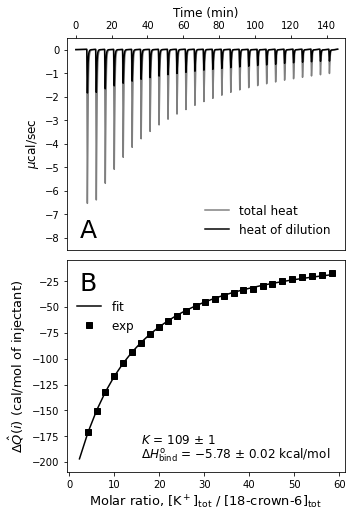

In [21]:
# Plotting heat peaks (A) and fitted curve (B) for 18-crown-6 using the independent binding sites model
print("Figure S2")
fig, (ax1, ax2) = plt.subplots(2,1,figsize=(5,7.3))
data = loadData_CE('KCl')
injv = data[0]
xt = data[1]
mt = data[2]
xmt = data[3]
ndh = data[4]
ndh_avg = data[4]
time, heat_peaks_norm = loadHeatPeaks_CE("KCl_RAW", 3)
time_dil, heat_peaks_norm_dil = loadHeatPeaks_CE("KCl_Dilution_RAW", 3)
label_xpos = 2
label_ypos = -8
label = "A"
ax1.annotate(label, (label_xpos, label_ypos), fontsize=25)
ax1.xaxis.set_label_position("top")
ax1.xaxis.tick_top()
ax1.plot(time/60, heat_peaks_norm, alpha=0.5, color='black', label='total heat')
ax1.plot(time_dil/60, heat_peaks_norm_dil, color='black', label='heat of dilution')
ax1.set_xlim(-5, 150)
ax1.set_ylim(-8.5, 0.5)
ax1.set_xlabel('Time (min)', fontsize=12)
ax1.set_ylabel('$\mu$cal/sec', fontsize=12)
ax1.legend(frameon=False, loc=(0.48, 0.04), fontsize=12)

paramGuess_ind = np.array([0.001, -4.384]) # Parameter guesses [K, dH] in units (L/mmol and kcal/mol) for the independent binding model 
opt_params = least_squares(residualsIndependentBinding_CE, paramGuess_ind, method='lm') # Finding the optimal parameter set using the Levenberg Marquardt algorithm and the independent binding model
dQ = optimalFitIndependentBinding_CE(opt_params.x)
#print(len(dQ), len(ndh_avg), len(xmt))
#print(ndh_avg)
ax2.plot(xmt[1:], dQ[1:], color='black', label='$\mathrm{fit}$')
ax2.plot(xmt[2:], ndh_avg, marker='s', color='black', ls='', label='$\mathrm{exp}$')
#ax2.errorbar(xmt[1:], ndh_avg, yerr=np.sqrt(ndh_var), ls='', color='white',zorder=10, lw=3)
ax2.legend(frameon=False, loc=(0.02, 0.63), fontsize=12)
ax2.set_ylim(-162, -5)
label_xpos = 2.3
label_ypos = -34
label = "B"
ax2.annotate(label, (label_xpos, label_ypos), fontsize=25)
ax2.set_ylim(-210, -5)
annotate_xpos = 16
annotate_ypos = -170
ax2.annotate("$K$ = {0:.0f}".format(np.round(opt_params.x[0]*1000, 0))+" $\pm$ {0:.0f}".format(np.round(parErrors_indep[1][0]*1000, 0)), (annotate_xpos, annotate_ypos-12), fontsize=12)
ax2.annotate("$\Delta H^{\mathrm{o}}_{\mathrm{bind}}$ = $-$"+str((-np.round(opt_params.x[1], 2)))+" $\pm$ {0:.2f}".format(np.round(parErrors_indep[1][1], 2))+" kcal/mol", (annotate_xpos, annotate_ypos-26), fontsize=12)
#print(opt_params.x)
ax2.set_xlabel("Molar ratio, $[\mathrm{K^+}]_{\mathrm{tot}}$ / [18-crown-6]$_{\mathrm{tot}}$", fontsize=13)
ax2.set_ylabel("$\Delta \hat{Q}(i)$ (cal/mol of injectant)", fontsize=13)
plt.subplots_adjust(hspace=0.05)
plt.tight_layout()
plt.savefig('figs/fit_itc_18-crown-6.pdf', bbox_to_inches='tight')

## 2. Replica exchange molecular dynamics (REMD) simulations 
Here we present the analysis done on the output from the REMD simulations. First, we present the free energies (obtained from Bennett acceptance ratio) and enthalpies (obtained from the linearized van't Hoff equation) of binding. Second, we analyse the conformational ensemble of BCETB using principal component analysis. Using the probabilites of the conformations from the PCA analysis, we analyse how the internal potential energies of the different conformations contribute to $\Delta \Delta H^{\mathrm{o}}_{\mathrm{bind}}$. To estimate the impact of the solvent, we calculate the alignment of dipoles of water clusters solvating the binding sites. 
### a) Free energies and enthalpies of binding 
First, we calculate standard state corrected free energies from simulation. By applying the linearized van't Hoff equation on the free energy estimates for several temperatures, we obtain the standard enthalpies of binding, assuming constant heat capacity over the studied temperature range (298.15 K - 218.15 K). 

In [22]:
def restrainCorr(k1, k2, T):
    '''Function returning free energy corrections due to the restraining of the 
    potassium ions in the two binding sites using the harmonic force constants 
    k1 and k2, and a temperature T
    
    Parameters
    ---------
    k1 : force constant for the first binding site (kJ/mol/nm^2)
    k2 : force constant for the second binding site (kJ/mol/nm^2)
    T : temperature (K)
    
    Returns
    -------
    corr : correction factor which should be added to the free energy
    of binding to make it a standard free energy
    '''
    R = 8.314 # ideal gas constant (J/mol)
    V0 = 1.66054 # standard volume (volume per particle at concentration 1M)
    if k2 == 0: 
        string = "1st"
        V_I = (2*pi*R*T/(k1*1000))**(3/2) # nm^3
    else:
        string = "2nd"
        V_I = (2*pi*R*T/(k2*1000))**(3/2) # nm^3

    corr = np.log(V0/V_I) # correction factor (units of RT) 
    return corr

In [23]:
def multipleSitesCorr(i):
    '''Function returning correction due to multiple binding sites of BCETB
    Parameters
    ---------
    i : number in the series of binding events (i=1 means first binding etc)

    Returns
    -------
    corr : correction factor accounting for the degree of degeneracy for
    the bound states, which should be added to the free energy of binding 
    to make it a standard free energy: 
    1. no K+ bound: degree of degeneracy = 1
    2. 1 K+ bound: degree of degeneracy = 2 (not accounted for in simulations)
    3. 2 K+ bound: degree of degeneracy = 1
    '''
    n = 2 # number of binding sites in BCETB
    s = (n-i+1)/i # statistical factor accounting for degeneracy
    corr = np.log(s) # correction factor (units of RT)

    return corr

In [24]:
def vantHoff(T, dG, dG_std, corr1, corr2, label):
    '''Function performing linear regression on the free energies obtained
    from simulation. ln(K)=-dG/RT is plotted against 1/T, and the enthalpy
    is obtained as: dH/RT = -slope/T.
    
    Parameters
    ---------
    T : array containing temperatures for which the free energies are computed
    dG : array containing binding free energies computed
    dG_std : standard deviations for the binding free energies computed
    corr1 : array containing correction factors for restraining the 
    potassium ions (one per temperature)
    corr2 : correction factor accounting for multiple binding
    label : label describing the bound state, e.g. BCETB, K-BCETB, or K-BCETB-K  
    
    Returns
    -------
    dH : binding enthalpy obtained as -slope/R (units of RT)
    slope : slope obtained from linear regression 
    intercept : intercept obtained from linear regression
    x : array containing x-values (one per temperature T, and x = 1/T)
    lnK : array containing y-values (one per temperature T, and y = lnK)
    lnK_std : standard deviation of lnK
    std_err : standard error of the linear regression
    p_value : p-value of the linear regression 
    '''
    x = np.zeros(len(T))
    lnK = np.zeros((len(T)))
    lnK_std = np.zeros((len(T)))
    for j in range(len(T)):
        x[j]=1/T[j]
        lnK[j]=-(dG[j]+corr1[j]-corr2)
        lnK_std[j]= dG_std[j]
    slope, intercept, r_value, p_value, std_err = stats.linregress(x, lnK[:])
    dH = -slope/298.15

    return dH, slope, intercept, x, lnK, lnK_std, std_err, p_value

In [25]:
def bootstrap(path_1, path_2, N_blocks_1, N_blocks_2, Ts, N_resamples, corr1, corr2, label):
    '''Function performing a bootstrap method (resample with replacement) where
    block estimates of the free energies are resampled to generate new mean free
    energies. The standard deviation among the new means is equal to the standard
    error of the free energy. 
    
    Parameters
    ---------
    path_1 : path to where the text files with free energies to be added
    are located (e.g. complexation free energies)
    path_2 : path to where the text files with free energies to be 
    subtracted are located (e.g. solvation free energies)
    N_blocks_1 : number of blocks that the trajectories from the simulations
    computing the free energies to be added are split up into 
    (e.g. number of text files with complexation free energies created)
    N_blocks_2 : number of blocks that the trajectories from the simulations
    computing the free energies to be subtracted are split up into 
    (e.g. number of text files with solvation free energies created)
    Ts : array containing the temperatures for which the free energies 
    are computed
    N_resamples : number of resamples to draw from the randomized sequence 
    of block estimates (used for bootstrapping method to calculate errors)
    corr1 : array containing correction factors for restraining the 
    potassium ions (one per temperature. If no restraining, set to zero)
    corr2 : correction factor accounting for multiple binding (if not 
    applicable, set to zero)
    label : label describing the bound state, e.g. BCETB, K-BCETB, or K-BCETB-K 
    
    Returns
    -------
    x : array containing x-values (one per temperature T, and x = 1/T)
    lnK_mean : array containing y-values (one per temperature T, and y = lnK)
    dG_boot_std_diff_means : array containing standard deviations among the 
    binding free energies obtained through resampling of block estimates
    dH : enthalpies of binding obtained (one per resample, length=N_resamples) 
    slope : slope obtained from the linear regression of the binding 
    free energies (from original data)
    slopes : slopes obtained from the linear regression of the binding 
    free energies (from resampled data)
    slopes_std : standard deviation among slopes obtained from resampled data
    intercept : intercept obtained from the linear regression of the binding 
    free energies (from original data)
    intercepts : intercepts obtained from the linear regression of the binding 
    free energies (from resampled data)
    intercepts_std : standard deviation among intercepts obtained from 
    resampled data    
    '''
    dG_1 = np.zeros((len(Ts), N_blocks_1))
    dG_2 = np.zeros((len(Ts), N_blocks_2))
    dG_1_mean = np.zeros((len(Ts)))
    dG_2_mean = np.zeros((len(Ts)))
    dG_diff_mean = np.zeros((len(Ts)))
    
    dG_boot_1 = np.zeros((len(Ts), N_blocks_1))
    dG_boot_2 = np.zeros((len(Ts), N_blocks_2))
    
    dG_boot_diff_means = np.zeros((len(Ts), N_resamples))
    dG_boot_mean_diff_means = np.zeros((len(Ts)))
    dG_boot_std_diff_means = np.zeros((len(Ts)))
    
    x = np.zeros(len(Ts))
    lnK = np.zeros((len(Ts),N_resamples))
    lnK_mean = np.zeros((len(Ts)))
    dH = np.zeros(N_resamples)
    slopes = np.zeros(N_resamples)
    intercepts = np.zeros(N_resamples)
    
    for Tind, T in enumerate(Ts):
        for block in range(N_blocks_1):
            dG_1[Tind, block] = np.sum(np.loadtxt(path_1+"dG_"+str(block+1)+"_"+str(int(T))+"K.xvg", usecols = 1, skiprows=17))
        if path_2:
            for block in range(N_blocks_2):
                dG_2[Tind, block] = np.sum(np.loadtxt(path_2+"dG_"+str(block+1)+"_"+str(int(T))+"K.xvg", usecols = 1, skiprows=17))
        dG_1_mean[Tind] = np.mean(dG_1[Tind, :])
        dG_2_mean[Tind] = np.mean(dG_2[Tind, :])
        dG_diff_mean[Tind] =  dG_1_mean[Tind]-dG_2_mean[Tind]
        
        for sample in range(N_resamples):
            dG_boot_1[Tind,:] = resample(dG_1[Tind,:], n_samples=N_blocks_1, replace=True)
            dG_boot_2[Tind,:] = resample(dG_2[Tind,:], n_samples=N_blocks_2, replace=True)
            dG_boot_diff_means[Tind,sample] = np.mean(dG_boot_1[Tind,:])-np.mean(dG_boot_2[Tind,:])
        
        dG_boot_std_diff_means[Tind] = np.std(dG_boot_diff_means[Tind,:])
        dG_boot_mean_diff_means[Tind] = np.mean(dG_boot_diff_means[Tind,:])
        x[Tind] = 1/T

    for sample in range(N_resamples):
        vH = vantHoff(Ts, dG_boot_diff_means[:,sample], dG_boot_std_diff_means, corr1, corr2, label)
        dH[sample] = vH[0]
        slopes[sample] = vH[1]
        intercepts[sample] = vH[2]
        lnK[:, sample] = vH[4]
    
    vH = vantHoff(Ts, dG_diff_mean[:], dG_boot_std_diff_means, corr1, corr2, label)
    lnK_mean[:] = vH[4]
    slope = vH[1]
    intercept = vH[2]
    slopes_std = np.std(slopes)
    intercept_std = np.std(intercepts)
    return x, lnK_mean, dG_boot_std_diff_means, dH, slope, slopes, slopes_std, intercept, intercepts, intercept_std            

In [26]:
# Averages and errors of binding and complexation free energies and enthalpies for KCl
# OPLS-AA charges
BS_opl_bind_1_KCl = bootstrap("data/simulation/complexation/KCl/ff_oplsaa/1stBinding/", "data/simulation/solvation/KCl/", 20, 12, np.arange(298.15, 319, 4), 100000, [restrainCorr(3500,3500,298.15), restrainCorr(3500*302.15/298.15,3500*302.15/298.15,302.15), restrainCorr(3500*306.15/298.15,3500*306.15/298.15,306.15), restrainCorr(3500*310.15/298.15,3500*310.15/298.15,310.15), restrainCorr(3500*314.15/298.15,3500*314.15/298.15,314.15), restrainCorr(3500*318.15/298.15,3500*318.15/298.15,318.15)], [multipleSitesCorr(1)], ['K·BCETB'])
BS_opl_bind_2_KCl = bootstrap("data/simulation/complexation/KCl/ff_oplsaa/2ndBinding/", "data/simulation/solvation/KCl/", 20, 12, np.arange(298.15, 319, 4), 100000, [restrainCorr(3500,3500,298.15), restrainCorr(3500*302.15/298.15,3500*302.15/298.15,302.15), restrainCorr(3500*306.15/298.15,3500*306.15/298.15,306.15), restrainCorr(3500*310.15/298.15,3500*310.15/298.15,310.15), restrainCorr(3500*314.15/298.15,3500*314.15/298.15,314.15), restrainCorr(3500*318.15/298.15,3500*318.15/298.15,318.15)], [multipleSitesCorr(2)], ['K·BCETB·K'])
BS_opl_comp_1_KCl = bootstrap("data/simulation/complexation/KCl/ff_oplsaa/1stBinding/", None, 20, 20, np.arange(298.15, 319, 4), 100000, [restrainCorr(3500,3500,298.15), restrainCorr(3500*302.15/298.15,3500*302.15/298.15,302.15), restrainCorr(3500*306.15/298.15,3500*306.15/298.15,306.15), restrainCorr(3500*310.15/298.15,3500*310.15/298.15,310.15), restrainCorr(3500*314.15/298.15,3500*314.15/298.15,314.15), restrainCorr(3500*318.15/298.15,4000*318.15/298.15,318.15)], [multipleSitesCorr(1)], ['K·BCETB'])
BS_opl_comp_2_KCl = bootstrap("data/simulation/complexation/KCl/ff_oplsaa/2ndBinding/", None, 20, 20, np.arange(298.15, 319, 4), 100000, [restrainCorr(3500,3500,298.15), restrainCorr(3500*302.15/298.15,3500*302.15/298.15,302.15), restrainCorr(3500*306.15/298.15,3500*306.15/298.15,306.15), restrainCorr(3500*310.15/298.15,3500*310.15/298.15,310.15), restrainCorr(3500*314.15/298.15,3500*314.15/298.15,314.15), restrainCorr(3500*318.15/298.15,4000*318.15/298.15,318.15)], [multipleSitesCorr(2)], ['K·BCETB·K'])

# DFT charges
BS_dft_bind_1_KCl = bootstrap("data/simulation/complexation/KCl/ff_dft/1stBinding/", "data/simulation/solvation/KCl/", 20, 12, np.arange(298.15, 319, 4), 100000, [restrainCorr(4000,4000,298.15), restrainCorr(4000*302.15/298.15,4000*302.15/298.15,302.15), restrainCorr(4000*306.15/298.15,4000*306.15/298.15,306.15), restrainCorr(4000*310.15/298.15,4000*310.15/298.15,310.15), restrainCorr(4000*314.15/298.15,4000*314.15/298.15,314.15), restrainCorr(4000*318.15/298.15,4000*318.15/298.15,318.15)], [multipleSitesCorr(1)], ['K·BCETB'])
BS_dft_bind_2_KCl = bootstrap("data/simulation/complexation/KCl/ff_dft/2ndBinding/", "data/simulation/solvation/KCl/", 20, 12, np.arange(298.15, 319, 4), 100000, [restrainCorr(4000,4000,298.15), restrainCorr(4000*302.15/298.15,4000*302.15/298.15,302.15), restrainCorr(4000*306.15/298.15,4000*306.15/298.15,306.15), restrainCorr(4000*310.15/298.15,4000*310.15/298.15,310.15), restrainCorr(4000*314.15/298.15,4000*314.15/298.15,314.15), restrainCorr(4000*318.15/298.15,4000*318.15/298.15,318.15)], [multipleSitesCorr(2)], ['K·BCETB·K'])
BS_dft_comp_1_KCl = bootstrap("data/simulation/complexation/KCl/ff_dft/1stBinding/", None, 20, 20, np.arange(298.15, 319, 4), 100000, [restrainCorr(4000,4000,298.15), restrainCorr(4000*302.15/298.15,4000*302.15/298.15,302.15), restrainCorr(4000*306.15/298.15,4000*306.15/298.15,306.15), restrainCorr(4000*310.15/298.15,4000*310.15/298.15,310.15), restrainCorr(4000*314.15/298.15,4000*314.15/298.15,314.15), restrainCorr(4000*318.15/298.15,4000*318.15/298.15,318.15)], [multipleSitesCorr(1)], ['K·BCETB'])
BS_dft_comp_2_KCl = bootstrap("data/simulation/complexation/KCl/ff_dft/2ndBinding/", None, 20, 20, np.arange(298.15, 319, 4), 100000, [restrainCorr(4000,4000,298.15), restrainCorr(4000*302.15/298.15,4000*302.15/298.15,302.15), restrainCorr(4000*306.15/298.15,4000*306.15/298.15,306.15), restrainCorr(4000*310.15/298.15,4000*310.15/298.15,310.15), restrainCorr(4000*314.15/298.15,4000*314.15/298.15,314.15), restrainCorr(4000*318.15/298.15,4000*318.15/298.15,318.15)], [multipleSitesCorr(2)], ['K·BCETB·K'])

# Polarized DFT charges
BS_dft_pol_bind_1_KCl = bootstrap("data/simulation/complexation/KCl/ff_dft_pol/1stBinding/", "data/simulation/solvation/KCl/", 12, 12, np.arange(298.15, 319, 4), 100000, [restrainCorr(1000,1000,298.15), restrainCorr(1000*302.15/298.15,1000*302.15/298.15,302.15), restrainCorr(1000*306.15/298.15,1000*306.15/298.15,306.15), restrainCorr(1000*310.15/298.15,1000*310.15/298.15,310.15), restrainCorr(1000*314.15/298.15,1000*314.15/298.15,314.15), restrainCorr(1000*318.15/298.15,1000*318.15/298.15,318.15)], [multipleSitesCorr(1)], ['K·BCETB'])
BS_dft_pol_bind_2_KCl = bootstrap("data/simulation/complexation/KCl/ff_dft_pol/2ndBinding/", "data/simulation/solvation/KCl/", 12, 12, np.arange(298.15, 319, 4), 100000, [restrainCorr(1000,1000,298.15), restrainCorr(1000*302.15/298.15,1000*302.15/298.15,302.15), restrainCorr(1000*306.15/298.15,1000*306.15/298.15,306.15), restrainCorr(1000*310.15/298.15,1000*310.15/298.15,310.15), restrainCorr(1000*314.15/298.15,1000*314.15/298.15,314.15), restrainCorr(1000*318.15/298.15,1000*318.15/298.15,318.15)], [multipleSitesCorr(2)], ['K·BCETB·K'])
BS_dft_pol_comp_1_KCl = bootstrap("data/simulation/complexation/KCl/ff_dft_pol/1stBinding/", None, 12, 12, np.arange(298.15, 319, 4), 100000, [restrainCorr(1000,1000,298.15), restrainCorr(1000*302.15/298.15,1000*302.15/298.15,302.15), restrainCorr(1000*306.15/298.15,1000*306.15/298.15,306.15), restrainCorr(1000*310.15/298.15,1000*310.15/298.15,310.15), restrainCorr(1000*314.15/298.15,1000*314.15/298.15,314.15), restrainCorr(1000*318.15/298.15,1000*318.15/298.15,318.15)], [multipleSitesCorr(1)], ['K·BCETB'])
BS_dft_pol_comp_2_KCl = bootstrap("data/simulation/complexation/KCl/ff_dft_pol/2ndBinding/", None, 12, 12, np.arange(298.15, 319, 4), 100000, [restrainCorr(1000,1000,298.15), restrainCorr(1000*302.15/298.15,1000*302.15/298.15,302.15), restrainCorr(1000*306.15/298.15,1000*306.15/298.15,306.15), restrainCorr(1000*310.15/298.15,1000*310.15/298.15,310.15), restrainCorr(1000*314.15/298.15,1000*314.15/298.15,314.15), restrainCorr(1000*318.15/298.15,1000*318.15/298.15,318.15)], [multipleSitesCorr(2)], ['K·BCETB·K'])

In [27]:
# Averages and errors of binding and complexation free energies and enthalpies for KI
# DFT charges
BS_dft_bind_1_KI = bootstrap("data/simulation/complexation/KI/ff_dft/1stBinding/", "data/simulation/solvation/KI/", 20, 12, np.arange(298.15, 319, 4), 100000, [restrainCorr(4000,4000,298.15), restrainCorr(4000*302.15/298.15,4000*302.15/298.15,302.15), restrainCorr(4000*306.15/298.15,4000*306.15/298.15,306.15), restrainCorr(4000*310.15/298.15,4000*310.15/298.15,310.15), restrainCorr(4000*314.15/298.15,4000*314.15/298.15,314.15), restrainCorr(4000*318.15/298.15,4000*318.15/298.15,318.15)], [multipleSitesCorr(1)], ['K·BCETB'])
BS_dft_bind_2_KI = bootstrap("data/simulation/complexation/KI/ff_dft/2ndBinding/", "data/simulation/solvation/KI/", 20, 12, np.arange(298.15, 319, 4), 100000, [restrainCorr(4000,4000,298.15), restrainCorr(4000*302.15/298.15,4000*302.15/298.15,302.15), restrainCorr(4000*306.15/298.15,4000*306.15/298.15,306.15), restrainCorr(4000*310.15/298.15,4000*310.15/298.15,310.15), restrainCorr(4000*314.15/298.15,4000*314.15/298.15,314.15), restrainCorr(4000*318.15/298.15,4000*318.15/298.15,318.15)], [multipleSitesCorr(2)], ['K·BCETB·K'])
BS_dft_comp_1_KI = bootstrap("data/simulation/complexation/KI/ff_dft/1stBinding/", None, 20, 20, np.arange(298.15, 319, 4), 100000, [restrainCorr(4000,4000,298.15), restrainCorr(4000*302.15/298.15,4000*302.15/298.15,302.15), restrainCorr(4000*306.15/298.15,4000*306.15/298.15,306.15), restrainCorr(4000*310.15/298.15,4000*310.15/298.15,310.15), restrainCorr(4000*314.15/298.15,4000*314.15/298.15,314.15), restrainCorr(4000*318.15/298.15,4000*318.15/298.15,318.15)], [multipleSitesCorr(1)], ['K·BCETB'])
BS_dft_comp_2_KI = bootstrap("data/simulation/complexation/KI/ff_dft/2ndBinding/", None, 20, 20, np.arange(298.15, 319, 4), 100000, [restrainCorr(4000,4000,298.15), restrainCorr(4000*302.15/298.15,4000*302.15/298.15,302.15), restrainCorr(4000*306.15/298.15,4000*306.15/298.15,306.15), restrainCorr(4000*310.15/298.15,4000*310.15/298.15,310.15), restrainCorr(4000*314.15/298.15,4000*314.15/298.15,314.15), restrainCorr(4000*318.15/298.15,4000*318.15/298.15,318.15)], [multipleSitesCorr(2)], ['K·BCETB·K'])

In [28]:
# Averages and errors of binding and complexation free energies and enthalpies for KSCN
# DFT charges
BS_dft_bind_1_KSCN = bootstrap("data/simulation/complexation/KSCN/ff_dft/1stBinding/", "data/simulation/solvation/KSCN/", 20, 12, np.arange(298.15, 319, 4), 100000, [restrainCorr(4000,4000,298.15), restrainCorr(4000*302.15/298.15,4000*302.15/298.15,302.15), restrainCorr(4000*306.15/298.15,4000*306.15/298.15,306.15), restrainCorr(4000*310.15/298.15,4000*310.15/298.15,310.15), restrainCorr(4000*314.15/298.15,4000*314.15/298.15,314.15), restrainCorr(4000*318.15/298.15,4000*318.15/298.15,318.15)], [multipleSitesCorr(1)], ['K·BCETB'])
BS_dft_bind_2_KSCN = bootstrap("data/simulation/complexation/KSCN/ff_dft/2ndBinding/", "data/simulation/solvation/KSCN/", 20, 12, np.arange(298.15, 319, 4), 100000, [restrainCorr(4000,4000,298.15), restrainCorr(4000*302.15/298.15,4000*302.15/298.15,302.15), restrainCorr(4000*306.15/298.15,4000*306.15/298.15,306.15), restrainCorr(4000*310.15/298.15,4000*310.15/298.15,310.15), restrainCorr(4000*314.15/298.15,4000*314.15/298.15,314.15), restrainCorr(4000*318.15/298.15,4000*318.15/298.15,318.15)], [multipleSitesCorr(2)], ['K·BCETB·K'])
BS_dft_comp_1_KSCN = bootstrap("data/simulation/complexation/KSCN/ff_dft/1stBinding/", None, 20, 20, np.arange(298.15, 319, 4), 100000, [restrainCorr(4000,4000,298.15), restrainCorr(4000*302.15/298.15,4000*302.15/298.15,302.15), restrainCorr(4000*306.15/298.15,4000*306.15/298.15,306.15), restrainCorr(4000*310.15/298.15,4000*310.15/298.15,310.15), restrainCorr(4000*314.15/298.15,4000*314.15/298.15,314.15), restrainCorr(4000*318.15/298.15,4000*318.15/298.15,318.15)], [multipleSitesCorr(1)], ['K·BCETB'])
BS_dft_comp_2_KSCN = bootstrap("data/simulation/complexation/KSCN/ff_dft/2ndBinding/", None, 20, 20, np.arange(298.15, 319, 4), 100000, [restrainCorr(4000,4000,298.15), restrainCorr(4000*302.15/298.15,4000*302.15/298.15,302.15), restrainCorr(4000*306.15/298.15,4000*306.15/298.15,306.15), restrainCorr(4000*310.15/298.15,4000*310.15/298.15,310.15), restrainCorr(4000*314.15/298.15,4000*314.15/298.15,314.15), restrainCorr(4000*318.15/298.15,4000*318.15/298.15,318.15)], [multipleSitesCorr(2)], ['K·BCETB·K'])

In [29]:
print("Table 1, 2, and 3 (only computational results)")
print("")

labels = ("KCl, OPLS-AA charges", "KCl, DFT charges", "KCl, DFT charges (pol.)", "KI, DFT charges", "KSCN, DFT charges")
conv = 1.38064852e-23*298.15*6.0221409e23/1000/4.184
dG1s = (BS_opl_bind_1_KCl, BS_dft_bind_1_KCl, BS_dft_pol_bind_1_KCl,BS_dft_bind_1_KI,BS_dft_bind_1_KSCN)
dG2s = (BS_opl_bind_2_KCl, BS_dft_bind_2_KCl, BS_dft_pol_bind_2_KCl,BS_dft_bind_2_KI,BS_dft_bind_2_KSCN)
dG1_comps = (BS_opl_comp_1_KCl, BS_dft_comp_1_KCl, BS_dft_pol_comp_1_KCl,BS_dft_comp_1_KI,BS_dft_comp_1_KSCN)
dG2_comps = (BS_opl_comp_2_KCl, BS_dft_comp_2_KCl, BS_dft_pol_comp_2_KCl,BS_dft_comp_2_KI,BS_dft_comp_2_KSCN)
        # BS_opl_bind_2_KCl, BS_opl_comp_1_KCl, BS_opl_comp_2_KCl,
        # BS_dft_bind_1_KCl, BS_dft_bind_2_KCl, BS_dft_comp_1_KCl, BS_dft_comp_2_KCl,
        # BS_dft_pol_bind_1_KCl, BS_dft_pol_bind_2_KCl, BS_dft_pol_comp_1_KCl, BS_dft_pol_comp_2_KCl,
        # BS_dft_bind_1_KI, BS_dft_bind_2_KI, BS_dft_comp_1_KI, BS_dft_comp_2_KI,
        # BS_dft_bind_1_KSCN, BS_dft_bind_2_KSCN, BS_dft_comp_1_KSCN, BS_dft_comp_2_KSCN)
dG1 = np.zeros(5)
dG1_std = np.zeros(5)
dG2 = np.zeros(5)
dG2_std = np.zeros(5)
dG1_comp = np.zeros(5)
dG1_comp_std = np.zeros(5)
dG2_comp = np.zeros(5)
dG2_comp_std = np.zeros(5)

dH1 = np.zeros(5)
dH1_std = np.zeros(5)
dH2 = np.zeros(5)
dH2_std = np.zeros(5)
dH1_comp = np.zeros(5)
dH1_comp_std = np.zeros(5)
dH2_comp = np.zeros(5)
dH2_comp_std = np.zeros(5)

for index, dG1_i in enumerate(dG1s):
    #print(index)
    #print(-dG1[1][0]*conv)
    dG1[index] = dG1_i[1][0]
    dG1_std[index] = dG1_i[2][0]
    dG1_full = ufloat(dG1[index], dG1_std[index])
    K1 = exp(dG1_full)
    dG2[index] = dG2s[index][1][0]
    dG2_std[index] = dG2s[index][2][0]
    dG2_full = ufloat(dG2[index], dG2_std[index])
    K2 = exp(dG2_full)
    
    rho = 4*K1*K2/(K1**2)
    

    #ddG_full = ufloat(np.round(dG2_comp_full-dG1_comp_full,1), np.round(dG2_comp_std[index]-dG1_comp_std[index],1))
  
    if index == 0:
        print("salt/force field \t K1 \t\t\t K2 \t\t\t rho")
        print("---------------- \t ----- \t\t\t ----- \t\t\t -----")
    if index == 0 or index == 2:
        if index == 2:
            print(labels[index], "", K1, "\t\t", K2, "\t", rho)
        else:
            print(labels[index], "\t", K1, "\t\t", K2, "\t\t", rho)
    else:
        print(labels[index], "\t", K1, "\t", K2, "\t", rho)
    
for index, dG1_i in enumerate(dG1s):
    #print(index)
    #print(-dG1[1][0]*conv)
    dG1[index] = -dG1_i[1][0]*conv
    dG1_std[index] = dG1_i[2][0]*conv
    dG1_full = ufloat(np.round(dG1[index],1), np.round(dG1_std[index],1))
    dG2[index] = -dG2s[index][1][0]*conv
    dG2_std[index] = dG2s[index][2][0]*conv
    dG2_full = ufloat(np.round(dG2[index],1), np.round(dG2_std[index],1))
    dG1_comp[index] = -dG1_comps[index][1][0]*conv
    dG2_comp[index] = -dG2_comps[index][1][0]*conv
    dG1_comp_std[index] = dG1_comps[index][2][0]*conv
    dG2_comp_std[index] = dG2_comps[index][2][0]*conv
    dG1_comp_full = ufloat(dG1_comp[index], dG1_comp_std[index])
    dG2_comp_full = ufloat(dG2_comp[index], dG2_comp_std[index])
    ddG_full = ufloat(np.round(dG2_comp[index] - dG1_comp[index], 1), np.round(np.sqrt(dG2_comp_std[index]**2+dG1_comp_std[index]**2), 1))
    

    #ddG_full = ufloat(np.round(dG2_comp_full-dG1_comp_full,1), np.round(dG2_comp_std[index]-dG1_comp_std[index],1))
  
    if index == 0:
        print("-------------------------------------------------------------------------------------")
        print("salt/force field \t dG1 (kcal/mol) \t dG2 (kcal/mol) \t ddG (kcal/mol)")
        print("---------------- \t -------------- \t -------------- \t --------------")
    if index == 2:
        print(labels[index], "", dG1_full, "\t\t", dG2_full, "\t\t", ddG_full)
    else:
        print(labels[index], "\t", dG1_full, "\t\t", dG2_full, "\t\t", ddG_full)
    
for index, dG1_i in enumerate(dG1s):
    dH1[index] = -dG1s[index][4]/298.15*conv
    dH1_std[index] = np.std(dG1s[index][3])*conv
    dH1_full = ufloat(np.round(dH1[index],1), np.round(dH1_std[index],1))
    dH2[index] = -dG2s[index][4]/298.15*conv
    dH2_std[index] = np.std(dG2s[index][3])*conv
    dH2_full = ufloat(np.round(dH2[index],1), np.round(dH2_std[index],1))
    dH1_comp[index] = -dG1_comps[index][4]/298.15*conv
    dH2_comp[index] = -dG2_comps[index][4]/298.15*conv
    dH1_comp_std[index] = np.std(dG1_comps[index][3])*conv
    dH2_comp_std[index] = np.std(dG2_comps[index][3])*conv
    dH1_comp_full = ufloat(dH1_comp[index], dH1_comp_std[index])
    dH2_comp_full = ufloat(dH2_comp[index], dH2_comp_std[index])
    ddH_full = dH2_comp_full - dH1_comp_full
    
    if index == 0:
        print("-------------------------------------------------------------------------------------")
        print("salt/force field \t dH1 (kcal/mol) \t dH2 (kcal/mol) \t ddH (kcal/mol)")
        print("---------------- \t -------------- \t -------------- \t --------------")
    if index == 2:
        print(labels[index], "", dH1_full, "\t\t", dH2_full, "\t\t", ddH_full)
    else:
        print(labels[index], "\t", dH1_full, "\t\t", dH2_full, "\t\t", ddH_full)
    

Table 1, 2, and 3 (only computational results)

salt/force field 	 K1 			 K2 			 rho
---------------- 	 ----- 			 ----- 			 -----
KCl, OPLS-AA charges 	 42+/-10 		 6.5+/-1.6 		 0.63+/-0.22
KCl, DFT charges 	 (7.0+/-1.7)e+03 	 (7.0+/-1.7)e+02 	 0.40+/-0.14
KCl, DFT charges (pol.)  0.020+/-0.006 		 (8.7+/-2.3)e-51 	 (1.8+/-0.7)e-48
KI, DFT charges 	 (2.1+/-0.4)e+03 	 (3.9+/-0.7)e+02 	 0.74+/-0.20
KSCN, DFT charges 	 (1.90+/-0.34)e+03 	 (5.4+/-0.9)e+02 	 1.14+/-0.28
-------------------------------------------------------------------------------------
salt/force field 	 dG1 (kcal/mol) 	 dG2 (kcal/mol) 	 ddG (kcal/mol)
---------------- 	 -------------- 	 -------------- 	 --------------
KCl, OPLS-AA charges 	 -2.20+/-0.10 		 -1.10+/-0.10 		 1.10+/-0.10
KCl, DFT charges 	 -5.20+/-0.10 		 -3.90+/-0.10 		 1.40+/-0.10
KCl, DFT charges (pol.)  2.30+/-0.20 		 68.30+/-0.20 		 66.00+/-0.20
KI, DFT charges 	 -4.50+/-0.10 		 -3.50+/-0.10 		 1.00+/-0.10
KSCN, DFT charges 	 -4.50+/-0.10 		 -3.70+/-0.10 

Figure 3


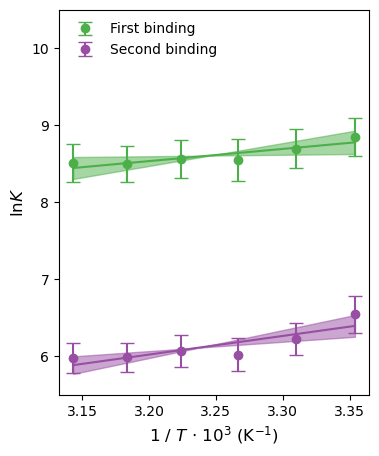

In [30]:
# Binding free energies (from data points) and enthalpties (from slopes) for KCl using DFT charges
print("Figure 3")
plt.style.use('default')
fig, ax = plt.subplots(figsize=(4,5))
dataSets = (BS_dft_bind_1_KCl, BS_dft_bind_2_KCl)
conv = 1.38064852e-23*298.15*6.0221409e23/1000/4.184
colorArray = [colors[2], colors[3]]
labels = ['First binding', 'Second binding']

for i in range(len(dataSets)):

    x = dataSets[i][0]
    lnK = dataSets[i][1]
    lnK_std = dataSets[i][2]
    dH = np.mean(dataSets[i][3])
    dH_std = np.std(dataSets[i][3])
    slope = dataSets[i][4]
    slope_std = dataSets[i][6]
    intercept = np.mean(dataSets[i][7])
    intercept_std = dataSets[i][9]
    ax.errorbar(x*1e3, lnK, lnK_std, fmt='o', color=colorArray[i], capsize=5, label=labels[i])
    ax.plot(x*1e3,x*slope+intercept, color=colorArray[i])
    ax.fill_between(x*1e3,x*(slope+slope_std)+(intercept-intercept_std), x*(slope-slope_std)+(intercept+intercept_std), color=colorArray[i], alpha = 0.5)
    ax.set_ylim(5.5, 10.5)
    ax.legend(loc='upper left', frameon=False)
    ax.set_xlabel('1 / $T$ $\cdot$ 10$^3$ (K$^{-1}$)', fontsize=12)
    ax.set_ylabel('$\ln{K}$', fontsize=12)
    plt.savefig("figs/vantHoff_bootstrap_DFT.pdf", bbox_inches='tight')
    #if i == 0:
    #    print("---------------------------------")
    #    print('DFT charges')
    #print("dG_bind_"+str(i+1)+" =", np.round(-lnK[0]*conv,1), "+/-", np.round(lnK_std[0]*conv,1), "kcal/mol")
    #print("dH_bind_"+str(i+1)+" =", np.round(dH*conv,1), "+/-", np.round(dH_std*conv,1), "kcal/mol")
    #if i == 1:
    #    print("---------------------------------")

Figure S8


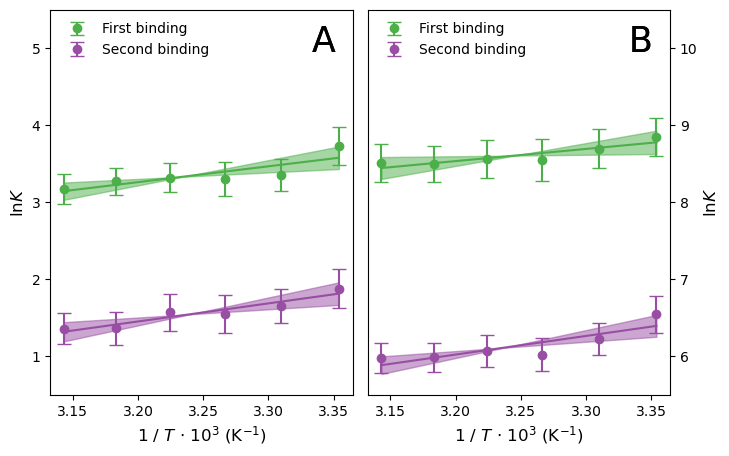

In [31]:
# Binding free energies (from data points) and enthalpties (from slopes) for KCl using OPLS-AA charges (A), 
# and DFT charges (B)
print("Figure S8")

plt.style.use('default')
dataSets = ((BS_opl_bind_1_KCl, BS_opl_bind_2_KCl), (BS_dft_bind_1_KCl, BS_dft_bind_2_KCl))
fig, axes = plt.subplots(ncols=2, figsize=(4*len(dataSets[:]),5))
conv = 1.38064852e-23*298.15*6.0221409e23/1000/4.184
colorArray = [colors[2], colors[3]]
labels = ['First binding', 'Second binding']
ff_labels = ['opls-aa', 'dft']
plotLabels = ['A', 'B']
for i in range(len(dataSets[:])):
    dGs = np.zeros(len(dataSets[0]))
    dG_stds = np.zeros(len(dataSets[0]))
    dHs = np.zeros(len(dataSets[0]))
    dH_stds = np.zeros(len(dataSets[0]))
    for j in range(len(dataSets[0])):

        x = dataSets[i][j][0]
        lnK = dataSets[i][j][1]
        lnK_std = dataSets[i][j][2]
        dH = np.mean(dataSets[i][j][3])
        dH_std = np.std(dataSets[i][j][3])
        slope = dataSets[i][j][4]
        slope_std = dataSets[i][j][6]
        intercept = np.mean(dataSets[i][j][7])
        intercept_std = dataSets[i][j][9]
        axes[i].errorbar(x*1e3, lnK, lnK_std, fmt='o', color=colorArray[j], capsize=5, label=labels[j])
        axes[i].plot(x*1e3,x*slope+intercept, color=colorArray[j])
        axes[i].fill_between(x*1e3,x*(slope+slope_std)+(intercept-intercept_std), x*(slope-slope_std)+(intercept+intercept_std), color=colorArray[j], alpha = 0.5)
        axes[i].set_ylim(5.6, 10.2)
        axes[i].legend(loc='upper left', frameon=False)
        axes[i].set_xlabel('1 / $T$ $\cdot$ 10$^3$ (K$^{-1}$)', fontsize=12)
        axes[i].set_ylabel('$\mathrm{ln}K$', fontsize=12)
        if i == 0:
            axes[i].set_ylim(0.5, 5.5)
            axes[i].annotate("A", (3.333, 4.95), fontsize=25)

        else:
            axes[i].set_ylim(5.5, 10.5)
            axes[i].yaxis.set_label_position("right")
            axes[i].yaxis.tick_right()
            axes[i].annotate("B", (3.333, 9.95), fontsize=25)
        plt.subplots_adjust(hspace=0.05, wspace=0.05)
        plt.savefig("figs/vantHoff_bootstrap_OPLS-AA_DFT.pdf", bbox_inches='tight')
        
        #if j == 0:
        #    print("---------------------------------")
        #    print(ff_labels[i]+' ('+str(plotLabels[i])+')')
        dGs[j] = -lnK[0]*conv
        dG_stds[j] = lnK_std[0]*conv
        dHs[j] = dH*conv
        dH_stds[j] = dH_std*conv
        #print("dG_bind_"+str(j+1)+" =", np.round(dGs[j],1), "+/-", np.round(dG_stds[j],1), "kcal/mol")
        #print("dH_bind_"+str(j+1)+" =", np.round(dHs[j],1), "+/-", np.round(dH_stds[j],1), "kcal/mol")
        #if i == 1 and j == 1:
        #    print("---------------------------------")

Figure S9


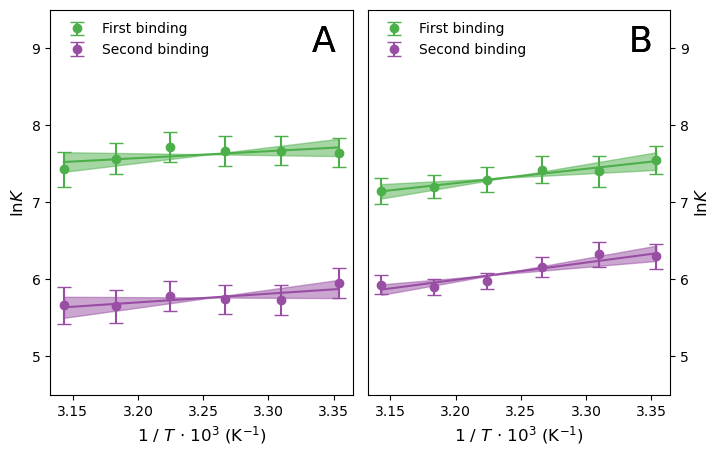

In [32]:
# Binding free energies (from data points) and enthalpties (from slopes) for KI (A) and KSCN (B), 
# using DFT charges
print("Figure S9")

plt.style.use('default')
dataSets = ((BS_dft_bind_1_KI, BS_dft_bind_2_KI), (BS_dft_bind_1_KSCN, BS_dft_bind_2_KSCN))
fig, axes = plt.subplots(ncols=2, figsize=(4*len(dataSets[:]),5))
conv = 1.38064852e-23*298.15*6.0221409e23/1000/4.184
colorArray = [colors[2], colors[3]]
labels = ['First binding', 'Second binding']
ff_labels = ['KI', 'KSCN']
plotLabels = ['A', 'B']
for i in range(len(dataSets[:])):
    dGs = np.zeros(len(dataSets[0]))
    dG_stds = np.zeros(len(dataSets[0]))
    dHs = np.zeros(len(dataSets[0]))
    dH_stds = np.zeros(len(dataSets[0]))
    for j in range(len(dataSets[0])):

        x = dataSets[i][j][0]
        lnK = dataSets[i][j][1]
        lnK_std = dataSets[i][j][2]
        dH = np.mean(dataSets[i][j][3])
        dH_std = np.std(dataSets[i][j][3])
        slope = dataSets[i][j][4]
        slope_std = dataSets[i][j][6]
        intercept = np.mean(dataSets[i][j][7])
        intercept_std = dataSets[i][j][9]
        axes[i].errorbar(x*1e3, lnK, lnK_std, fmt='o', color=colorArray[j], capsize=5, label=labels[j])
        axes[i].plot(x*1e3,x*slope+intercept, color=colorArray[j])
        axes[i].fill_between(x*1e3,x*(slope+slope_std)+(intercept-intercept_std), x*(slope-slope_std)+(intercept+intercept_std), color=colorArray[j], alpha = 0.5)
        axes[i].set_ylim(5.6, 10.2)
        axes[i].legend(loc='upper left', frameon=False)
        axes[i].set_xlabel('1 / $T$ $\cdot$ 10$^3$ (K$^{-1}$)', fontsize=12)
        axes[i].set_ylabel('$\mathrm{ln}K$', fontsize=12)
        if i == 0:
            axes[i].set_ylim(4.5, 9.5)
            axes[i].annotate("A", (3.333, 8.95), fontsize=25)

        else:
            axes[i].set_ylim(4.5, 9.5)
            axes[i].yaxis.set_label_position("right")
            axes[i].yaxis.tick_right()
            axes[i].annotate("B", (3.333, 8.95), fontsize=25)
        plt.subplots_adjust(hspace=0.05, wspace=0.05)
        plt.savefig("figs/vantHoff_bootstrap_KI_KSCN.pdf", bbox_inches='tight')
        
        #if j == 0:
            #print("---------------------------------")
            #print(ff_labels[i]+' ('+str(plotLabels[i])+')')
        dGs[j] = -lnK[0]*conv
        dG_stds[j] = lnK_std[0]*conv
        dHs[j] = dH*conv
        dH_stds[j] = dH_std*conv
        #print("dG_bind_"+str(j+1)+" =", np.round(dGs[j],1), "+/-", np.round(dG_stds[j],1), "kcal/mol")
        #print("dH_bind_"+str(j+1)+" =", np.round(dHs[j],1), "+/-", np.round(dH_stds[j],1), "kcal/mol")
        #if i == 1 and j == 1:
        #    print("---------------------------------")

### b) Conformational ensemble of BCETB
Here, we analyse the conformational ensemble of BCETB using principal component analysis (PCA) applied on the pairwise distances between all heavy atoms (hydrogens excluded) in BCETB. 

In [33]:
def ellipse(u, v, a, b, t_rot):
    
    '''Function returning the points on an ellipse
    
    Parameters
    ---------
    u : x-coordinate around which the ellipse is centered
    v : y-coordinate around which the ellipse is centered
    a : radius of the first ellipse axis (x-axis) 
    b : radius of the second ellipse axis (y-axis)
    t_rot : rotation of the ellipse (rad)
    
    Returns
    -------
    Ell_x : array containing the x-coordinates of the ellipse
    Ell_y : array containing the y-coordinates of the ellipse
    '''    
    
    t = np.linspace(0, 2*pi, 100)
    Ell = np.array([a*np.cos(t) , b*np.sin(t)])  
    R_rot = np.array([[cos(t_rot) , -sin(t_rot)],[sin(t_rot) , cos(t_rot)]])  
    
    Ell_rot = np.zeros((2,Ell.shape[1]))
    for i in range(Ell.shape[1]):
        Ell_rot[:,i] = np.dot(R_rot,Ell[:,i])
    Ell_x = u+Ell_rot[0,:]
    Ell_y = v+Ell_rot[1,:]
    
    return Ell_x,  Ell_y

In [34]:
def calcProbs(xyz, u, v, a, b, t_rot):

    '''Function returning the probability to sample points within an ellipse
    
    Parameters
    ---------
    xyz : loading 3D matrix containing the x- and y-coordinates, and the 
        number of sampled points (z) in the x,y-plane
    u : x-coordinate around which the ellipse is centered
    v : y-coordinate around which the ellipse is centered
    a : radius of the first ellipse axis (x-axis) 
    b : radius of the second ellipse axis (y-axis)
    t_rot : rotation of the ellipse (rad)
    
    Returns
    -------
    Ell_x : array containing the x-coordinates of the ellipse
    Ell_y : array containing the y-coordinates of the ellipse
    '''
    
    x = xyz[0]
    y = xyz[1]
    z = xyz[2]
    counter = [0,0]
    x_in = []
    y_in = []
    for i in range(len(x)):
        for j in range(len(y)):
            if (cos(t_rot)*(x[i]-u)+sin(t_rot)*(y[j]-v))**2/(a**2) + (sin(t_rot)*(x[i]-u)-cos(t_rot)*(y[j]-v))**2/(b**2) < 1 : # Lower left quadrant
                counter[0] += z[i][j] # adding counts inside the ellipse 
                x_in.append(x[i]) # x-coordinates within the ellipse
                y_in.append(y[j]) # y-coordinates within the ellipse
            else: 
                counter[1] += z[i][j] # adding counts outside the ellipse 

    return counter[0]/np.sum(counter), x_in, y_in

In [35]:
# Here we load simulation trajectories with the BCETB complexed with no, 1, and 2 K+
traj0_opl_298K_raw = md.load_xtc('data/simulation/trajectories/ff_oplsaa/kcl/traj_0.xtc', top='data/simulation/trajectories/ff_oplsaa/kcl/top_0.gro') 
traj1_opl_298K_raw = md.load_xtc('data/simulation/trajectories/ff_oplsaa/kcl/traj_1.xtc', top='data/simulation/trajectories/ff_oplsaa/kcl/top_1.gro') 
traj2_opl_298K_raw = md.load_xtc('data/simulation/trajectories/ff_oplsaa/kcl/traj_2.xtc', top='data/simulation/trajectories/ff_oplsaa/kcl/top_2.gro') 
traj0_dft_298K_raw = md.load_xtc('data/simulation/trajectories/ff_dft/kcl/traj_0.xtc', top='data/simulation/trajectories/ff_dft/kcl/top_0.gro') 
traj1_dft_298K_raw = md.load_xtc('data/simulation/trajectories/ff_dft/kcl/traj_1.xtc', top='data/simulation/trajectories/ff_dft/kcl/top_1.gro') 
traj2_dft_298K_raw = md.load_xtc('data/simulation/trajectories/ff_dft/kcl/traj_2.xtc', top='data/simulation/trajectories/ff_dft/kcl/top_2.gro') 

In [36]:
# Supoerposing trajectories to that the reference is the first frame
traj0_opl_298K = traj0_opl_298K_raw.superpose(traj0_opl_298K_raw[0], atom_indices=range(13))
traj1_opl_298K = traj1_opl_298K_raw.superpose(traj1_opl_298K_raw[0], atom_indices=range(13))
traj2_opl_298K = traj2_opl_298K_raw.superpose(traj2_opl_298K_raw[0], atom_indices=range(13))
traj0_dft_298K = traj0_dft_298K_raw.superpose(traj0_dft_298K_raw[0], atom_indices=range(13))
traj1_dft_298K = traj1_dft_298K_raw.superpose(traj1_dft_298K_raw[0], atom_indices=range(13))
traj2_dft_298K = traj2_dft_298K_raw.superpose(traj2_dft_298K_raw[0], atom_indices=range(13))

In [37]:
# Defining heavy atom pairs to use in the calculation of pairwise distances
# (excluding hydrogen)
all_heavy_atom_pairs = traj0_dft_298K.topology.select_pairs('(resname == CRO) and (element != H)',
                                                   '(resname == CRO) and (element != H)')
# Calculating pairwise distances between all heavy atoms 
pairwise_distances0_dft_298K = md.geometry.compute_distances(traj0_dft_298K, all_heavy_atom_pairs, periodic=True)
pairwise_distances1_dft_298K = md.geometry.compute_distances(traj1_dft_298K, all_heavy_atom_pairs, periodic=True)
pairwise_distances2_dft_298K = md.geometry.compute_distances(traj2_dft_298K, all_heavy_atom_pairs, periodic=True)

pairwise_distances0_opl_298K = md.geometry.compute_distances(traj0_opl_298K, all_heavy_atom_pairs, periodic=True)
pairwise_distances1_opl_298K = md.geometry.compute_distances(traj1_opl_298K, all_heavy_atom_pairs, periodic=True)
pairwise_distances2_opl_298K = md.geometry.compute_distances(traj2_opl_298K, all_heavy_atom_pairs, periodic=True)

In [38]:
# Concatenating pairwise distances for trajectories using OPLS-AA charges
fulllist = np.concatenate((pairwise_distances0_opl_298K,
                           pairwise_distances1_opl_298K,
                           pairwise_distances2_opl_298K
                          ), axis=0)

# Performing PCA analysis on the trajectories using OPLS-AA charges    
full_reduced_opl = PCA(fulllist, dim=-1)

# Calculating coverages
cov1_opl = full_reduced_opl.eigenvalues[0]/full_reduced_opl.eigenvalues.sum()*100
cov2_opl = full_reduced_opl.eigenvalues[1]/full_reduced_opl.eigenvalues.sum()*100
print("Coverage of first principal component, OPLS-AA = {0:.0f}".format(np.round(cov1_opl,0)), " %")
print("Coverage of second principal component, OPLS-AA = {0:.0f}".format(np.round(cov2_opl,0)), " %")

full_reduced_opl = PCA(fulllist, dim=-1).get_output()[0]

# Concatenating pairwise distances for trajectories using DFT charges
fulllist = np.concatenate((pairwise_distances0_dft_298K,
                           pairwise_distances1_dft_298K,
                           pairwise_distances2_dft_298K
                          ), axis=0)

# Performing PCA analysis on the trajectories using DFT charges 
full_reduced_dft = PCA(fulllist, dim=-1)
cov1_dft = full_reduced_dft.eigenvalues[0]/full_reduced_dft.eigenvalues.sum()*100
cov2_dft = full_reduced_dft.eigenvalues[1]/full_reduced_dft.eigenvalues.sum()*100
print("Coverage of first principal component, DFT = {0:.0f}".format(np.round(cov1_dft,0)), " %")
print("Coverage of second principal component, DFT = {0:.0f}".format(np.round(cov2_dft,0)), " %")

full_reduced_dft = PCA       (fulllist, dim=-1).get_output()[0]

Coverage of first principal component, OPLS-AA = 64  %
Coverage of second principal component, OPLS-AA = 15  %
Coverage of first principal component, DFT = 64  %
Coverage of second principal component, DFT = 17  %


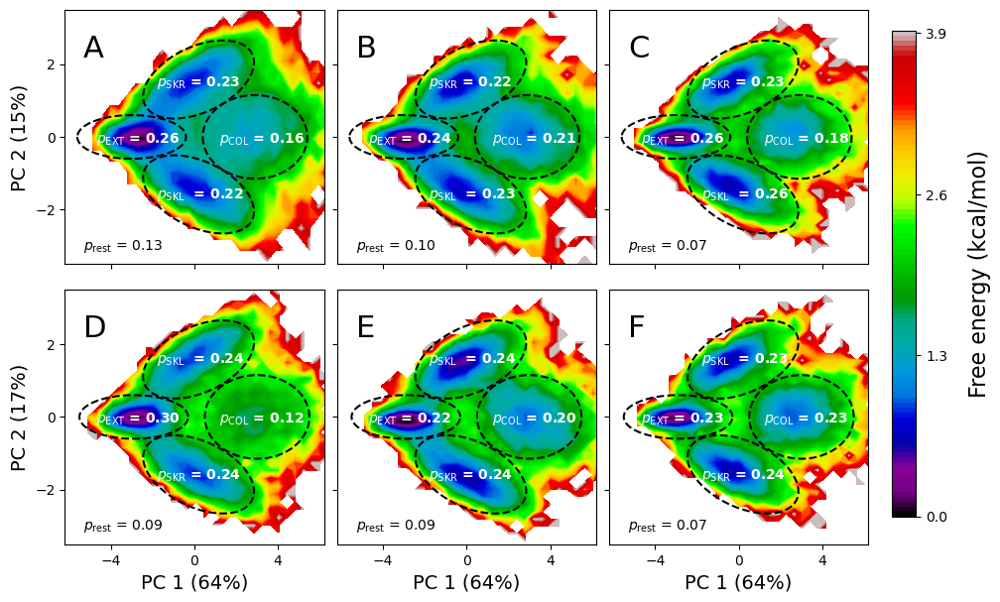

In [39]:
# PCA plots using OPLS-AA charges for 0, 1, and 2 K+ bound (plots A, B, and C, respectively)
# and using DFT charges for 0, 1, and 2 K+ bound (plots D, E, and F, respectively)

plt.style.use('default')

nbins=35 # number of bins to use when histogramming the free energies in PCA space

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12,7))

# Defining plot objects (25001 frames per simulated state (no, 1, and 2 K+ bound))
# by calling free energy program (freeEnergy.py loaded as fe)
# OPLS-AA charges
plot1 = fe.plot_free_energy(full_reduced_opl[:,0][:25001], full_reduced_opl[:,1][:25001], nbins=nbins, ncountours=100, avoid_zero_count=False,
                    ax=axes[0,0], cbar=None, cmap='nipy_spectral', minener_zero=True, kT=2.479/4.184)

plot2 = fe.plot_free_energy(full_reduced_opl[:,0][25001:50002], full_reduced_opl[:,1][25001:50002], nbins=nbins, ncountours=100, avoid_zero_count=False,
                    ax=axes[0,1], cbar=None, cmap='nipy_spectral', minener_zero=True, kT=2.479/4.184)

plot3 = fe.plot_free_energy(full_reduced_opl[:,0][50002:75003], full_reduced_opl[:,1][50002:75003], nbins=nbins, ncountours=100, avoid_zero_count=False,
                    ax=axes[0,2], cbar=None, cmap='nipy_spectral', minener_zero=True, kT=2.479/4.184)

# DFT charges
plot4 = fe.plot_free_energy(full_reduced_dft[:,0][:25001], full_reduced_dft[:,1][:25001], nbins=nbins, ncountours=100, avoid_zero_count=False,
                    ax=axes[1,0], cbar=None, cmap='nipy_spectral', minener_zero=True, kT=2.479/4.184)

plot5 = fe.plot_free_energy(full_reduced_dft[:,0][25001:50002], full_reduced_dft[:,1][25001:50002], nbins=nbins, ncountours=100, avoid_zero_count=False,
                    ax=axes[1,1], cbar=None, cmap='nipy_spectral', minener_zero=True, kT=2.479/4.184)

plot6 = fe.plot_free_energy(full_reduced_dft[:,0][50002:75003], full_reduced_dft[:,1][50002:75003], nbins=nbins, ncountours=100, avoid_zero_count=False,
                           ax=axes[1,2], cbar=None, cmap='nipy_spectral', minener_zero=True, kT=2.479/4.184)

fig.subplots_adjust(right=0.8, wspace=0.35)

cbar_ax = fig.add_axes([0.82, 0.15, 0.02, 0.7])
cbar = fig.colorbar(plot1[2], cax=cbar_ax, ticks=[0, 1.3, 2.6, 3.9])


cbar.ax.set_ylabel('Free energy (kcal/mol)', fontsize=16, labelpad=15)
plots = [plot1,plot2,plot3,plot4,plot5,plot6]
p1, p2, p3, p4 = np.zeros(6), np.zeros(6), np.zeros(6), np.zeros(6)
plotLabels = ['A', 'B', 'C', 'D', 'E', 'F']
for i,ax in enumerate(axes.flat):
    # OPLS-AA charges
    if i < 3:
        x1, y1 = ellipse(-0.2,1.58,2.7,0.95,-0.2) # x- and y-coordinates within ellipse enclosing minimum
        ax.plot(x1, y1, '--', color='black')
        p1[i], x_in1, y_in1 = calcProbs(plots[i][3], -0.2,1.58,2.7,0.95,-0.2) # calculating probability to be in that ellipse
        
        x2, y2 = ellipse(3,0.0,2.6,0.6,0)
        ax.plot(x2, y2, '--', color='black')
        p2[i], x_in2, y_in2 = calcProbs(plots[i][3],3,0.0,2.6,0.6,0)
        
        x3, y3 = ellipse(-0.2,-1.58,2.7,0.95,0.2)
        ax.plot(x3, y3, '--', color='black')
        p3[i], x_in3, y_in3 = calcProbs(plots[i][3], -0.2,-1.58,2.7,0.95,0.2)
        
        x4, y4 = ellipse(-2.9,0.0,2.5,1.15,0)
        ax.plot(x4, y4, '--', color='black')
        p4[i], x_in4, y_in4 = calcProbs(plots[i][3], -2.9,0.0,2.5,1.15,0)
        ax.text(1.8, 1.67, "${p_{\mathrm{SKL}}}$  = "+str("%.2f" % round(p1[i], 2)), color='white', fontsize=10, fontweight="bold")
        ax.text(4.7, 0.15, "${p_{\mathrm{EXT}}}$ = "+str("%.2f" % round(p2[i], 2)), color='white', fontsize=10, fontweight="bold")
        ax.text(1.8, -1.4, "${p_{\mathrm{SKR}}}$ = "+str("%.2f" % round(p3[i], 2)), color='white', fontsize=10, fontweight="bold")
        ax.text(-1.2, 0.15, "${p_{\mathrm{COL}}}$ = "+str("%.2f" % round(p4[i], 2)), color='white', fontsize=10, fontweight="bold")
        ax.text(5.3, 3.1, "$p_{\mathrm{rest}}$ = "+str("%.2f" % round(1-(p1[i]+p2[i]+p3[i]+p4[i]), 2)), color='black', fontsize=10)
        ax.text(5.3, -2.2, plotLabels[i], fontsize=22)

    # DFT charges
    else:
        x1, y1 = ellipse(0.2,1.58,2.7,0.95,0.2)
        ax.plot(x1, y1, '--', color='black')
        p1[i], x_in1, y_in1 = calcProbs(plots[i][3], 0.2,1.58,2.7,0.95,0.2)
        
        x2, y2 = ellipse(-2.9,0.0,2.6,0.6,0)
        ax.plot(x2, y2, '--', color='black')
        p2[i], x_in2, y_in2 = calcProbs(plots[i][3],-2.9,0.0,2.6,0.6,0)
        
        x3, y3 = ellipse(0.2,-1.58,2.7,0.95,-0.2)
        ax.plot(x3, y3, '--', color='black')
        p3[i], x_in3, y_in3 = calcProbs(plots[i][3], 0.2,-1.58,2.7,0.95,-0.2)
        
        x4, y4 = ellipse(3,0.0,2.5,1.15,0)
        ax.plot(x4, y4, '--', color='black')
        p4[i], x_in4, y_in4 = calcProbs(plots[i][3], 3,0.0,2.5,1.15,0)
        
        ax.text(-1.8, 1.5, "${p_{\mathrm{SKL}}}$  = "+str("%.2f" % round(p1[i], 2)), color='white', fontsize=10, fontweight="bold")
        ax.text(-4.7, -0.15, "$p_{\mathrm{EXT}}$ = "+str("%.2f" % round(p2[i], 2)), color='white', fontsize=10, fontweight="bold")
        ax.text(-1.8, -1.7, "$p_{\mathrm{SKR}}$ = "+str("%.2f" % round(p3[i], 2)), color='white', fontsize=10, fontweight="bold")
        ax.text(1.2, -0.15, "$p_{\mathrm{COL}}$ = "+str("%.2f" % round(p4[i], 2)), color='white', fontsize=10, fontweight="bold")
        ax.text(-5.3, -3.1, "$p_{\mathrm{rest}}$ = "+str("%.2f" % round(1-(p1[i]+p2[i]+p3[i]+p4[i]), 2)), color='black', fontsize=10)
        ax.text(-5.3, 2.2, plotLabels[i], fontsize=22)
    
    ax.set_xlim(-6.2, 6.2)
    ax.set_ylim(-3.5, 3.5)
    
    if not 0 <= i <= 2:
        ax.set_xlabel("PC 1 ({0:.0f}".format(np.round(cov1_opl,0))+"%)", fontsize=14)
        
        
    if i == 0:
        ax.set_ylabel("PC 2 ({0:.0f}".format(np.round(cov2_opl,0))+"%)", fontsize=14)
        y_tick_labels = ['$-$2', '0', '2']
        ax.set_yticks([-2, 0, 2])
    if i == 3:
        ax.set_ylabel("PC 2 ({0:.0f}".format(np.round(cov2_dft,0))+"%)", fontsize=14)
        y_tick_labels = ['$-$2', '0', '2']
        ax.set_yticks([-2, 0, 2])
    if i < 3:
        ax.invert_xaxis() # inverting axes to make PCA space appear in the same 
        ax.invert_yaxis() # direction for both force fields (easier comparison)
        ax.set_xticks([4,0,-4])
        y_tick_labels = ['2', '0', '$-$2']
        ax.set_yticks([-2, 0, 2])
        ax.set_yticklabels(y_tick_labels)
    if 0 <= i <= 2: 
        ax.set_xticks([-4,0,4])
        plt.setp(ax.get_xticklabels(), visible=False)

    if i == 1 or i == 2 or i == 4 or i == 5:
        y_tick_labels = ['$-$2', '0', '2']
        ax.set_yticks([-2, 0, 2])
        plt.setp(ax.get_yticklabels(), visible=False)
    if i > 2:
        x_tick_labels = ['$-$4', '0', '4']
        ax.set_xticks([-4, 0, 4])
        y_tick_labels = ['$-$2','0','2']
        ax.set_yticks([-2,0,2])

    plt.subplots_adjust(hspace=0.10, wspace=0.05)
    plt.savefig("figs/PCA_both_ff.pdf", bbox_inches='tight')

Figure S10


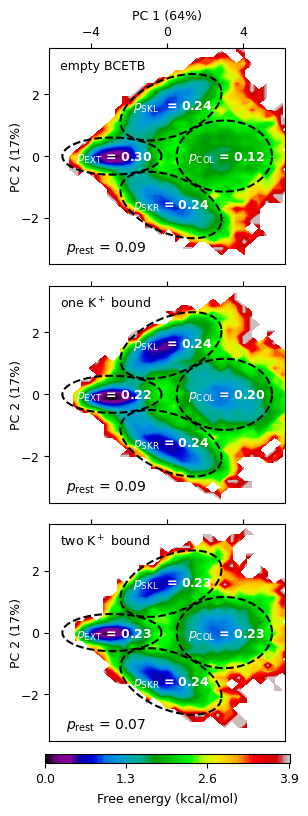

In [40]:
# Same as cell above but only plotting the results using DFT charges
print("Figure S10")
plt.style.use('default')

nbins=35

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(3.5,9))

plot1 = fe.plot_free_energy(full_reduced_dft[:,0][:25001], full_reduced_dft[:,1][:25001], nbins=nbins, ncountours=100, avoid_zero_count=False,
                    ax=axes[0], cbar=None, cmap='nipy_spectral', minener_zero=True, kT=2.479/4.184)

plot2 = fe.plot_free_energy(full_reduced_dft[:,0][25001:50002], full_reduced_dft[:,1][25001:50002], nbins=nbins, ncountours=100, avoid_zero_count=False,
                    ax=axes[1], cbar=None, cmap='nipy_spectral', minener_zero=True, kT=2.479/4.184)

plot3 = fe.plot_free_energy(full_reduced_dft[:,0][50002:75003], full_reduced_dft[:,1][50002:75003], nbins=nbins, ncountours=100, avoid_zero_count=False,
                           ax=axes[2], cbar=None, cmap='nipy_spectral', minener_zero=True, kT=2.479/4.184)

fig.subplots_adjust(right=0.8, wspace=0.35)

cbar_ax = fig.add_axes([0.113, 0.085, 0.7, 0.010])
#cbar_ax = fig.add_axes([0.113, 0.1, 0.7, 0.010])
cbar = fig.colorbar(plot1[2], cax=cbar_ax, orientation="horizontal", ticks=[0, 1.3, 2.6, 3.9])
cbar.ax.tick_params(labelsize=9)
cbar.ax.set_xlabel('Free energy (kcal/mol)', fontsize=9, labelpad=15)
cbar.ax.get_xaxis().labelpad = 5
plots = [plot1,plot2,plot3]
p1, p2, p3, p4 = np.zeros(6), np.zeros(6), np.zeros(6), np.zeros(6)
plotLabels = ['empty BCETB', 'one K$^+$ bound', 'two K$^+$ bound']
for i,ax in enumerate(axes.flat):
    x1, y1 = ellipse(0.2,1.58,2.7,0.95,0.2)
    ax.plot(x1, y1, '--', color='black')
    p1[i], x_in1, y_in1 = calcProbs(plots[i][3], 0.2,1.58,2.7,0.95,0.2)
    
    x2, y2 = ellipse(-2.9,0.0,2.6,0.6,0)
    ax.plot(x2, y2, '--', color='black')
    p2[i], x_in2, y_in2 = calcProbs(plots[i][3],-2.9,0.0,2.6,0.6,0)
    
    x3, y3 = ellipse(0.2,-1.58,2.7,0.95,-0.2)
    ax.plot(x3, y3, '--', color='black')
    p3[i], x_in3, y_in3 = calcProbs(plots[i][3], 0.2,-1.58,2.7,0.95,-0.2)
    
    x4, y4 = ellipse(3,0.0,2.5,1.15,0)
    ax.plot(x4, y4, '--', color='black')
    p4[i], x_in4, y_in4 = calcProbs(plots[i][3], 3,0.0,2.5,1.15,0)
    
    ax.text(-1.8, 1.5, "${p_{\mathrm{SKL}}}$  = "+str("%.2f" % round(p1[i], 2)), color='white', fontsize=9, fontweight="bold")
    ax.text(-4.8, -0.15, "$p_{\mathrm{EXT}}$ = "+str("%.2f" % round(p2[i], 2)), color='white', fontsize=9, fontweight="bold")
    ax.text(-1.8, -1.7, "$p_{\mathrm{SKR}}$ = "+str("%.2f" % round(p3[i], 2)), color='white', fontsize=9, fontweight="bold")
    ax.text(1.1, -0.15, "$p_{\mathrm{COL}}$ = "+str("%.2f" % round(p4[i], 2)), color='white', fontsize=9, fontweight="bold")
    ax.text(-5.3, -3.1, "$p_{\mathrm{rest}}$ = "+str("%.2f" % round(1-(p1[i]+p2[i]+p3[i]+p4[i]), 2)), color='black', fontsize=10)
    ax.text(-5.6, 2.8, plotLabels[i], fontsize=9)
    
    ax.set_xlim(-6.2, 6.2)
    ax.set_ylim(-3.5, 3.5)
    
    if i == 0:
        ax.set_xlabel("PC 1 ({0:.0f}".format(np.round(cov1_dft,0))+"%)", fontsize=9)
        ax.set_xticklabels(['$-$4','0','4'], fontsize=9) 
        ax.xaxis.set_label_position("top")
        ax.xaxis.tick_top()
        ax.set_xticks([-4,0,4])
    
    elif i == 1: 
        ax.xaxis.set_label_position("top")
        ax.xaxis.tick_top()
        ax.set_xticks([-4,0,4])
        plt.setp(ax.get_xticklabels(), visible=False)
    
    elif i == 2:
        ax.xaxis.set_label_position("top")
        ax.xaxis.tick_top()
        ax.set_xticks([-4,0,4])
        plt.setp(ax.get_xticklabels(), visible=False)
        
    ax.set_ylabel("PC 2 ({0:.0f}".format(np.round(cov2_dft,0))+"%)", fontsize=9, labelpad=-2)
    ax.set_yticklabels("PC2 ()", fontsize=9) 
    y_tick_labels = ['2','0','$-$2']
    ax.set_yticks([2,0,-2])
    ax.set_yticklabels(y_tick_labels)

    plt.subplots_adjust(hspace=0.10, wspace=0.05)
    plt.savefig("figs/PCA_DFT.pdf", bbox_inches='tight')

Figure S11


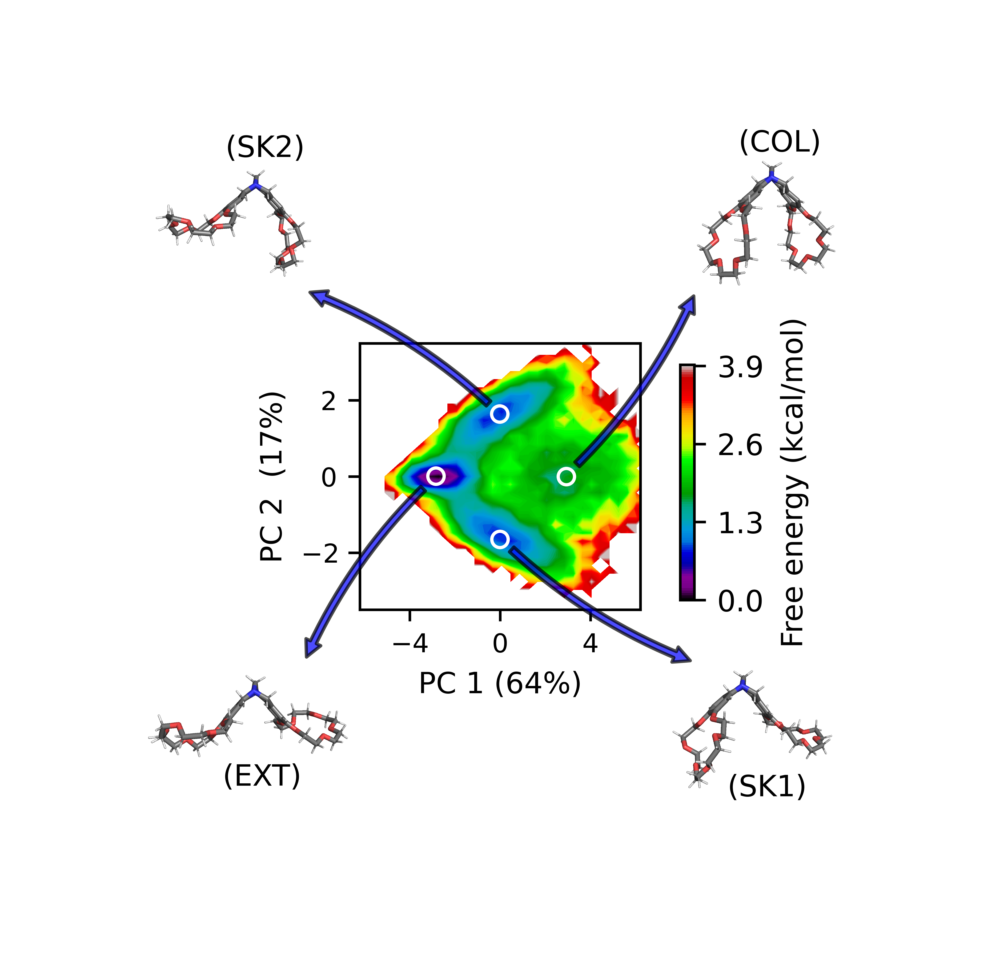

In [41]:
# Figure illustrating which minimum belongs to which conformation

print("Figure S11")
plt.rcParams['figure.dpi']= 1000

fig = plt.figure(figsize=(6,5))
ax1 = plt.subplot2grid((3, 3), (1, 1))
ax2 = plt.subplot2grid((3, 3), (0, 0))
ax3 = plt.subplot2grid((3, 3), (2, 0))
ax4 = plt.subplot2grid((3, 3), (2, 2))
ax5 = plt.subplot2grid((3, 3), (0, 2))
axes = (ax2, ax3, ax4, ax5)
conf1 = img.imread('data/simulation/frames/no_K_bound/SK2.png') 
conf2 = img.imread('data/simulation/frames/no_K_bound/EXT.png') 
conf3 = img.imread('data/simulation/frames/no_K_bound/SK1.png') 
conf4 = img.imread('data/simulation/frames/no_K_bound/COL.png')  
confs = (conf1, conf2, conf3, conf4)
locs = ((0.75, 0.25), (0.8, 0.8), (0.20, 0.75), (0.25, 0.25))
zooms = (0.05, 0.06, 0.05, 0.045)
locsName = ((0.72,0.5),(0.71,0.54),(0.11,0.50),(0.15,0.52))
names = ('(SK2)', '(EXT)', '(SK1)', '(COL)')
nbins=35
arrowstarts = ((0.3, -1.6), (2.7, 0.0), (0.3, 1.6), (-2.7,0.0))
arrowends = ((0.67, 0.3), (0.67, 0.7), (0.37, 0.7), (0.37, 0.3))
for i in range(4):
    imagebox = OffsetImage(confs[i], zoom = zooms[i])
    ab = AnnotationBbox(imagebox, locs[i], frameon=False)
    axes[i].add_artist(ab)
    axes[i].axis('off')
    axes[i].annotate(names[i], locsName[i], fontsize=9, zorder=10)

plot1 = fe.plot_free_energy(full_reduced_dft[:,0][:25001], full_reduced_dft[:,1][:25001], nbins=nbins, ncountours=100, avoid_zero_count=False,
                    ax=ax1, cbar=None, cmap='nipy_spectral', minener_zero=True, kT=2.479/4.184)

ax1.plot(full_reduced_dft[:,0][19341],  full_reduced_dft[:,1][19341], 'o', mfc='none', markeredgewidth=1.0, markersize=5, color='white') # EXT
ax1.plot(full_reduced_dft[:,0][8943],  full_reduced_dft[:,1][8943], 'o', mfc='none', markeredgewidth=1.0, markersize=5, color='white') # U
ax1.plot(full_reduced_dft[:,0][10824],  full_reduced_dft[:,1][10824], 'o', mfc='none', markeredgewidth=1.0, markersize=5, color='white') # L
ax1.plot(full_reduced_dft[:,0][20007],  full_reduced_dft[:,1][20007], 'o', mfc='none', markeredgewidth=1.0, markersize=5, color='white') # COL

fig.subplots_adjust(right=0.8, wspace=0.35) 

cbar_ax = fig.add_axes([0.59, 0.39, 0.01, 0.2])
cbar = fig.colorbar(plot1[2], cax=cbar_ax, ticks=[0, 1.3, 2.6, 3.9])
cbar.ax.set_ylabel('Free energy (kcal/mol)', fontsize=9, labelpad=5)
cbar.ax.tick_params(labelsize=9)
ax1.set_xlabel("PC 1 ({0:.0f}".format(np.round(cov1_dft,0))+"%)", fontsize=9)
ax1.set_ylabel("PC 2  ({0:.0f}".format(np.round(cov2_dft,0))+"%)", fontsize=9)
ax1.set_xticks([-4,0,4])
#ax1.set_xticklabels(x_tick_labels)
y_tick_labels = ['2','0','$-$2']
ax1.set_yticks([2,0,-2])
ax1.set_yticklabels(y_tick_labels)
ax1.set_xlim(5.7, -6.7)
ax1.set_ylim(3.5, -3.5)
ax1.tick_params(labelsize=8)
ax1.set_xlim(-6.2, 6.2)
ax1.set_ylim(-3.5, 3.5)
plt.subplots_adjust(hspace=0.2, wspace=0.2)

# Create the arrow
# 1. Get transformation operators for axis and figure
ax0tr = ax1.transData # Axis 0 -> Display
ax1tr = ax2.transData # Axis 1 -> Display
figtr = fig.transFigure.inverted() # Display -> Figure
# 2. Transform arrow start point from axis 0 to figure coordinates
ptB = figtr.transform(ax0tr.transform((-0.3, 1.8)))
# 3. Transform arrow end point from axis 1 to figure coordinates
ptE = figtr.transform(ax1tr.transform((1, 0)))
# 4. Create the patch
arrow = matplotlib.patches.FancyArrowPatch(
    ptB, ptE, transform=fig.transFigure,  # Place arrow in figure coord system
    fc = "b", connectionstyle="arc3,rad=0.1", arrowstyle='simple', alpha = 0.7,
    mutation_scale = 10.
)
# 5. Add patch to list of objects to draw onto the figure
fig.patches.append(arrow)

# Create the arrow
# 1. Get transformation operators for axis and figure
ax0tr = ax1.transData # Axis 0 -> Display
ax1tr = ax3.transData # Axis 1 -> Display
figtr = fig.transFigure.inverted() # Display -> Figure
# 2. Transform arrow start point from axis 0 to figure coordinates
ptB = figtr.transform(ax0tr.transform((-3.2, -0.2)))
# 3. Transform arrow end point from axis 1 to figure coordinates
ptE = figtr.transform(ax1tr.transform((1, 1)))
# 4. Create the patch
arrow = matplotlib.patches.FancyArrowPatch(
    ptB, ptE, transform=fig.transFigure,  # Place arrow in figure coord system
    fc = "b", connectionstyle="arc3,rad=0.1", arrowstyle='simple', alpha = 0.7,
    mutation_scale = 10.
)
# 5. Add patch to list of objects to draw onto the figure
fig.patches.append(arrow)

# Create the arrow
# 1. Get transformation operators for axis and figure
ax0tr = ax1.transData # Axis 0 -> Display
ax1tr = ax4.transData # Axis 1 -> Display
figtr = fig.transFigure.inverted() # Display -> Figure
# 2. Transform arrow start point from axis 0 to figure coordinates
ptB = figtr.transform(ax0tr.transform((0.3, -1.8)))
# 3. Transform arrow end point from axis 1 to figure coordinates
ptE = figtr.transform(ax1tr.transform((0, 1)))
# 4. Create the patch
arrow = matplotlib.patches.FancyArrowPatch(
    ptB, ptE, transform=fig.transFigure,  # Place arrow in figure coord system
    fc = "b", connectionstyle="arc3,rad=0.1", arrowstyle='simple', alpha = 0.7,
    mutation_scale = 10.
)
# 5. Add patch to list of objects to draw onto the figure
fig.patches.append(arrow)

# Create the arrow
# 1. Get transformation operators for axis and figure
ax0tr = ax1.transData # Axis 0 -> Display
ax1tr = ax5.transData # Axis 1 -> Display
figtr = fig.transFigure.inverted() # Display -> Figure
# 2. Transform arrow start point from axis 0 to figure coordinates
ptB = figtr.transform(ax0tr.transform((3.2, 0.2)))
# 3. Transform arrow end point from axis 1 to figure coordinates
ptE = figtr.transform(ax1tr.transform((0, 0)))
# 4. Create the patch
arrow = matplotlib.patches.FancyArrowPatch(
    ptB, ptE, transform=fig.transFigure,  # Place arrow in figure coord system
    fc = "b", connectionstyle="arc3,rad=0.1", arrowstyle='simple', alpha = 0.7,
    mutation_scale = 10.
)
# 5. Add patch to list of objects to draw onto the figure
fig.patches.append(arrow)
plt.savefig("figs/PCA_explanation.pdf", bbox_inches='tight')




In [42]:
# Here we defined a function that calculates the mean probabilities of the different conformations (p_mean),
# and their errors (p_err) using bootstrapping
def calcError(PCA_data, nBlocks, nResamples, nStates, u, v, a, b, rot):
    '''Function returning the mean probability and the standard error of the 
    probability to sample points within an ellipse
    
    Parameters
    ---------
    PCA_data : loading data returned by the PCA analysis on the pairwise distances
    nBlocks : number of blocks to split the trajectory in
    nResamples : number of times to resample the block estimates (used for the 
        bootstrapping method to calculate the standard error)
    nStates : number of bound states (3)
    u : x-coordinate around which the ellipse is centered
    v : y-coordinate around which the ellipse is centered
    a : radius of the first ellipse axis (x-axis) 
    b : radius of the second ellipse axis (y-axis)
    t_rot : rotation of the ellipse (rad)
    
    Returns
    -------
    p_mean : mean probability to sample points within ellipse
    p_err : standard error of probability to sample points within ellipse
    '''
    incr = len(PCA_data)/nStates/nBlocks
    p_new_mean = np.zeros(nResamples)
    p_mean = np.zeros(nStates)
    p_err = np.zeros(nStates)
    for h in range(nStates):
        start = h*len(PCA_data)/nStates
        p = np.zeros(nBlocks)
        p_new = np.zeros(nBlocks)

        for i in range(nBlocks):
            
            data = fe.plot_free_energy(PCA_data[:,0][int(start+i*incr):int(start+(i+1)*incr)], PCA_data[:,1][int(start+i*incr):int(start+(i+1)*incr)], nbins=50, ncountours=100, avoid_zero_count=False,
                       ax=None, cbar=None, cmap='nipy_spectral', minener_zero=False, kT=2.479)
            p[i], x_in, y_in = calcProbs(data[3], u, v, a, b, rot)

        for j in range(nResamples):
            p_new[:] = resample(p, n_samples=nBlocks, replace=True)
            p_new_mean[j] = np.mean(p_new[:])
        p_mean[h] = np.mean(p_new_mean[:])
        p_err[h] = np.std(p_new_mean[:])
    return p_mean, p_err

In [43]:
# Here we assign mean probabilities and standard errors of the probabilities to
# arrays (p1, p2, p3, and p4) corresponding to the four different conformations
# (EXT, SK1, COL, and SK2)
listdata = (full_reduced_opl, full_reduced_dft)
nStates = 3
p1_mean, p2_mean, p3_mean, p4_mean = np.zeros((len(listdata), nStates)), np.zeros((len(listdata), nStates)), np.zeros((len(listdata), nStates)), np.zeros((len(listdata), nStates))
p1_std, p2_std, p3_std, p4_std = np.zeros((len(listdata), nStates)), np.zeros((len(listdata), nStates)), np.zeros((len(listdata), nStates)), np.zeros((len(listdata), nStates))

for i in range(len(listdata)):
    if i == 0: # OPLS_AA charges
        p1_mean[i,:], p1_std[i,:] = calcError(listdata[i], 10, 100000, 3, -0.2, 1.58, 2.7, 0.95, -0.2)
        p2_mean[i,:], p2_std[i,:] = calcError(listdata[i], 10, 100000, 3, 3, 0.0, 2.6, 0.6, 0) 
        p3_mean[i,:], p3_std[i,:] = calcError(listdata[i], 10, 100000, 3, -0.2,-1.58,2.7,0.95,0.2)
        p4_mean[i,:], p4_std[i,:] = calcError(listdata[i], 10, 100000, 3, -2.9,0.0,2.5,1.15,0)
    else: # DFT charges
        p1_mean[i,:], p1_std[i,:] = calcError(listdata[i], 10, 100000, 3, 0.2,1.58,2.7,0.95,0.2)
        p2_mean[i,:], p2_std[i,:] = calcError(listdata[i], 10, 100000, 3, -2.9,0.0,2.6,0.6,0)
        p3_mean[i,:], p3_std[i,:] = calcError(listdata[i], 10, 100000, 3, 0.2, -1.58, 2.7, 0.95, -0.2)
        p4_mean[i,:], p4_std[i,:] = calcError(listdata[i], 10, 100000, 3, 3, 0.0, 2.5, 1.15, 0)

Figure 4


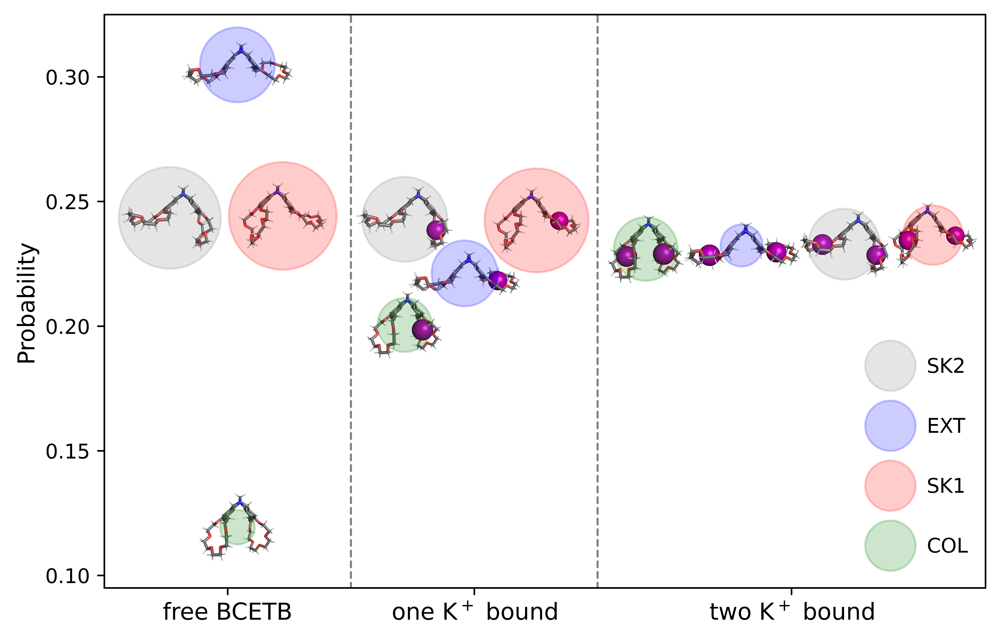

In [44]:
# Here we plot the probabilities of the four conformations using DFT charges
# The radii of the spheres enclosing the conformations correspond to the standard
# errors of the probabilities

print("Figure 4")

plt.rcParams['figure.dpi']= 1000
fig, ax = plt.subplots(1,1, figsize=(7,4.5))

paths = [['no_K_bound/SK2.png', 'no_K_bound/EXT.png', 'no_K_bound/SK1.png', 'no_K_bound/COL.png'],
         ['1_K_bound/SK2.png', '1_K_bound/EXT.png', '1_K_bound/SK1.png', '1_K_bound/COL.png'],
         ['2_K_bound/SK2.png', '2_K_bound/EXT.png', '2_K_bound/SK1.png', '2_K_bound/COL.png']]

color = ['gray', 'blue', 'red', 'green']
label = ['SK2', 'EXT', 'SK1', 'COL']
p = (p1_mean, p2_mean, p3_mean, p4_mean)
perr = (p1_std, p2_std, p3_std, p4_std)

shift = 0.2

x = [[0-1.22*shift, 0, 0+0.82*shift, 0], [1-1.98*shift, 1-0.9*shift, 1+0.4*shift, 1-1.98*shift], [2.05+shift*0.7, 2.05-shift*1.15, 2.05+shift*2.3, 2.05-shift*2.88]] # SK2,EXT,SK1,COL
zooms = [[0.050, 0.054, 0.045, 0.0395], [0.050, 0.054, 0.045, 0.0395], [0.050, 0.057, 0.045, 0.04]] #[0.050, 0.051, 0.045, 0.0395]
for i in range(len(p1_mean[0,:])):

    for j in range(4):
        shift = 0
        conf = img.imread('data/simulation/frames/'+paths[i][j])

        if j == 1:
            zoom = 0.051 # EXT
        elif j == 2: 
            zoom = 0.048 # SK1
        elif j == 3:
            zoom = 0.04 # COL
        else:
            zoom = 0.048 # SK2
        imagebox = OffsetImage(conf, zoom=zooms[i][j])
        
        ab = AnnotationBbox(imagebox, (x[i][j], p[j][1,i]), frameon=False)
        ax.add_artist(ab)
        
        ax.scatter(x[i][j], p[j][1,i], s=2550*(perr[j][1,i]/perr[0][1,0])**2, color=color[j], alpha=0.2, zorder=10)


x_tick_labels = ["free BCETB", "one K$^+$ bound", "two K$^+$ bound"]
ax.set_xlim(-0.48, 2.7)
ax.set_ylim(0.095, 0.325)
ax.vlines(1.3, 0, 0.35, color='black', ls='--', alpha=0.5, lw=1)
ax.vlines(0.41, 0, 0.35, color='black', ls='--', alpha=0.5, lw=1)
ax.set_xticks([-0.035,0.855,2])
ax.set_xticklabels(x_tick_labels, fontsize=11.5)
ax.set_yticks([0.10, 0.15,0.20,0.25,0.30])
ax.set_ylabel("Probability", fontsize=11.5)
legend_elements = [Line2D([0], [0], marker='o', color='w', label='SK2',
                          markeredgecolor='gray', markerfacecolor='gray', markersize=25, alpha=0.2), 
                  Line2D([0], [0], marker='o', color='w', label='EXT',
                          markeredgecolor='blue', markerfacecolor='blue', markersize=25, alpha=0.2), 
                  Line2D([0], [0], marker='o', color='w', label='SK1',
                          markeredgecolor='red', markerfacecolor='red', markersize=25, alpha=0.2), 
                  Line2D([0], [0], marker='o', color='w', label='COL',
                          markeredgecolor='green', markerfacecolor='green', markersize=25, alpha=0.2)]
ax.legend(handles=legend_elements, loc=(0.86, 0.04), frameon=False, labelspacing=2)
plt.subplots_adjust(hspace=0.05)
plt.tight_layout()
plt.savefig("figs/conformation_probability_DFT.pdf", bbox_to_incxhes="tight")

### c) Potential energies of the complexes and the conformations
Here we analyse internal potential energies of BCETB (water and counter ions excluded):
1. First, we present the potential energies of the complexes (no, one, and two K$^+$ bound) averaged over all conformations (SK2, EXT, SK1, COL, and rest).
2. Second, we dissect the overall complex potential energies into contributions from the different conformations (SK2, EXT, SK1, COL, and rest) by calculating the probability weighted potential energies of the conformations, $pU$, using the probabilities from the PCA analysis and the potential energies for the different conformations. 

In [45]:
def complexEnergies(Us, nBlocks, nResamples, nStates):
    '''Function returning potential energies of the complexes, averaged over all 
    conformations, and their standard errors
    
    Parameters
    ---------
    Us : array containing potential energies for all frames, 
        dimension = (nStates, number of frames) 
    nBlocks : number of blocks to split the array of potential energies into when 
        calculating the standard error 
    nResamples : number of times to resample the block estimates (used for the 
        bootstrapping method to calculate the standard error)
    nStates : number of bound states (3: no K+ bound, one K+ bound, and two K+ bound)
    
    Returns
    -------
    U_mean : array containing mean potential energies of the complexes in kcal/mol
        (one per bound state)
    U_err : array containing standard errors of the  potential energies in kcal/mol
        (one per bound state)
    '''
    # initializing variables
    U_new_mean = np.zeros(nResamples)
    U_mean = np.zeros(nStates)
    U_err = np.zeros(nStates)
    conv = 4.184 # conversion factor: kJ/kcal 
    for i in range(nStates):
        U = np.zeros(nBlocks)
        U_new = np.zeros(nBlocks)
        blockSize = int(len(Us[i])/nBlocks)
        for j in range(nBlocks):
            U[j] = np.mean(Us[i][j*blockSize:(j+1)*blockSize]) # block averages
        for k in range(nResamples): # bootstrapping
            U_new = resample(U, n_samples=nBlocks, replace=True) # resampling block averages
            U_new_mean[k] = np.mean(U_new) # new mean potential energy from resampled block averages
        
        U_mean[i] = np.mean(U_new_mean)/conv # mean potential energy based on all resamples of block averages
        U_err[i] = np.std(U_new_mean)/conv # standard error based on all resamples of block averages
    return U_mean, U_err      

In [46]:
# Loading textfiles containing potential energies for all frames
dft_U_0 = np.loadtxt("data/simulation/trajectories/ff_dft/kcl/U_0.xvg", usecols=1, skiprows=24) # DFT charges, no K+ bound
dft_U_1 = np.loadtxt("data/simulation/trajectories/ff_dft/kcl/U_1.xvg", usecols=1, skiprows=24) # DFT charges, one K+ bound
dft_U_2 = np.loadtxt("data/simulation/trajectories/ff_dft/kcl/U_2.xvg", usecols=1, skiprows=24) # DFT charges, two K+ bound

In [47]:
# Assigning mean potential energies and their standard errors to variables 
U_stats_dft = complexEnergies([dft_U_0, dft_U_1, dft_U_2], 20, 100000, 3) # DFT charges

Figure 5


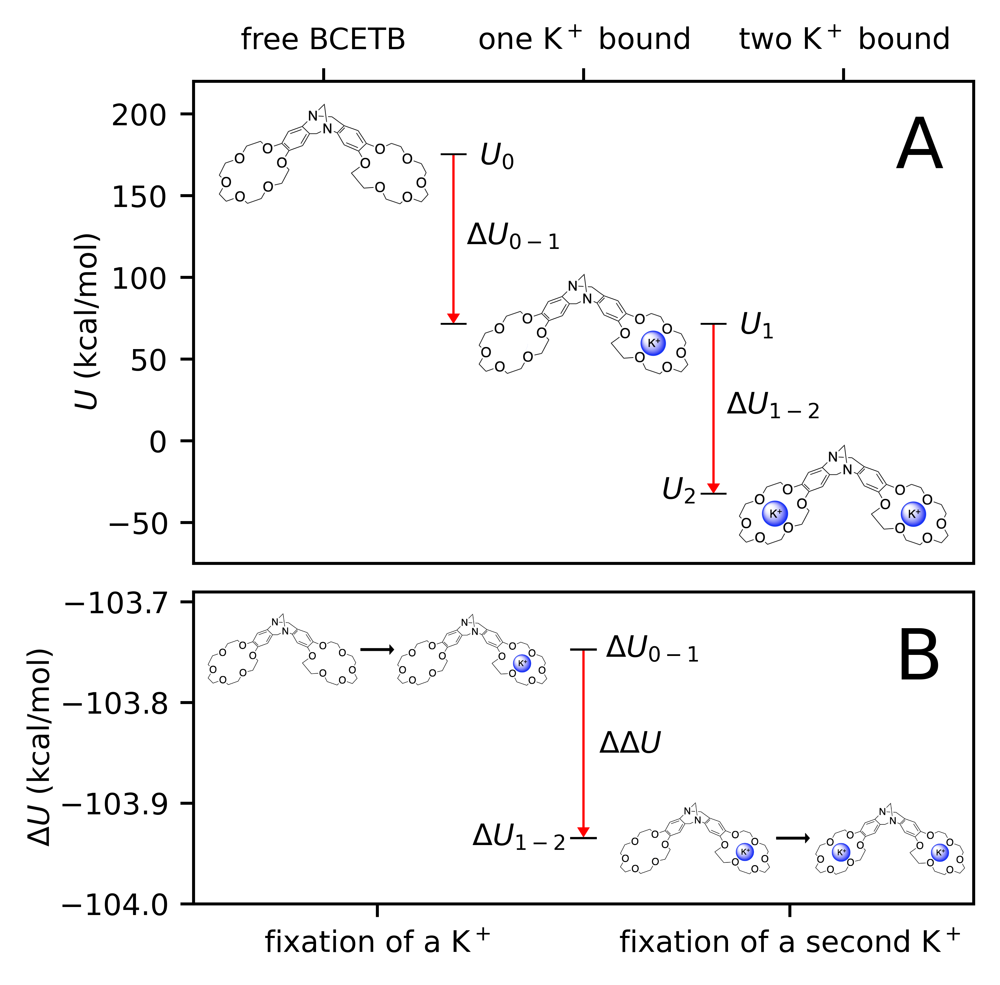

In [48]:
# Plotting mean potential energies of the complexes using DFT charges

plt.rcParams['figure.dpi']= 1000 # increasing resolution to yield higher quality of png's

# Setting up the plot
fig = plt.figure(figsize=(4,4))
ax0 = plt.subplot2grid((5, 1), (0, 0), rowspan=3)
ax1 = plt.subplot2grid((5, 1), (3, 0), rowspan=2)
complexes = ("free_BCETB", "K-BCETB", "K-BCETB-K")
x_tick_labels = ["free BCETB", "one K$^+$ bound", "two K$^+$ bound"]
x = [0,1,2]
ax0.set_xticks([0,1,2])
ax0.set_xticklabels(x_tick_labels, fontsize=8)
ax0.set_ylabel("$U$ (kcal/mol)", fontsize=8,labelpad=1)
ax0.set_yticks([-50, 0, 50, 100, 150, 200])
ax0.set_yticklabels(["$-$50", 0, 50, 100, 150, 200], fontsize=8)
ax0.set_xlim(-0.5,2.5)
ax0.set_ylim(-75,220)
ax0.xaxis.set_label_position("top")
ax0.xaxis.tick_top()
ax0.annotate("A", (2.2, 167), fontsize=19)
x_tick_labels = ["fixation of a K$^+$", "fixation of a second K$^+$"]
ax1.set_xticks([-0.85,2.85])
ax1.set_xticklabels(x_tick_labels, fontsize=8)
ax1.set_ylabel("$\Delta U$ (kcal/mol)", fontsize=8,labelpad=1)
ax1.set_yticks([-104.0, -103.9, -103.8, -103.7])
ax1.set_yticklabels(["$-$104.0", "$-$103.9", "$-$103.8", "$-$103.7"], fontsize=8)
ax1.set_xlim(-2.5,4.5)
ax1.set_ylim(-104.0,-103.69)
ax1.annotate("B", (3.79, -103.777), fontsize=19)

for i in range(len(complexes)):
    boundState = img.imread('figs/'+complexes[i]+'.png') # loading image of complex
    imagebox = OffsetImage(boundState, zoom=0.07)
    ab = AnnotationBbox(imagebox, (x[i], U_stats_dft[0][i]), frameon=False)
    ax0.add_artist(ab)
    if i == 0:
        imagebox = OffsetImage(boundState, zoom=0.05)
        ab = AnnotationBbox(imagebox, (x[i]-1.7, U_stats_dft[0][i+1]-U_stats_dft[0][i]), frameon=False)
        ax1.add_artist(ab)
        ax1.arrow(x[i]-1, U_stats_dft[0][i+1]-U_stats_dft[0][i], 0.3,0, length_includes_head=True, head_width=0.01, head_length=0.04, lw=0.1, width=0.0025, color='black')

    if i == 1:
        imagebox = OffsetImage(boundState, zoom=0.05)
        ab = AnnotationBbox(imagebox, (x[i-1], U_stats_dft[0][i]-U_stats_dft[0][i-1]), frameon=False)
        ax1.add_artist(ab)
        ab = AnnotationBbox(imagebox, (x[i+1], U_stats_dft[0][i+1]-U_stats_dft[0][i]), frameon=False)
        ax1.add_artist(ab)
    else:
        imagebox = OffsetImage(boundState, zoom=0.05)
        ab = AnnotationBbox(imagebox, (x[i]+1.75, U_stats_dft[0][i]-U_stats_dft[0][i-1]), frameon=False)
        ax1.add_artist(ab)
        ax1.arrow(x[i]+0.73, U_stats_dft[0][i]-U_stats_dft[0][i-1], 0.3,0, length_includes_head=True, head_width=0.01, head_length=0.04, lw=0.1, width=0.0025, color='black')

    if i < 2:
        ax0.hlines(U_stats_dft[0][i], (x[i+1]+x[i])/2-0.05, (x[i+1]+x[i])/2+0.05, lw=0.5)
        ax0.annotate("$U_"+str(i)+"$", ((x[i+1]+x[i])/2+0.1, U_stats_dft[0][i]-6), fontsize=8)
        ax0.annotate("$\Delta U_{"+str(i)+"-"+str(i+1)+"}$", ((x[i+1]+x[i])/2+0.05, (U_stats_dft[0][i]+U_stats_dft[0][i+1])/2-3), fontsize=8)


    if i == 1:
        ax0.hlines(U_stats_dft[0][i], (x[i]+x[i-1])/2-0.05, (x[i]+x[i-1])/2+0.05, lw=0.5)
        ax0.arrow((x[i]+x[i-1])/2, U_stats_dft[0][i-1], 0, -(U_stats_dft[0][i-1]-U_stats_dft[0][i]-0.8), length_includes_head=True, head_width=0.04, head_length=5, lw=0.4, width=0.003, color='red')
        ax0.arrow((x[i+1]+x[i])/2, U_stats_dft[0][i], 0, -(U_stats_dft[0][i]-U_stats_dft[0][i+1]-0.8), length_includes_head=True, head_width=0.04, head_length=5, lw=0.4, width=0.003, color='red')
        ax1.hlines(U_stats_dft[0][i]-U_stats_dft[0][i-1], x[i]-0.12, x[i]+0.12, lw=0.6)
        ax1.arrow(x[i], U_stats_dft[0][i]-U_stats_dft[0][i-1], 0, (U_stats_dft[0][i+1]-U_stats_dft[0][i])-(U_stats_dft[0][i]-U_stats_dft[0][i-1])+0.002, length_includes_head=True, head_width=0.09, head_length=0.008, lw=0.4, width=0.007, color='red')
        ax1.annotate("$\Delta U_{"+str(i-1)+"-"+str(i)+"}$", (x[i]+0.2, (U_stats_dft[0][i]-U_stats_dft[0][i-1])-0.007), fontsize=8)
        ax1.annotate("$\Delta U_{"+str(i)+"-"+str(i+1)+"}$", (x[i]-1, (U_stats_dft[0][i+1]-U_stats_dft[0][i])-0.007), fontsize=8)
        ax1.annotate("$\Delta \Delta U$", (x[i]+0.14, (U_stats_dft[0][i+1]-U_stats_dft[0][i])+0.085), fontsize=8)

    if i == 2:
        ax0.hlines(U_stats_dft[0][i], (x[i]+x[i-1])/2-0.05, (x[i]+x[i-1])/2+0.05, lw=0.5)
        ax0.annotate("$U_"+str(i) +"$", ((x[i]+x[i-1])/2-0.2, U_stats_dft[0][i]-3), fontsize=8)
        ax1.hlines(U_stats_dft[0][i]-U_stats_dft[0][i-1], x[i]-1.12, x[i]-0.88, lw=0.6)

U0 = ufloat(U_stats_dft[0][0], U_stats_dft[1][0])
U1 = ufloat(U_stats_dft[0][1], U_stats_dft[1][1])
U2 = ufloat(U_stats_dft[0][2], U_stats_dft[1][2])
dU01 = U1-U0
dU12 = U2-U1
ddU = dU12-dU01
#print("U0 = ", U0, " kcal/mol")
#print("U1 = ", U1, " kcal/mol")
#print("U2 = ", U2, " kcal/mol")
#print("dU(0-1) = ", dU01, " kcal/mol")
#print("dU(1-2) = ", dU12, " kcal/mol")
#print("ddU = ", ddU, " kcal/mol")

print("Figure 5")
plt.gcf().subplots_adjust(left=0.17)
plt.savefig("figs/complexEnergies_dft.pdf", bbox_to_inches='tight')

In [49]:
def conformationalEnergies(data, u, v, a, b, t_rot, nStates, nBlocks, nResamples, Us):
    '''Function returning potential energies of the different conformations, 
    and their standard errors
    
    Parameters
    ---------
    data : data returned by the PCA analysis on the pairwise distances
    u : x-coordinate around which the ellipse is centered
    v : y-coordinate around which the ellipse is centered
    a : radius of the first ellipse axis (x-axis) 
    b : radius of the second ellipse axis (y-axis)
    t_rot : rotation of the ellipse (rad)
    nStates : number of bound states (3: no K+ bound, one K+ bound, and two K+ bound)
    nBlocks : number of blocks to split the array of potential energies into when 
        calculating the standard error 
    nResamples : number of times to resample the block estimates (used for the 
        bootstrapping method to calculate the standard error)
    Us : array containing potential energies for all frames, 
        dimension = (nStates, number of frames) 
    
    Returns
    -------
    U : array of average block potential energies for all complexes and conformations,
        dimension = (nStates (3), number of conformations (5), number of blocks)
    p : array of average block probabilities for all complexes and conformations,
        dimension = (nStates (3), number of conformations (5), number of blocks)
    pU : array of average block measures of the product pU for all complexes and conformations,
        dimension = (nStates (3), number of conformations (5), number of blocks)
    U_tot : array of average block potential energies for the complexes,
        averaged over all conformations, dimension = (nStates, nBlocks)
    U_mean : array containing mean potential energies of the conformations ,
        dimension = (nStates, number of conformations)
    U_err : array containing standard errors of the conformational potential energies,
        dimension = (nStates, number of conformations)
    p_mean : array containing mean probabilities of the conformations ,
        dimension = (nStates, number of conformations)
    p_err : array containing standard errors of the conformational probabilities,
        dimension = (nStates, number of conformations) 
    pU_mean : array containing mean measures of the product pU for the conformations, 
        dimension = (nStates, number of conformations)
    pU_err : array containing standard errors of the conformational products pU,
        dimension = (nStates, number of conformations) 
    '''
    U = [[[],[],[],[],[]],[[],[],[],[],[]],[[],[],[],[],[]]]
    U_tot = np.zeros((nStates, nBlocks))
    p = [[[],[],[],[],[]],[[],[],[],[],[]],[[],[],[],[],[]]]
    pU = [[[],[],[],[],[]],[[],[],[],[],[]],[[],[],[],[],[]]]


    confs = ['sk2', 'ext', 'sk1', 'col', 'rest']
    n_frames = len(data[:,0][:])/nStates
    incr = n_frames/nBlocks
    p_new = np.zeros(nBlocks)
    U_new = np.zeros(nBlocks)
    pU_new = np.zeros(nBlocks)

    p_new_mean = np.zeros((nStates, len(confs), nResamples))
    U_new_mean = np.zeros((nStates, len(confs), nResamples))
    pU_new_mean = np.zeros((nStates, len(confs), nResamples))

    p_mean = np.zeros((nStates, len(confs)))
    U_mean = np.zeros((nStates, len(confs)))
    pU_mean = np.zeros((nStates, len(confs)))

    p_err = np.zeros((nStates, len(confs)))
    U_err = np.zeros((nStates, len(confs)))
    pU_err = np.zeros((nStates, len(confs)))
    for i in range(nStates):
        start = i*n_frames
        for ii in range(nBlocks):
            indices = [[],[],[],[],[]]
            for j in np.arange(int(start+ii*incr), int(start+(ii+1)*incr), 1):
    
                if (cos(t_rot[0])*(data[:,0][j]-u[0])+sin(t_rot[0])*(data[:,1][j]-v[0]))**2/(a[0]**2) + (sin(t_rot[0])*(data[:,0][j]-u[0])-cos(t_rot[0])*(data[:,1][j]-v[0]))**2/(b[0]**2) < 1:
                    indices[0].append(j)
                elif (cos(t_rot[1])*(data[:,0][j]-u[1])+sin(t_rot[1])*(data[:,1][j]-v[1]))**2/(a[1]**2) + (sin(t_rot[1])*(data[:,0][j]-u[1])-cos(t_rot[1])*(data[:,1][j]-v[1]))**2/(b[1]**2) < 1:
                    indices[1].append(j)
                elif (cos(t_rot[2])*(data[:,0][j]-u[2])+sin(t_rot[2])*(data[:,1][j]-v[2]))**2/(a[2]**2) + (sin(t_rot[2])*(data[:,0][j]-u[2])-cos(t_rot[2])*(data[:,1][j]-v[2]))**2/(b[2]**2) < 1:
                    indices[2].append(j)
                elif (cos(t_rot[3])*(data[:,0][j]-u[3])+sin(t_rot[3])*(data[:,1][j]-v[3]))**2/(a[3]**2) + (sin(t_rot[3])*(data[:,0][j]-u[3])-cos(t_rot[3])*(data[:,1][j]-v[3]))**2/(b[3]**2) < 1:
                    indices[3].append(j)
                else:
                    indices[4].append(j) # indices of conformations not in ANY of the four PCA minima (rest)
            U_tot[i,ii]=np.mean(Us[i][int(ii*incr):int((ii+1)*incr)])/4.184
            for jj in range(len(confs)):  
                p[i][jj].append(len(indices[jj])/(n_frames/nBlocks))
                u_temp = 0
                for k in range(len(indices[jj])):
                    u_temp += Us[i][indices[jj][k]-25001*i]/4.184 # Forming sum of energies for state i, conformation jj and block ii
                U[i][jj].append(u_temp/len(indices[jj]))        
                pU[i][jj].append(p[i][jj][ii]*U[i][jj][ii])
        for jj in range(len(confs)):
            for j in range(nResamples):

                p_new[:] = resample(p[i][jj], n_samples=nBlocks, replace=True)
                p_new_mean[i][jj][j] = np.mean(p_new[:])
                U_new[:] = resample(U[i][jj], n_samples=nBlocks, replace=True)
                U_new_mean[i][jj][j] = np.mean(U_new[:])
                pU_new[:] = resample(pU[i][jj], n_samples=nBlocks, replace=True)
                pU_new_mean[i][jj][j] = np.mean(pU_new[:])

            p_mean[i][jj] = np.mean(p_new_mean[i][jj])
            p_err[i][jj] = np.std(p_new_mean[i][jj])
            U_mean[i][jj] = np.mean(U_new_mean[i][jj])
            U_err[i][jj] = np.std(U_new_mean[i][jj])
            pU_mean[i][jj] = np.mean(pU_new_mean[i][jj])
            pU_err[i][jj] = np.std(pU_new_mean[i][jj])
                    
    return U, p, pU, U_tot, U_mean, U_err, p_mean, p_err, pU_mean, pU_err

In [50]:
def assignVariables(data, sk2, ext, sk1, col, nStates):
    '''Function returning potential energies of the complexes, averaged over all 
    conformations, and their standard errors
    
    Parameters
    ---------
    data : data returned by the PCA analysis on the pairwise distances
    sk2 : array containing properties of ellipse enclosing the "sk2" conformational 
        minima (u,v,a,b,t_rot)
    ext : array containing properties of ellipse enclosing the "ext" conformational 
        minima (u,v,a,b,t_rot)
    sk1 : array containing properties of ellipse enclosing the "sk1" conformational 
        minima (u,v,a,b,t_rot)
    col : array containing properties of ellipse enclosing the "col" conformational 
        minima (u,v,a,b,t_rot)
    nStates : number of bound states (3: no K+ bound, one K+ bound, and two K+ bound)
    
    Returns
    -------
    pU_sk2 : array containing mean measure and standard error of the product pU 
        for the "sk2" conformation
    pU_ext : array containing mean measure and standard error of the product pU 
        for the "ext" conformation
    pU_sk1 : array containing mean measure and standard error of the product pU 
        for the "sk1" conformation
    pU_col : array containing mean measure and standard error of the product pU 
        for the "col" conformation
    pU_res : array containing mean measure and standard error of the product pU 
        for the conformations not in ANY of the four PCA minima ("rest")
    ''' 
    nBlocks = 20
    nResamples = 100000
    stats = conformationalEnergies(data,[sk2[0],ext[0],sk1[0],col[0]],[sk2[1],ext[1],sk1[1],col[1]],[sk2[2],ext[2],sk1[2],col[2]],[sk2[3],ext[3],sk1[3],col[3]],[sk2[4],ext[4],sk1[4],col[4]],nStates,nBlocks,nResamples, Us) 
    pU = stats[2]
    pU_err = stats[9]
    pU_sk2 = []
    pU_ext = []
    pU_sk1 = []
    pU_col = []
    pU_res = []
    for i in range(nStates):
        pU_sk2.append(ufloat(np.mean(pU[i][0]), pU_err[i][0]))
        pU_ext.append(ufloat(np.mean(pU[i][1]), pU_err[i][1]))
        pU_sk1.append(ufloat(np.mean(pU[i][2]), pU_err[i][2]))
        pU_col.append(ufloat(np.mean(pU[i][3]), pU_err[i][3]))
        pU_res.append(ufloat(np.mean(pU[i][4]), pU_err[i][4]))
    
    return pU_sk2, pU_ext, pU_sk1, pU_col, pU_res

In [51]:
def plot_pU_conformations(pU_sk2, pU_ext, pU_sk1, pU_col, pU_res, ff):
    '''Function plotting measures of the product pU for all complexes and conformations, 
    
    Parameters
    ---------
    pU_sk2 : array containing mean measure and standard error of the product pU 
        for the "sk2" conformation
    pU_ext : array containing mean measure and standard error of the product pU 
        for the "ext" conformation
    pU_sk1 : array containing mean measure and standard error of the product pU 
        for the "sk1" conformation
    pU_col : array containing mean measure and standard error of the product pU 
        for the "col" conformation
    pU_res : array containing mean measure and standard error of the product pU 
        for the conformations not in ANY of the four PCA minima ("rest")
    ff : abbreviation of force field ('opl' or 'dft')
    ''' 
    
    plt.rcParams['figure.dpi']= 1000
    nLines = 100

    fig, axes = plt.subplots(4,1, figsize=(4,10))
    conf_names = ("SK2", "EXT", "SK1", "COL")
    x_tick_labels = ["free BCETB", "one K$^+$ bound", "two K$^+$ bound"]
    x = [0,1,2]
    
    pUs = [[pU_sk2[0].nominal_value, pU_ext[0].nominal_value, pU_sk1[0].nominal_value, pU_col[0].nominal_value],
           [pU_sk2[1].nominal_value, pU_ext[1].nominal_value, pU_sk1[1].nominal_value, pU_col[1].nominal_value],
           [pU_sk2[2].nominal_value, pU_ext[2].nominal_value, pU_sk1[2].nominal_value, pU_col[2].nominal_value]]
    
    dpUs = [[pU_sk2[1]-pU_sk2[0], pU_ext[1]-pU_ext[0], pU_sk1[1]-pU_sk1[0], pU_col[1]-pU_col[0], pU_res[1]-pU_res[0]],
            [pU_sk2[2]-pU_sk2[1], pU_ext[2]-pU_ext[1], pU_sk1[2]-pU_sk1[1], pU_col[2]-pU_col[1], pU_res[2]-pU_res[1]]]
    
    paths = [['no_K_bound/SK2.png', 'no_K_bound/EXT.png', 'no_K_bound/SK1.png', 'no_K_bound/COL.png'],
             ['1_K_bound/SK2.png', '1_K_bound/EXT.png', '1_K_bound/SK1.png', '1_K_bound/COL.png'],
             ['2_K_bound/SK2.png', '2_K_bound/EXT.png', '2_K_bound/SK1.png', '2_K_bound/COL.png']]
    zooms = [0.04, 0.045, 0.04, 0.033]
    head_lengths = [1.1, 1.2, 1.1, 0.8]
    arrowShifts=[0.1, 0.1, 0.1, 0.1]
    textShifts=[1.5, 1.5, 1.5, 1]
    incrs = 0.19485
    bottoms = [0.11+incrs*3, 0.11+incrs*2, 0.11+incrs, 0.11]
    
    
    for i in range(len(pUs)):
        for j in range(len(pUs[0])):
            boundState = img.imread('data/simulation/frames/'+paths[i][j])
            
            imagebox = OffsetImage(boundState, zoom=zooms[j])
            ab = AnnotationBbox(imagebox, (x[i], pUs[i][j]), frameon=False)
            axes[j].add_artist(ab)
            axes[j].set_xticks([0,1,2])
            axes[j].set_xticklabels(x_tick_labels, fontsize=8)
            axes[j].set_ylabel("$p_{\mathrm{"+conf_names[j]+"}}U_{\mathrm{"+conf_names[j]+"}}$ (kcal/mol)", fontsize=8,labelpad=1)
            axes[j].set_yticks([-30, -15, 0, 15, 30, 45, 60])
            axes[j].set_yticklabels(["$-$30", "$-$15", 0, 15, 30, 45, 60], fontsize=8)
            axes[j].set_xlim(-0.5,2.5)
            axes[j].set_ylim(np.min(pUs)-12,np.max(pUs)+8)
            if j == 0:
                axes[j].xaxis.set_label_position("top")
                axes[j].xaxis.tick_top()
            elif j == 3:
                axes[j].xaxis.set_label_position("bottom")
                axes[j].xaxis.tick_bottom()
            
            else:
                axes[j].set_xticks([])
            if i < 2:
                axes[j].hlines(pUs[i][j], (x[i+1]+x[i])/2-0.05, (x[i+1]+x[i])/2+0.05, lw=0.5)
                if conf_names[j] is "COL" and i == 0 :
                    if ff == 'opls-aa':
                        axes[j].arrow((x[i+1]+x[i])/2+0.1, (pUs[i][j]+pUs[i+1][j])/2-textShifts[j]+3, 0.87, 0, linestyle=(5, (5,7)), length_includes_head=True, linewidth=0.4, color='black')
                        axes[j].arrow((x[i+1]+x[i])/2+0.97, (pUs[i][j]+pUs[i+1][j])/2-textShifts[j]+3, 0.03, 0, length_includes_head=True, head_width=1.1, head_length=0.03, linewidth=0.4, color='black')
                    else:
                        axes[j].arrow((x[i+1]+x[i])/2+0.1, (pUs[i][j]+pUs[i+1][j])/2-textShifts[j]+1, 0.87, 0, linestyle=(5, (5,7)), length_includes_head=True, linewidth=0.4, color='black')
                        axes[j].arrow((x[i+1]+x[i])/2+0.97, (pUs[i][j]+pUs[i+1][j])/2-textShifts[j]+1, 0.03, 0, length_includes_head=True, head_width=1.1, head_length=0.03, linewidth=0.4, color='black')
                    axes[j].annotate("$\Delta (p_{\mathrm{"+conf_names[j]+"}}U_{\mathrm{"+conf_names[j]+"}})_{"+str(i)+"-"+str(i+1)+"}$", ((x[i+1]+x[i])/2+1.043, (pUs[i][j]+pUs[i+1][j])/2-textShifts[j]), fontsize=8)
                else:
                    if ff == 'opls-aa': # shift annotation to not overlap with conformation image
                        axes[j].annotate("$\Delta (p_{\mathrm{"+conf_names[j]+"}}U_{\mathrm{"+conf_names[j]+"}})_{"+str(i)+"-"+str(i+1)+"}$", ((x[i+1]+x[i])/2+0.05, (pUs[i][j]+pUs[i+1][j])/2), fontsize=8)
                    else:
                        axes[j].annotate("$\Delta (p_{\mathrm{"+conf_names[j]+"}}U_{\mathrm{"+conf_names[j]+"}})_{"+str(i)+"-"+str(i+1)+"}$", ((x[i+1]+x[i])/2+0.05, (pUs[i][j]+pUs[i+1][j])/2-textShifts[j]), fontsize=8)
                    
        
            if i == 1:
                if ff == 'opls-aa':
                    axes[j].annotate("("+conf_names[j]+")", (2,28), fontsize=10) 
                else:
                    axes[j].annotate("("+conf_names[j]+")", (2,51), fontsize=10) 
                axes[j].hlines(pUs[i][j], (x[i]+x[i-1])/2-0.05, (x[i]+x[i-1])/2+0.05, lw=0.5)
                axes[j].arrow((x[i]+x[i-1])/2, pUs[i-1][j], 0, -(pUs[i-1][j]-pUs[i][j]-arrowShifts[j]), length_includes_head=True, head_width=0.04, head_length=head_lengths[j], lw=0.4, width=0.003, color='red')
                axes[j].arrow((x[i+1]+x[i])/2, pUs[i][j], 0, -(pUs[i][j]-pUs[i+1][j]-arrowShifts[j]), length_includes_head=True, head_width=0.04, head_length=head_lengths[j], lw=0.4, width=0.003, color='red')
        
            if i == 2:
                axes[j].hlines(pUs[i][j], (x[i]+x[i-1])/2-0.05, (x[i]+x[i-1])/2+0.05, lw=0.5)

    conf_names = ("SK2", "EXT", "SK1", "COL", "rest")  
    for i in range(len(dpUs)):
        for j in range(len(dpUs[0])):
            print("dpU("+conf_names[j]+", "+str(i)+"-"+str(i+1)+") = ", np.round(dpUs[i][j].nominal_value,2), " +- ", np.round(dpUs[i][j].std_dev,2), " kcal/mol")
    
    plt.subplots_adjust(hspace=0.05)
    plt.gcf().subplots_adjust(left=0.17)
    plt.savefig("figs/conformationEnergies_"+ff+".pdf", bbox_to_inches='tight')

In [52]:
def plot_sum_pU_conformations(pU_sk2, pU_ext, pU_sk1, pU_col, pU_res, ff):
    '''Function plotting sum of measures of the difference in the change in pU 
    for the first and second binding (ddpU = dpU_2 - dpU_1). The measures are for
    each conformation, and the sum equals the property ddU which is the difference in
    the potential energy change upon binding of the first and second potassium ion
    (ddU = dU_2 - dU_1).
    
    Parameters
    ---------
    pU_sk2 : array containing mean measure and standard error of the product pU 
        for the "sk2" conformation
    pU_ext : array containing mean measure and standard error of the product pU 
        for the "ext" conformation
    pU_sk1 : array containing mean measure and standard error of the product pU 
        for the "sk1" conformation
    pU_col : array containing mean measure and standard error of the product pU 
        for the "col" conformation
    pU_res : array containing mean measure and standard error of the product pU 
        for the conformations not in ANY of the four PCA minima ("rest")
    ff : abbreviation of force field ('opl' or 'dft')
    ''' 
    fig = plt.figure(figsize=(4,2))
    conf_names = ["SK2", "EXT", "SK1", "COL", "rest"]
    ax0 = plt.subplot2grid((3, 4), (0, 0), rowspan=1, colspan=3)
    ax1 = plt.subplot2grid((3, 4), (1, 0), rowspan=2, colspan=3)
    ax2 = plt.subplot2grid((1, 4), (0, 3), colspan=1)
    x = np.arange(0,5,1)
    # hide the spines between ax and ax2
    ax0.spines['bottom'].set_visible(False)
    ax1.spines['top'].set_visible(False)
    ax0.xaxis.tick_top()
    ax0.tick_params(labeltop=False)  # don't put tick labels at the top
    ax0.set_xlim(x[0]-0.4, x[-1]+0.4)
    ax1.set_xlim(x[0]-0.4, x[-1]+0.4)
    ax0.set_xticklabels(conf_names)
    ax1.set_xticklabels(conf_names)
    ax0.set_xticks([0,1,2,3,4])
    ax1.set_xticks([0,1,2,3,4])
    ax2.set_xticks([0])
    ax2.set_xticklabels(['all'])
    ax2.set_xlim(-0.7, 0.7)
    ax2.yaxis.set_label_position("right")
    ax2.yaxis.tick_right()
    if ff == 'dft':
        ax0.set_ylim(14.3, 15.0)
        ax0.set_yticks([14.5,15.0])
        ax1.set_ylim(-0.95,0.65)
        ax1.set_yticks([-0.5, 0.0, 0.5])
        ax1.hlines(0,-1,5, color='gray', lw=0.8, alpha=0.5)
        ax2.set_ylim(-0.94, 1.5)
        arrowShifts = [-0.01, -0.02, -0.01, +0.02, -0.01]
        color = ['green', 'green', 'green', 'red', 'green']
        ax0.annotate("A", (3.7, 14.55), fontsize=19)
        ax2.annotate("B", (0.08, 1.045), fontsize=19)

    else:
        ax0.set_ylim(-0.7, 0.5)
        ax0.set_yticks([-0.5, 0, 0.5])
        ax0.hlines(0,-1,5, color='gray', lw=0.8, alpha=0.5)
        ax1.set_ylim(-4.8,-2.01)
        ax1.set_yticks([-4.5, -4, -3.5, -3.0, -2.5])
        ax2.set_ylim(-3.6, 0.5)
        ax2.set_yticks([-3.5, -3, -2.5, -2, -1.5, -1, -0.5, 0, 0.5])
        arrowShifts = [+0.03, -0.02, -0.02, +0.03, -0.02]
        color = ['red', 'green', 'green', 'red', 'green']
        ax1.annotate("A", (-0.15, -4.6), fontsize=19)
        ax2.annotate("B", (-0.5, -3.4), fontsize=19)
    d = .015  # how big to make the diagonal lines in axes coordinates
    # arguments to pass to plot, just so we don't keep repeating them
    kwargs = dict(transform=ax0.transAxes, color='k', clip_on=False)
    ax0.plot((-d, +d), (-d-0.03, +d), **kwargs)        # top-left diagonal
    ax0.plot((1 - d, 1 + d), (-d-0.03, +d), **kwargs)  # top-right diagonal
    
    kwargs.update(transform=ax1.transAxes)  # switch to the bottom axes
    ax1.plot((-d, +d), (1 - d, 1 + d), **kwargs)  # bottom-left diagonal
    ax1.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)  # bottom-right diagonal
    ddpUs = [(pU_sk2[2]-pU_sk2[1])-(pU_sk2[1]-pU_sk2[0]),
             (pU_ext[2]-pU_ext[1])-(pU_ext[1]-pU_ext[0]),
             (pU_sk1[2]-pU_sk1[1])-(pU_sk1[1]-pU_sk1[0]),
             (pU_col[2]-pU_col[1])-(pU_col[1]-pU_col[0]), 
             (pU_res[2]-pU_res[1])-(pU_res[1]-pU_res[0])]
    
    for i in range(len(ddpUs)):
        #print(x[i], ddpUs[i].nominal_value)
        ddpU = 0
        for j in range(i):
            ddpU += ddpUs[j].nominal_value
        ax0.arrow(x[i], ddpU, 0, ddpUs[i].nominal_value+arrowShifts[i], length_includes_head=True, head_width=0.07, head_length=0.04, lw=0.7*np.abs(ddpUs[i].nominal_value)**(1/6)/1, width=0.003, color=color[i]) # lw=0.8*np.abs(ddpUs[i].nominal_value)**(1/6)/1
        ax0.hlines(ddpU+ddpUs[i].nominal_value, x[i]-0.1, x[i]+0.1, lw=0.6)
        ax0.hlines(ddpU+ddpUs[i].nominal_value, x[i]+0.2, x[i]+0.8, lw=0.6, linestyle='dashed')
    
        print("ddpU("+conf_names[i]+") = ", np.round(ddpUs[i].nominal_value,2), " +- ", np.round(ddpUs[i].std_dev(),2), " kcal/mol")
        ax1.arrow(x[i], ddpU, 0, ddpUs[i].nominal_value+arrowShifts[i], length_includes_head=True, head_width=0.07, head_length=0.04, lw=0.7*np.abs(ddpUs[i].nominal_value)**(1/6)/1, width=0.003, color=color[i])
        ax1.hlines(ddpU+ddpUs[i].nominal_value, x[i]-0.1, x[i]+0.1, lw=0.6)
        ax1.hlines(ddpU+ddpUs[i].nominal_value, x[i]+0.2, x[i]+0.8, lw=0.6, linestyle='dashed')
    
    ax2.arrow(0, 0, 0, np.sum(ddpUs).nominal_value, length_includes_head=True, head_width=0.07, head_length=0.04, lw=0.7*np.abs(ddpUs[i].nominal_value)**(1/6)/1, width=0.003, color='red')
    ax2.hlines(ddpU+ddpUs[i].nominal_value, -0.1, 0.1, lw=0.6)
    ax2.hlines(ddpU+ddpUs[i].nominal_value, -0.7, -0.2, lw=0.6, linestyle='dashed')
    ax2.hlines(0,-1,5, color='gray', lw=0.8, alpha=0.5)
    ax1.set_ylabel('$\sum_j\Delta \Delta (p_jU_j)$ (kcal/mol)')
    ax2.set_ylabel('$\Delta \Delta U$ (kcal/mol)')
    ax1.yaxis.set_label_coords(-0.2, 0.85)
    
    print("ddpU(tot) = ", np.round(np.sum(ddpUs).nominal_value,2), " kcal/mol \n")
    print("Figure 6 & 7")
    
    plt.gcf().subplots_adjust(left=0.2, right=0.84)
    plt.savefig("figs/ddU_decomposition_"+ff+".pdf", bbox_to_inches='tight')

dpU(SK2, 0-1) =  -25.33  +-  4.0  kcal/mol
dpU(EXT, 0-1) =  -37.48  +-  3.18  kcal/mol
dpU(SK1, 0-1) =  -25.42  +-  4.96  kcal/mol
dpU(COL, 0-1) =  -6.75  +-  1.9  kcal/mol
dpU(rest, 0-1) =  -8.78  +-  0.83  kcal/mol
dpU(SK2, 1-2) =  -24.93  +-  1.34  kcal/mol
dpU(EXT, 1-2) =  -23.37  +-  1.26  kcal/mol
dpU(SK1, 1-2) =  -25.09  +-  1.49  kcal/mol
dpU(COL, 1-2) =  -21.81  +-  1.12  kcal/mol
dpU(rest, 1-2) =  -8.73  +-  0.34  kcal/mol
ddpU(SK2) =  0.4  +-  4.54  kcal/mol
ddpU(EXT) =  14.11  +-  3.8  kcal/mol
ddpU(SK1) =  0.33  +-  5.55  kcal/mol
ddpU(COL) =  -15.07  +-  2.63  kcal/mol
ddpU(rest) =  0.05  +-  0.99  kcal/mol
ddpU(tot) =  -0.19  kcal/mol 

Figure 6 & 7


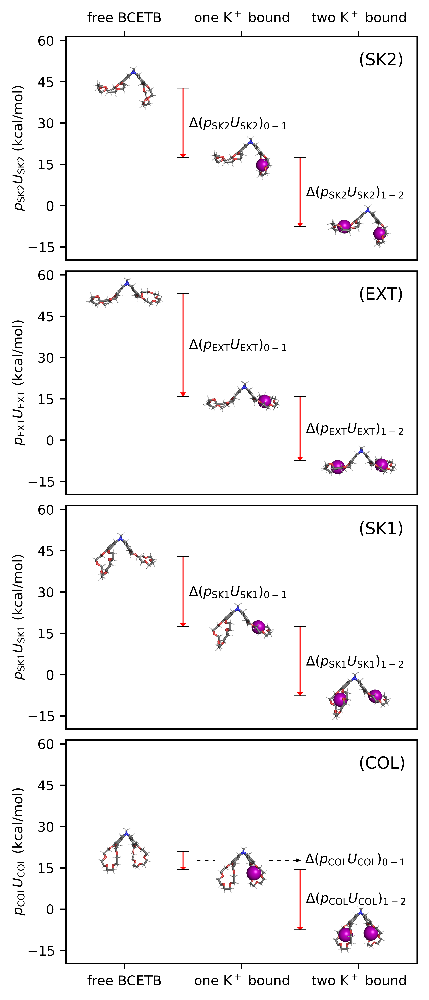

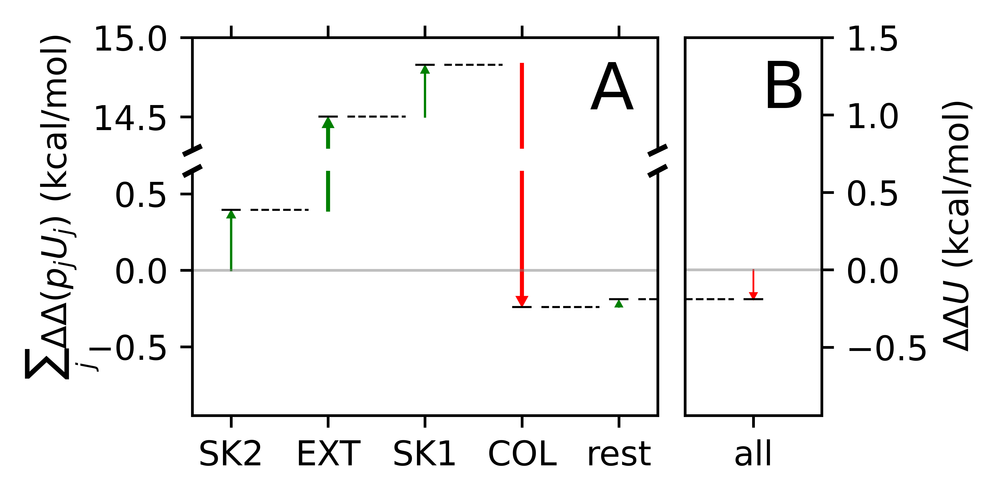

In [53]:
sk2 = [0.2,1.58,2.7,0.95,0.2] # properties of the ellipse for "sk2" conformation (u,v,a,b,t_rot)
ext = [-2.9,0.00,2.6,0.60,0] # properties of the ellipse for "ext" conformation (u,v,a,b,t_rot)
sk1 = [0.2,-1.58,2.7,0.95,-0.2] # properties of the ellipse for "sk1" conformation (u,v,a,b,t_rot)
col = [3,0.0,2.5,1.15,0] # properties of the ellipse for "col" conformation (u,v,a,b,t_rot)
Us = [dft_U_0, dft_U_1, dft_U_2] # array of potential energies for the complexes using DFT charges
nStates = 3
pUs = assignVariables(full_reduced_dft, sk2, ext, sk1, col, nStates)
pU_sk2 = pUs[0]
pU_ext = pUs[1]
pU_sk1 = pUs[2]
pU_col = pUs[3]
pU_res = pUs[4]
plot_pU_conformations(pU_sk2, pU_ext, pU_sk1, pU_col, pU_res, 'dft')
plot_sum_pU_conformations(pU_sk2, pU_ext, pU_sk1, pU_col, pU_res, 'dft')

### d) Dielectric response
Here we analyse the orientation of clusters of water molecules close to the binding sites. Specifically, we calculate the angle, $\theta_{\mu_1,\mu_2}$, between the dipoles of the water clusters, $\mu_1$ and $\mu_2$, one cluster at each binding sites, defined as the $N$ closest water molecules. We choose $N$ to be 4,8, or 12 water molecules.
\begin{equation}
\theta_{\mu_1,\mu_2} = \arccos \left(\frac{\mu_1 \cdot \mu_2}{||\mu_1||~||\mu_1||}\right)
\end{equation}

In [54]:
def angleHist(trajFile, topFile, n_water, inds, pdbFiles, dcdFiles, path):
    '''Function returning the angles between clusters of water molecules,
    one cluster around each binding site defined by the n_water closest water
    molecules
    
    Parameters
    ---------
    trajFile : name of original trajectory (not needed here since the original 
        trajectories are not uploaded, so any string will do)
    topFile: name of original topology (not needed here since the original 
        topologies are not uploaded, so any string will do)
    n_water : number of water molecules in each cluster
    inds : array containing the indices of the potassium ions bound. Note: in the 
        case with no K bound to the binding site, dummy atoms are used. 
    pdbFiles : array containing names of topology (pdb) files containing the closest 
        water around each binding site 
    dcdFiles : array containing names of trajectory (dcd) files containing the closest 
        water around each binding site
    path : path to where the pdb and dcd files are located (string)
    
    Returns
    -------
    cosAngle : cosinus of the angle between the the dipoles of the two clusters, 
        one cluster around each binding site
    angle : angle between the the dipoles of the two clusters, one cluster around 
        each binding site
    '''
    # Defining charges on solvent (SPC/E) 
    charges = []
    for i in range(n_water):
        charges.append(-0.8476)
        charges.append(0.4238)
        charges.append(0.4238)  
    
    # The following out-commented lines were used when the trajectories with water 
    # were analysed to create the smaller trajectories with only the closest water 
    #traj = pt.iterload(path+trajFile, path+topFile)
    #n_frames = traj.n_frames
    n_frames = 25001
    dipArray = np.zeros((n_frames, 6))
    cosAngle = np.zeros(n_frames)
    angle = np.zeros(n_frames)

    # Loading traj, stripping it to only contain n_water closest waters, and saving it as new traj
    for i in range(len(inds)):
        if not os.path.isfile(path+str(dcdFiles[i])):
            
            # The following out-commented block was used when the trajectories with water was
            # analysed to create the smaller trajectories with only the closest water 
            #print("Creating new trajectory with "+str(n_water)+" closest water molecules")
            #newTraj = pt.closest(traj, mask = ':'+str(inds[i]), dtype = 'trajectory', n_solvents=n_water)
            #waterTraj = newTraj[':6-'+str(5+n_water)]
            #pt.write_traj(path+str(pdbFiles[i]), waterTraj, frame_indices=[0], overwrite=True) 
            #pt.write_traj(path+str(dcdFiles[i]), waterTraj, overwrite=True)
            print("Trajectory not uploaded to github due to space limit, choose number of water molecules matching the small trajectories accessible (4, 8, or 12).")
            break
        # Loading new traj
        waterTraj = md.load_dcd(path+str(dcdFiles[i]), top=path+str(pdbFiles[i]))
    
        dipArray[:,i*3:i*3+3] = md.dipole_moments(waterTraj, charges=charges)
    
    for i in range(n_frames):
        cosAngle[i] = np.dot(dipArray[i,0:3], dipArray[i,3:6])/(np.linalg.norm(dipArray[i,0:3])*np.linalg.norm(dipArray[i,3:6]))
        angle[i] = np.arccos(cosAngle[i])/np.pi*180


    return cosAngle, angle

In [55]:
def angleErrors(angles, n_blocks, n_bins, n_resamples):
    '''Function returning the standard error of the angles between clusters of water 
    molecules, one cluster around each binding site defined by the n_water closest 
    water molecules
    
    Parameters
    ---------
    angles : array containing angles between clusters of water molecules, one per 
        trajectory frame
    n_blocks : number of blocks to split the array of angles into
    n_bins : number of bins used when histogramming the angles
    nResamples : number of times to resample the block estimates (used for the 
        bootstrapping method to calculate the standard error)
    
    Returns
    -------
    angles_err : standard error of the angle between the the dipoles of the two 
        clusters, one cluster around each binding site
    '''
    n_blocks = n_blocks
    n_frames = len(angles)
    n_bins = n_bins
    n_resamples = n_resamples
    hist = np.zeros((n_blocks, n_bins))
    angles_new = np.zeros((n_blocks, n_bins, n_resamples))
    angles_new_mean = np.zeros((n_bins,n_resamples))
    angles_mean = np.zeros((n_bins))
    angles_err = np.zeros((n_bins))

    for i in range(n_blocks):
        incr = int(n_frames/n_blocks)
        hist[i,:]=np.histogram(angles[i*incr:incr*(i+1)], bins=n_bins, density=True)[0]

    for j in range(n_bins):
        for k in range(n_resamples):
            angles_new[:,j,k] = resample(hist[:,j], n_samples=n_blocks, replace=True)
            angles_new_mean[j,k] = np.mean(angles_new[:,j,k])
        angles_mean[j] = np.mean(angles_new_mean[j,:])
        angles_err[j] = np.std(angles_new_mean[j,:])
    return angles_err

In [56]:
def plotAngleHistogram(states, sites, inds, n_water, nBins, nBlocks, nResamples, paths, numCols):
    '''Function plotting histogram of angles the  between clusters of water 
    molecules, and their standard errors
    
    Parameters
    ---------
    states : array containing indices of the bound states (0: no K+ bound, 
    1: 1 K+ bound, 2: 2 K+ bound)
    sites : array containing indices of binding sites (1: "left" binding site,
    2: "right" binding site)
    inds : array containing indices of the potassium ions bound to the binding sites 
    n_water : number of water molecules in each cluster
    nBins : number of bins used when histogramming the angles
    nBlocks : number of blocks to split the array of angles into when calculating 
        the standard error 
    nResamples : number of times to resample the block estimates (used for the 
        bootstrapping method to calculate the standard error)
    paths : array containing string of paths to directories holding the 
        topology and trajectory (pdb and dcd) files of the closest water molecules
    numCols : number of columns of plots 
    '''
    plt.style.use('default')
    j = 0
    markers = ['o', 'v', 's']
    labels = ['A', 'B', 'C', 'D', 'E', 'F']
    legendLabels = ['free BCETB', 'one K$^+$ bound', 'two K$^+$ bound']
    fig, axes = plt.subplots(int(math.ceil(len(paths)*len(n_water)/numCols)),numCols, figsize = (4,4.2))
    for h in range(len(paths)):    
        for i in range(len(n_water)):
            for k in range(len(states)):

                angle = angleHist("traj_"+str(states[k])+".nc", "top_"+str(states[k])+".pdb", n_water[i], inds, ["water_"+str(states[k])+"_"+str(sites[0])+"_"+str(n_water[i])+".pdb", "water_"+str(states[k])+"_"+str(sites[1])+"_"+str(n_water[i])+".pdb"], ["water_"+str(states[k])+"_"+str(sites[0])+"_"+str(n_water[i])+".dcd", "water_"+str(states[k])+"_"+str(sites[1])+"_"+str(n_water[i])+".dcd"], paths[h])

                if len(paths)*len(n_water) > numCols and numCols > 1:    
                    y_err = angleErrors(angle[1], n_blocks = nBlocks, n_bins = nBins, n_resamples = nResamples)
                    data = np.histogram(angle[1], bins=nBins, density=True)
                    y = data[0]
                    binEdges = data[1]
                    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
                    if k == 0:
                        label = 'no K$^+$ bound'
                    else:
                        label = str(states[k])+' K$^+$ bound'
                    axes[h,i-h*numCols].errorbar(bincenters, y, yerr = y_err, marker=markers[k], color=colors[k+1], alpha=0.6, label=legendLabels[k])
                    axes[h,i-h*numCols].fill_between(bincenters, y-y_err, y+y_err, color=colors[k+1], alpha=0.5)
                    axes[h,i-h*numCols].plot(bincenters, y, color=colors[k+1], alpha=0.6)
                    ax = axes[h,i-h*numCols]
                    
                elif len(paths)*len(n_water) > numCols:    
                    y_err = angleErrors(angle[1], n_blocks = nBlocks, n_bins = nBins, n_resamples = nResamples)
                    data = np.histogram(angle[1], bins=nBins, density=True)
                    y = data[0]
                    binEdges = data[1]
                    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
                    axes[j].errorbar(bincenters, y, yerr = y_err, marker=markers[k], capsize=3, color=colors[k+1], alpha=0.6, label=legendLabels[k])
                    axes[j].fill_between(bincenters, y-y_err, y+y_err, color=colors[k+1], alpha=0.5)
                    axes[j].plot(bincenters, y, color=colors[k+1], alpha=0.6)
                    ax = axes[j]
                    
                elif len(n_water) > 1:
                    y_err = angleErrors(angle[1], n_blocks = nBlocks, n_bins = nBins, n_resamples = nResamples)
                    data = np.histogram(angle[1], bins=nBins, density=True)
                    y = data[0]
                    binEdges = data[1]
                    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
                    axes[i].errorbar(bincenters, y, yerr = y_err, marker=markers[k], capsize=3, color=colors[k+1], alpha=0.6, label=legendLabels[k])
                    axes[i].fill_between(bincenters, y-y_err, y+y_err, color=colors[k+1], alpha=0.5)
                    axes[i].plot(bincenters, y, color=colors[k+1], alpha=0.6)
                    ax = axes[i]  
                else:
                    
                    y_err = angleErrors(angle[1], n_blocks = nBlocks, n_bins = nBins, n_resamples = nResamples)
                    data = np.histogram(angle[1], bins=nBins, density=True)
                    y = data[0]
                    binEdges = data[1]
                    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
                    axes.errorbar(bincenters, y, yerr = y_err, marker=markers[k], capsize=3, color=colors[k+1], alpha=0.6, label=legendLabels[k])
                    axes.fill_between(bincenters, y-y_err, y+y_err, color=colors[k+1], alpha=0.5)
                    axes.plot(bincenters, y, color=colors[k+1], alpha=0.6)
                    ax = axes
                print("Mean angle, "+str(k)+" K+ bound = ", np.mean(angle[1]))
            if i+1 == len(n_water):
                j += 1 
            
            if len(paths) > 1:
                ax.annotate(labels[h*len(n_water)+i], (220,0.0007), fontsize=25)
            ax.annotate("$N_{\mathrm{H_2O}}$ = "+str(n_water[i]), (3, 0.0090))
            ax.set_xlim(-10,190)
            ax.set_ylim(0.0010, 0.0100)
            ax.set_xticks([0,30,60,90,120,150,180])
            if h == 0:
                ax.xaxis.set_label_position("top")
                ax.xaxis.tick_top()
                ax.set_xlabel(r"$\Theta_{\mu_1 -\mu_2}$ (deg)")
                ax.legend(frameon=False, bbox_to_anchor=(-0.02, 1., 1, 0), ncol=2, handletextpad=0.3, columnspacing=0.8)
            if h == 1:
                ax.set_xlabel(r"$\Theta_{\mu_1 -\mu_2} (deg)$")
            if i == numCols-1:
                ax.yaxis.set_label_position("right")
                ax.yaxis.tick_right()
                ax.set_yticks([0.002,0.004,0.006,0.008,0.010])
                ax.set_yticklabels([2,4,6,8,10])
                ax.set_ylabel(r"$\rho ( \Theta_{\mu_1 -\mu_2} )\cdot10^3$ (deg$^{-1}$)", labelpad=-1)
            if i == 0:
                ax.yaxis.set_label_position("left")
                ax.yaxis.tick_left()
                ax.set_yticks([0.002,0.004,0.006,0.008,0.010])
                ax.set_yticklabels([2,4,6,8,10])
                ax.set_ylabel(r"$\rho ( \Theta_{\mu_1 -\mu_2} )\cdot10^3$ (deg$^{-1}$)", labelpad=-1)
            if 0 < i < len(n_water):
                ax.set_yticks([])
            if (0 < j < len(n_water)/numCols-1): 
                ax.set_xticks([])
            if len(paths) == 1:
                ax.xaxis.set_label_position("bottom")
                ax.xaxis.tick_bottom()
                ax.set_xlabel(r"$\Theta_{\mu_1 -\mu_2}$ (deg)")
    print("\n Figure 8")
    plt.tight_layout()
    plt.savefig("figs/angleHistogram_DFT.pdf", bbox_to_inches='tight')

Mean angle, 0 K+ bound =  95.95097361053219
Mean angle, 1 K+ bound =  89.05718429715941
Mean angle, 2 K+ bound =  90.06041454288427

 Figure 8


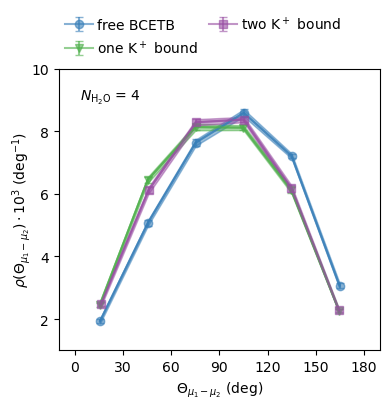

In [57]:
plotAngleHistogram([0,1,2], [1,2], [2,4], np.arange(4,5,2), 6, 20, 100, ["data/simulation/trajectories/ff_dft/kcl/closest_water/"], 1)

In [58]:
def plotAngleHistograms(states, sites, inds, n_water, nBins, nBlocks, nResamples, paths, numCols):
    '''Function plotting histograms of angles the  between clusters of water 
    molecules, and their standard errors
    
    Parameters
    ---------
    states : array containing indices of the bound states (0: no K+ bound, 
    1: 1 K+ bound, 2: 2 K+ bound)
    sites : array containing indices of binding sites (1: "left" binding site,
    2: "right" binding site)
    inds : array containing indices of the potassium ions bound to the binding sites 
    n_water : number of water molecules in each cluster
    nBins : number of bins used when histogramming the angles
    nBlocks : number of blocks to split the array of angles into when calculating 
        the standard error 
    nResamples : number of times to resample the block estimates (used for the 
        bootstrapping method to calculate the standard error)
    paths : array containing string of paths to directories holding the 
        topology and trajectory (pdb and dcd) files of the closest water molecules
    numCols : number of columns of plots 
    '''
    plt.style.use('default')
    j = 0
    markers = ['o', 'v', 's']
    legendLabels = ['free BCETB', 'one K$^+$ bound', 'two K$^+$ bound']
    labels = ['A', 'B', 'C', 'D', 'E', 'F']
    fig, axes = plt.subplots(int(math.ceil(len(paths)*len(n_water)/numCols)),numCols, figsize = (numCols*4.5,int(math.ceil(len(n_water)*len(paths)/numCols)*4.5)))
    for h in range(len(paths)):    
        for i in range(len(n_water)):
            for k in range(len(states)):

                if i/numCols >= j+1:
                    j += 1 
                angle = angleHist("traj_"+str(states[k])+".nc", "top_"+str(states[k])+".pdb", n_water[i], inds, ["water_"+str(states[k])+"_"+str(sites[0])+"_"+str(n_water[i])+".pdb", "water_"+str(states[k])+"_"+str(sites[1])+"_"+str(n_water[i])+".pdb"], ["water_"+str(states[k])+"_"+str(sites[0])+"_"+str(n_water[i])+".dcd", "water_"+str(states[k])+"_"+str(sites[1])+"_"+str(n_water[i])+".dcd"], paths[h])

                if len(paths)*len(n_water) > numCols and numCols > 1:    
                    y_err = angleErrors(angle[1], n_blocks = nBlocks, n_bins = nBins, n_resamples = nResamples)
                    data = np.histogram(angle[1], bins=nBins, density=True)
                    y = data[0]
                    binEdges = data[1]
                    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
                    axes[h,i-h*numCols].errorbar(bincenters, y, yerr = y_err, marker=markers[k], capsize=3, color=colors[k+1], alpha=0.6, label=legendLabels[k])
                    axes[h,i-h*numCols].fill_between(bincenters, y-y_err, y+y_err, color=colors[k+1], alpha=0.5)
                    axes[h,i-h*numCols].plot(bincenters, y, color=colors[k+1], alpha=0.6)
                    ax = axes[h,i-h*numCols]
                    
                elif len(paths)*len(n_water) > numCols:    
                    y_err = angleErrors(angle[1], n_blocks = nBlocks, n_bins = nBins, n_resamples = nResamples)
                    data = np.histogram(angle[1], bins=nBins, density=True)
                    y = data[0]
                    binEdges = data[1]
                    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
                    axes[j].errorbar(bincenters, y, yerr = y_err, marker=markers[k], capsize=3, color=colors[k+1], alpha=0.6, label=legendLabels[k])
                    axes[j].fill_between(bincenters, y-y_err, y+y_err, color=colors[k+1], alpha=0.5)
                    axes[j].plot(bincenters, y, color=colors[k+1], alpha=0.6)
                    ax = axes[j]
                    
                elif len(n_water) > 1:
                    y_err = angleErrors(angle[1], n_blocks = nBlocks, n_bins = nBins, n_resamples = nResamples)
                    data = np.histogram(angle[1], bins=nBins, density=True)
                    y = data[0]
                    binEdges = data[1]
                    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
                    axes[i].errorbar(bincenters, y, yerr = y_err, marker=markers[k], capsize=3, color=colors[k+1], alpha=0.6, label=legendLabels[k])
                    axes[i].fill_between(bincenters, y-y_err, y+y_err, color=colors[k+1], alpha=0.5)
                    axes[i].plot(bincenters, y, color=colors[k+1], alpha=0.6)
                    ax = axes[i]  
                else:
                    y_err = angleErrors(angle[1], n_blocks = nBlocks, n_bins = nBins, n_resamples = nResamples)
                    data = np.histogram(angle[1], bins=nBins, density=True)
                    y = data[0]
                    binEdges = data[1]
                    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
                    axes.errorbar(bincenters, y, yerr = y_err, marker=markers[k], capsize=3, color=colors[k+1], alpha=0.6, label=legendLabels[k])
                    axes.fill_between(bincenters, y-y_err, y+y_err, color=colors[k+1], alpha=0.5)
                    axes.plot(bincenters, y, color=colors[k+1], alpha=0.6)
                    ax = axes
                #print("Mean angle, "+str(k)+" K+ bound = ", np.mean(angle[1]))
            
            ax.annotate(labels[h*len(n_water)+i], (167,0.0082), fontsize=25)
            ax.annotate("$N_{\mathrm{H_2O}}$ = "+str(n_water[i]), (3, 0.0087), fontsize=15)
            ax.set_xlim(-10,190)
            ax.set_ylim(0, 0.0099)
            ax.set_xticks([0,30,60,90,120,150,180])
            if h == 0:
                if i == 0:
                    ax.legend(frameon=False, bbox_to_anchor=(1.115, 1.2, 1, 0), ncol=3, fontsize=15)
                #ax.set_xticks([0,30,60,90,120,150,180])
                #plt.setp(ax.get_xticklabels(), visible=False)
                ax.set_xlabel(r"$\Theta_{\mu_1 -\mu_2}$ (deg)", fontsize=15)
                ax.set_xticklabels([0,30,60,90,120,150,180], fontsize=15)
            if h == 1:
                ax.set_xlabel(r"$\Theta_{\mu_1 -\mu_2}$ (deg)", fontsize=15)
                ax.set_xticklabels([0,30,60,90,120,150,180], fontsize=15)
            if i == numCols-1:
                ax.yaxis.set_label_position("right")
                ax.yaxis.tick_right()
                ax.set_yticks([0.002,0.004,0.006,0.008,0.010])
                ax.set_yticklabels([2,4,6,8,10], fontsize=15)
                ax.set_ylabel(r"$\rho ( \Theta_{\mu_1 -\mu_2} )\cdot10^3$ (deg$^{-1}$)", fontsize=15)
            if i-j*numCols == 0:
                ax.set_ylabel(r"$\rho ( \Theta_{\mu_1 -\mu_2} )\cdot10^3$ (deg$^{-1}$)", fontsize=15)
                ax.set_yticks([0.002,0.004,0.006,0.008,0.010])
                ax.set_yticklabels([2,4,6,8,10], fontsize=15)
            if (0 < i-j*numCols < numCols-1): 
                ax.set_yticks([])
            if (0 < j < len(n_water)/numCols-1): 
                ax.set_xticks([])
    print("\n Figure S12")
    plt.subplots_adjust(wspace=0.05)
    plt.savefig("figs/angleHistograms.pdf", bbox_inches='tight')


 Figure S12


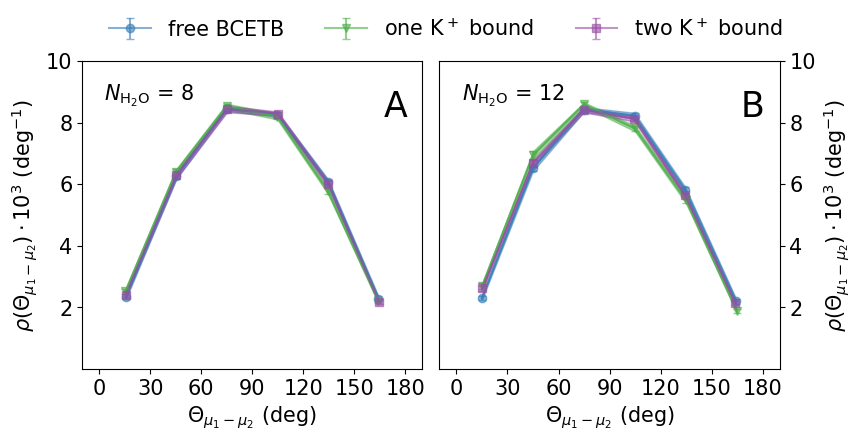

In [59]:
plotAngleHistograms([0,1,2], [1,2], [2,4], np.arange(8,13,4), 6, 20, 100, ["data/simulation/trajectories/ff_dft/kcl/closest_water/"], 2)

In [60]:
r1_reg_s = np.loadtxt('data/simulation/local_bulk_part_coeff/kscn/Nr_S_1.xvg', usecols=0, skiprows=24)
Nr1_reg_s = np.loadtxt('data/simulation/local_bulk_part_coeff/kscn/Nr_S_1.xvg', usecols=1, skiprows=24)
r2_reg_s = np.loadtxt('data/simulation/local_bulk_part_coeff/kscn/Nr_S_2.xvg', usecols=0, skiprows=24)
Nr2_reg_s = np.loadtxt('data/simulation/local_bulk_part_coeff/kscn/Nr_S_2.xvg', usecols=1, skiprows=24)

r1_reg_c = np.loadtxt('data/simulation/local_bulk_part_coeff/kscn/Nr_C_1.xvg', usecols=0, skiprows=24)
Nr1_reg_c = np.loadtxt('data/simulation/local_bulk_part_coeff/kscn/Nr_C_1.xvg', usecols=1, skiprows=24)
r2_reg_c = np.loadtxt('data/simulation/local_bulk_part_coeff/kscn/Nr_C_2.xvg', usecols=0, skiprows=24)
Nr2_reg_c = np.loadtxt('data/simulation/local_bulk_part_coeff/kscn/Nr_C_2.xvg', usecols=1, skiprows=24)

r1_reg_n = np.loadtxt('data/simulation/local_bulk_part_coeff/kscn/Nr_N_1.xvg', usecols=0, skiprows=24)
Nr1_reg_n = np.loadtxt('data/simulation/local_bulk_part_coeff/kscn/Nr_N_1.xvg', usecols=1, skiprows=24)
r2_reg_n = np.loadtxt('data/simulation/local_bulk_part_coeff/kscn/Nr_N_2.xvg', usecols=0, skiprows=24)
Nr2_reg_n = np.loadtxt('data/simulation/local_bulk_part_coeff/kscn/Nr_N_2.xvg', usecols=1, skiprows=24)

r1_reg_ow_scn = np.loadtxt('data/simulation/local_bulk_part_coeff/kscn/Nr_OW_1.xvg', usecols=0, skiprows=24)
Nr1_reg_ow_scn = np.loadtxt('data/simulation/local_bulk_part_coeff/kscn/Nr_OW_1.xvg', usecols=1, skiprows=24)
r2_reg_ow_scn = np.loadtxt('data/simulation/local_bulk_part_coeff/kscn/Nr_OW_2.xvg', usecols=0, skiprows=24)
Nr2_reg_ow_scn = np.loadtxt('data/simulation/local_bulk_part_coeff/kscn/Nr_OW_2.xvg', usecols=1, skiprows=24)

r1_reg_i = np.loadtxt('data/simulation/local_bulk_part_coeff/ki/Nr_1.xvg', usecols=0, skiprows=24)
Nr1_reg_i = np.loadtxt('data/simulation/local_bulk_part_coeff/ki/Nr_1.xvg', usecols=1, skiprows=24)
r2_reg_i = np.loadtxt('data/simulation/local_bulk_part_coeff/ki/Nr_2.xvg', usecols=0, skiprows=24)
Nr2_reg_i = np.loadtxt('data/simulation/local_bulk_part_coeff/ki/Nr_2.xvg', usecols=1, skiprows=24)

r1_reg_ow_i = np.loadtxt('data/simulation/local_bulk_part_coeff/ki/Nr_OW_1.xvg', usecols=0, skiprows=24)
Nr1_reg_ow_i = np.loadtxt('data/simulation/local_bulk_part_coeff/ki/Nr_OW_1.xvg', usecols=1, skiprows=24)
r2_reg_ow_i = np.loadtxt('data/simulation/local_bulk_part_coeff/ki/Nr_OW_2.xvg', usecols=0, skiprows=24)
Nr2_reg_ow_i = np.loadtxt('data/simulation/local_bulk_part_coeff/ki/Nr_OW_2.xvg', usecols=1, skiprows=24)

r1_reg_cl = np.loadtxt('data/simulation/local_bulk_part_coeff/kcl/Nr_1.xvg', usecols=0, skiprows=24)
Nr1_reg_cl = np.loadtxt('data/simulation/local_bulk_part_coeff/kcl/Nr_1.xvg', usecols=1, skiprows=24)
r2_reg_cl = np.loadtxt('data/simulation/local_bulk_part_coeff/kcl/Nr_2.xvg', usecols=0, skiprows=24)
Nr2_reg_cl = np.loadtxt('data/simulation/local_bulk_part_coeff/kcl/Nr_2.xvg', usecols=1, skiprows=24)

r1_reg_ow_cl = np.loadtxt('data/simulation/local_bulk_part_coeff/kcl/Nr_OW_1.xvg', usecols=0, skiprows=24)
Nr1_reg_ow_cl = np.loadtxt('data/simulation/local_bulk_part_coeff/kcl/Nr_OW_1.xvg', usecols=1, skiprows=24)
r2_reg_ow_cl = np.loadtxt('data/simulation/local_bulk_part_coeff/kcl/Nr_OW_2.xvg', usecols=0, skiprows=24)
Nr2_reg_ow_cl = np.loadtxt('data/simulation/local_bulk_part_coeff/kcl/Nr_OW_2.xvg', usecols=1, skiprows=24)

Figure 9


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


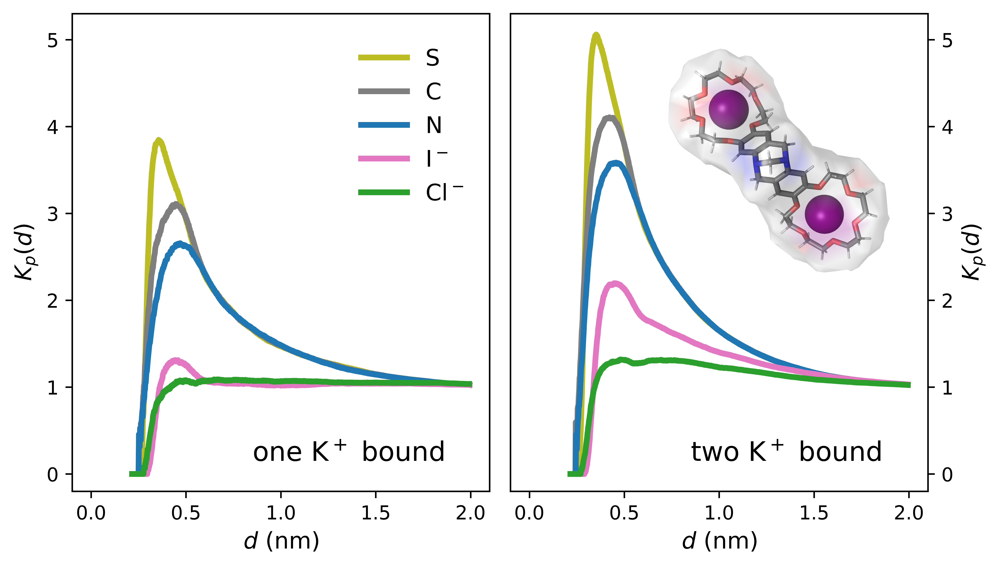

In [61]:
print("Figure 9")
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
plt.rcParams['figure.dpi']= 1000
fig, ((ax1, ax2)) = plt.subplots(1, 2, figsize=(8,4.5))

ax1.plot(r1_reg_ow_scn, (Nr1_reg_s)/(Nr1_reg_ow_scn/2151), label='S', color=colors[8], lw=3)
ax1.plot(r1_reg_ow_scn, (Nr1_reg_c)/(Nr2_reg_ow_scn/2151), label='C', color=colors[7], lw=3)
ax1.plot(r1_reg_ow_scn, (Nr1_reg_n)/(Nr2_reg_ow_scn/2151), label='N', color=colors[0], lw=3)
ax1.plot(r1_reg_ow_i, (Nr1_reg_i)/(Nr1_reg_ow_i/2151), label='I$^-$', color=colors[6], lw=3)
ax1.plot(r1_reg_ow_cl, (Nr1_reg_cl)/(Nr1_reg_ow_cl/2151), label='Cl$^-$', color=colors[2], lw=3)


ax1.annotate('one K$^+$ bound', (0.85, 0.15), fontsize=14)
ax1.set_xlim(-0.1,2.1)
ax1.set_ylim(-0.2,5.3)
ax1.set_ylabel('$K_p$($d$)', fontsize=12, labelpad=4)
ax1.set_xlabel('$d$ (nm)', fontsize=12)
ax2.plot(r2_reg_ow_scn, (Nr2_reg_s/2)/(Nr2_reg_ow_scn/2151), label='S', color=colors[8], lw=3)
ax2.plot(r2_reg_ow_scn, (Nr2_reg_c/2)/(Nr2_reg_ow_scn/2151), label='C', color=colors[7], lw=3)
ax2.plot(r2_reg_ow_scn, (Nr2_reg_n/2)/(Nr2_reg_ow_scn/2151), color=colors[0], lw=3)
ax2.plot(r2_reg_ow_i, (Nr2_reg_i/2)/(Nr2_reg_ow_i/2151), label='I$^-$', color=colors[6], lw=3)
ax2.plot(r2_reg_ow_cl, (Nr2_reg_cl/2)/(Nr2_reg_ow_cl/2151), label='Cl$^-$', color=colors[2], lw=3)

ax2.set_xlim(-0.1,2.1)
ax2.set_ylim(-0.2,5.3)
ax2.yaxis.tick_right()
ax2.annotate('two K$^+$ bound', (0.85, 0.15), fontsize=14)
ax2.set_ylabel('$K_p$($d$)', fontsize=12, labelpad=4)
ax2.set_xlabel('$d$ (nm)', fontsize=12)
ax2.yaxis.set_label_position("right")
bcetb_surface = img.imread('data/simulation/frames/2_K_bound/volumeShell.png') 
# Rotate image
bcetb_surface = ndimage.rotate(bcetb_surface, angle=135, reshape=True)
imagebox = OffsetImage(bcetb_surface, zoom=0.13)
ab = AnnotationBbox(imagebox, (1.3, 3.6), frameon=False)
ab.get_transform()
ax2.add_artist(ab)
ax1.legend(loc=(0.67,0.58), frameon=False, fontsize=12)
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.savefig('figs/cumRDFs.pdf')

## 3. Continuum electrostatics
Here, we derive the contribution from ion-ion interaction in water to the experimentally measured $\Delta \Delta H^{\mathrm{o}}_{\mathrm{bind}}$. The Gibb's free energy can be written according to:
$$
G = H -TS = H + T\frac{\partial G}{\partial T}
$$
The free energy of interaction between two charges can be given by the Coulomb energy. The interaction is regarded a free energy since it possesses the relative dielectric constant, which is temperature dependent. Here, we consider the interaction between two potassium ions ($\mathrm{K}^+$), separated by a distance $r$. 
$$
G_{++} = \frac{z_{\mathrm{K}}^2e^2}{4\pi\epsilon_0\epsilon_r r}
$$
The temperature derivative of this free energy of interaction is
$$
-S_{++} = \frac{\partial G_{++}}{\partial T} = \frac{e^2z_{\mathrm{K}}^2}{4\pi\epsilon_0 r}\frac{\partial(\frac{1}{\epsilon_r})}{\partial T} = \frac{z_{\mathrm{K}}^2e^2}{4\pi\epsilon_0 r}\frac{\partial(\frac{1}{\epsilon_r})}{\partial \epsilon_r}\frac{\partial \epsilon_r}{\partial T} = -\frac{z_{\mathrm{K}}^2e^2}{4\pi\epsilon_0 r_{ij}}\frac{1}{\epsilon_r^2}\frac{\partial \epsilon_r}{\partial T} = -G_{++}\left(\frac{1}{\epsilon_r}\frac{\partial \epsilon_r}{\partial T}\right)
$$
$$
-TS_{++} = -G_{++}\left(\frac{T}{\epsilon_r}\frac{\partial \epsilon_r}{\partial T}\right)
$$
From experiments we know that $\left(\frac{T}{\epsilon_r}\frac{\partial \epsilon_r}{\partial T}\right)=-1.37$, and hence,

$$
-TS_{++} = 1.37G_{\mathrm{K-K}}
$$
For the enthalpy, we get
$$
H_{++} = G_{++} + TS_{++} = G_{++}-1.37G_{++} = -0.37G_{++}
$$

In [62]:
N_A = 6.02214086e23 # Avogadros constant
eps_0 = 8.8541878128e-12 # vacuum permittivity
eps_r = 78.4 # dielectric constant of water at T = 298 K 
e = 1.60217662e-19 # elementary charge
conv1 = 10 # conversion factor Å/nm
conv2 = 1e-10 # conversion factor m/Å
conv3 = 4184 # converstion factor (J/kcal)
ind_K1 = 99 # index of first potassium ion 
ind_K2 = 101 # index of second potassium ion 
labels = ['No binding', '1 K⁺ bound', '2 K⁺ bound']
colors = ('green', 'orange', 'purple')
ff_labels = ("DFT charges", "OPLS-AA charges")
dist_mean = np.zeros(2)
G_mean = np.zeros(2)
H_mean = np.zeros(2)

for i, traj in enumerate([traj2_dft_298K, traj2_opl_298K]):
    dist = []
    G = []
    H = []
    for frame in range(traj.n_frames):
        # dist
        dist.append(np.linalg.norm(traj.xyz[frame][ind_K1] - traj.xyz[frame][ind_K2])*conv1) # distance between K's (Å)
        G.append(e**2*N_A/(4*np.pi*eps_0*eps_r*dist[frame]*conv2)/conv3) # free energy of interaction (kcal/mol)
        H.append(-0.37*e**2*N_A/(4*np.pi*eps_0*eps_r*dist[frame]*conv2)/conv3)
    dist_mean[i] = np.mean(dist)
    G_mean[i] = np.mean(G)
    H_mean[i] = -0.37*np.mean(G)
    label = labels[i]
    print("============================================================")
    print("Mean K+ - K+ distance, "+ff_labels[i]+" = ", np.round(dist_mean[i],2), "Å")
    print("Mean ratio of (theoretical) of interaction, "+ff_labels[i]+" = ", np.round(G_mean[i],2), " kcal/mol")
    print("Mean free energy of interaction, "+ff_labels[i]+" = ", np.round(G_mean[i],2), " kcal/mol")
    print("Mean enthalpy of interaction, "+ff_labels[i]+" = ", np.round(H_mean[i],2), " kcal/mol")
    print("Mean entropy of interaction, "+ff_labels[i]+" = ", np.round(np.mean(H_mean[i]-G_mean[i]),2), " kcal/mol")
print("============================================================")
print("Mean K+ - K+ distance averaged over both force fields = ", np.round(np.mean(dist_mean),2), "Å")
print("Mean free energy of interaction averaged over both force fields  = ", np.round(np.mean(G_mean),2), " kcal/mol")
print("Mean enthalpy of interaction averaged over both force fields = ", np.round(np.mean(H_mean),2), " kcal/mol")
print("Mean entropy of interaction averaged over both force fields = ", np.round(np.mean(H_mean)-np.mean(G_mean),2), " kcal/mol")

Mean K+ - K+ distance, DFT charges =  11.43 Å
Mean ratio of (theoretical) of interaction, DFT charges =  0.38  kcal/mol
Mean free energy of interaction, DFT charges =  0.38  kcal/mol
Mean enthalpy of interaction, DFT charges =  -0.14  kcal/mol
Mean entropy of interaction, DFT charges =  -0.51  kcal/mol
Mean K+ - K+ distance, OPLS-AA charges =  11.61 Å
Mean ratio of (theoretical) of interaction, OPLS-AA charges =  0.37  kcal/mol
Mean free energy of interaction, OPLS-AA charges =  0.37  kcal/mol
Mean enthalpy of interaction, OPLS-AA charges =  -0.14  kcal/mol
Mean entropy of interaction, OPLS-AA charges =  -0.51  kcal/mol
Mean K+ - K+ distance averaged over both force fields =  11.52 Å
Mean free energy of interaction averaged over both force fields  =  0.37  kcal/mol
Mean enthalpy of interaction averaged over both force fields =  -0.14  kcal/mol
Mean entropy of interaction averaged over both force fields =  -0.51  kcal/mol
